<a href="https://colab.research.google.com/github/Manalelaidouni/Blog-jupyter-notebooks-/blob/master/Copy_of_Analysis_and_modeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



<p align="center">

<img src="https://img.freepik.com/free-vector/flat-design-house-set_23-2148655382.jpg?w=996&t=st=1690148195~exp=1690148795~hmac=094bdb915b8aae629d4034191bfb373bb7256f87117f280c2ff678e1d8a858f9"   height="450" >

</p>



## 🎯 Problem and objective

**Objective**:

The prediction of real estate prices plays a crucial role in various aspects of the housing market, it can be used to provide valuable insights to investors such as identifying undervalued properties and help make informed decisions at the business level. It can also enable potential buyers to make informed decisions within their specific budget constraints.

Additionally, a proper analysis can  provide valuable insights to homeowners seeking to increase the value of their properties before placing it on the market, as they benefit from understanding which features contribute the most to a home's value and which ones might negatively impact it.

The primary goal of this project is to develop a predictive model that predicts the selling price of a given home in Ames, Iowa. Through
comprehensive regression analysis, we aim to build a robust and accurate predictive model that captures the underlying patterns in the data and allows us to make reliable predictions.

<br>

**Data Description**:

The data is connected to a  Kaggle competition. The Ames data set is divided into a labeled training set, and an unlabeled test set
The labeled data holds the records of 1460 property sales in Ames, Iowa from the years 2006 to 2010, with 79 explanatory variables giving detailed description the of residential homes, they include information about :

- Sale like sale price, sale condition, SaleType, MoSold, YrSold, etc.

- Building and structure information like the number of bedrooms, roof style, bilding type, foundation, overall quality and condition of the house, etc.

- Location like the general zoning classification, Neighborhood, etc.

- House amenities like fireplace, pool, air conditioning, electrical system, etc.


<br>

**Table of Content**:


[🎯 Problem and objective](#scrollTo=HeiOmJTJ4MKS)

[📥  Imports](#scrollTo=aFrVMI5M5Uo0)

[📂 Download dataset from Kaggle](#scrollTo=zZu4PRt9Ygc0)

[📝 Multiple Linear Regression](#scrollTo=-7qRH3FK28eu)

[🔍 Linearity assumption](#scrollTo=M3KxifXK3UeH)

[🧹 Impute missing data  | Data split](#scrollTo=79JB09272ouZ)

[🏷️ Encode categorical variables](#scrollTo=MyPYBkct5GpQ)

[🔧 Data Transformations to achieve linearity](#scrollTo=jypUfk375k_o)

[🔬 Check multicollinearity assumption](#scrollTo=rz2B0jGK_pZG)

[📈 Residuals diagnostic plots](#scrollTo=XW93gKqD4M6M)

[📊  Feature Selection](#scrollTo=4JYU8zYmtYTO)

>[Metrics implementation for model evaluation](#scrollTo=xWdK18TLHWkv)

>[Filter methods](#scrollTo=pOEGZZCFc1DI)

>[Embedded methods](#scrollTo=Q0vbNBGNc45J)

>[Wrapper methods](#scrollTo=C3Vn3kIxdEpE)

>[Permutation feature importance method](#scrollTo=RUn4YDEGdQgZ)

[🧠 Modeling](#scrollTo=GUPzQMuWj9-F)

>[Evaluate candidate models](#scrollTo=0ZFOAxEdwflK)

>[Hyperparameter tuning using Bayesian optimization](#scrollTo=C35QVlHMANuZ)

>[Stacking ensemble](#scrollTo=_edcmIbbuz5z)

[📌 Model Interpretation](#scrollTo=Hy6IKdY9Nwsy)



## 📥  Imports

In [1]:
import random
import os
import re
import timeit
import itertools
import joblib
import inspect
import warnings
warnings.simplefilter('ignore')
def ignore_warn(*args, **kwargs):
    pass
warnings.warn = ignore_warn # ignore annoying warning (from sklearn and seaborn)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from scipy import stats
import statsmodels.api as sm
from scipy.stats import probplot, skew, boxcox_normmax, kurtosis
from scipy.special import boxcox1p, inv_boxcox

from IPython.display import HTML, display
from statsmodels.nonparametric.smoothers_lowess import lowess

from sklearn.feature_selection import SelectKBest, f_regression, mutual_info_regression, SelectFromModel, RFE, RFECV
from sklearn.model_selection import train_test_split, cross_val_score, KFold, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder, LabelEncoder, OrdinalEncoder,RobustScaler, FunctionTransformer
from sklearn.compose import ColumnTransformer, TransformedTargetRegressor
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.inspection import permutation_importance
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression, ElasticNet, Lasso, Ridge, BayesianRidge, SGDRegressor, LassoCV, RidgeCV, ElasticNetCV
from sklearn.svm import SVR, LinearSVR
from sklearn.kernel_ridge import KernelRidge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, VotingRegressor,  ExtraTreesRegressor
from sklearn.exceptions import NotFittedError

from xgboost import plot_importance
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor

%config InlineBackend.figure_format = 'retina'

pd.set_option('display.max_columns',999)
# don't wrap repr(DataFrame) across additional lines
pd.set_option("display.expand_frame_repr", False)
# set max rows displayed in output to 25
pd.set_option("display.max_rows", 25)

<br>

## 📂 Download dataset from Kaggle

Through the Kaggle API provided with every account we can download any dataset directly from Kaggle to Google Colab, we first download the `kaggle.json` file locally, we then use it to get access to a list of Kaggle competitions datasets, one of which is the house price prediction dataset.

In [2]:
from google.colab import files
files.upload()

# create a directory called kaggle then copy the json file inside of it
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!ls ~/.kaggle

# install kaggle package
!pip install -q kaggle
!kaggle competitions download -c house-prices-advanced-regression-techniques

# unzip the dataset into a new folder
!unzip -q house-prices-advanced-regression-techniques.zip -d house-prices-advanced-regression-techniques
!rm house-prices-advanced-regression-techniques.zip

Saving kaggle.json to kaggle.json
kaggle.json
  0% 0.00/199k [00:00<?, ?B/s]
100% 199k/199k [00:00<00:00, 60.0MB/s]


In [3]:
train = pd.read_csv(r'/content/house-prices-advanced-regression-techniques/train.csv')
X_test = pd.read_csv(r'/content/house-prices-advanced-regression-techniques/test.csv')

In [4]:
# Save the 'Id' column
train_ID = train['Id']
test_ID = X_test['Id']

# Drop the 'Id' colum since it's unnecessary for  the prediction process.
train.drop("Id", axis = 1, inplace = True)
X_test.drop("Id", axis = 1, inplace = True)


<br>

##  📝 Multiple Linear Regression

Multiple linear regression aims to model the linear relationship between a set of indepedendent variables X and a dependent variable y with the goal of finding the optimal parameter estimates from our sample data that best reflect the population parameters. This enables us to make precise predictions of y from values of X, because the stringer the linear relationship between the variables, the more precise the predictions will be.


To model this linear relationship, we fit the following linear equation on the observed data, where y is the dependent variable and the set  are the independent variables.



$$Y = \beta_0 + \beta_1 x_1 + \beta_2 x_2 + ... + \beta_k x_k + \epsilon$$

where :

- $y$ : is the dependent or response variable.
- $x_1$, $x_2$, ..., $x_k$ : are the independent or predictor variables.
- $\epsilon$ : is the random error term, it refers to the portion in the response variable that is due to randomness and it’s not predictable from the set of predictor variables. It is a random variable that is assumed to follow a normal distribution with a mean of $0$ and a constant variance $σ²$. Put differently, the error term $\epsilon$ represents the variation in the dependent variable that cannot be explained by the independent variables included in the model.

<br>

We use least squares OLS method to search for regression coefficients (parameters) that construct the hyperplane that best fit the data. The least squares method searches for optimal coefficients that **minimize the sum of squares errors**, where the errors are the differences between the observed and predicted values. The parameters in this equations are called partial regression coefficients.

<br>

**Interpreting the coefficients of continuous predictors**: $\beta_1$ represents the marginal effect that variable $x_1$ has on $y$, it denotes the number of units that $y$ changes by when $x_1$ increases by one unit while keeping other terms constant.

<br>

**Interpreting the coefficients of categorical predictors** :

- *For a binary predictor* a variable with two categories, is encoded into 0s and 1s, where one category or level is assigned a value of 0 and the other category is assigned a value of 1. The category with the value of 0 is considered as the reference level. The coefficient estimate in this case represents the difference between the predicted value of the predictor variable for the category with value 1 compared to the reference category with value 0. In other words it tells us how much higher or lower the response variable is for the category with value 1 compared to the reference category.

- *For a multi-category predictor*, we use dummy encoding to create k-1 new variables, where k is the number of categories in the variable, while keeping one of the categories as a reference variable which is assigned values of 0s for all the k-1 dummy variables, it then compares each level to this reference level.

In summary, the regression coefficient $\beta$ of a categorical predictor always compares each category to the reference one.

<br>

**Interpreting the intercept** . The intercept term β0, represents the mean response E(y) when all the values of the predictors are zero,
but sometimes it's not meaningful to interpret the intercept term the same way as interpreting the coefficients.

<br>

**Formula to find regression coefficients** : In matrix notation, we add a column of 1s to the predictor matrix X to help estimate the intercept b0 this way it's suitable to apply the dot product between the two matrices.

$$
\textbf{y} = \textbf{X} \mathbf{\beta} + \mathbf{\epsilon}
$$

- $X$ : is an $n\times\ p$ matrix, where $p$ is the number of predictor variables and $n$ is the number of observations in the dataset.

- $β$ : is a $p +1 $ dimensional column vector that holds the p regression coefficients and the intercept term $β_0$.

- $\epsilon$ : is an $n$ dimensional column vector that holds the random error terms.

After derivation the least squares estimates in matrix notation are:

$$β = (X^{'}X)^{-1}X^{'}Y$$


where :
- $X^{'}$ is the transpose of the $X$ matrix.

- $(X^{'}X)^{-1}$ is the inverse of the $X^{'}X$ matrix

<br>

**Characteristics of optimal coefficient**.The set of coefficient estimators depend on the sample used, to ensure that the produced estimators are optimal they need to satistfy certain characteristics, they should be :

- *Unbiased* means that the expected value of the estimator is equal to the true value of the parameter.
- *Efficient* means that the estimator has a smaller variance than any other estimator.
- *Consistent* means that the bias and variance of the estimator approach zero as the sample size approaches infinity.

<br>

<a name="abcdef"></a>

**Linear regression assumptions**. Regression estimators are optimal when linear regression assumptions are satisfied, if these assumptions are violated,  then all (the results produced from all inferential tests would be incorrect) estimates, intervals, and hypothesis tests arising in a regression analysis are at risk of being incorrect. However the important thing to remember is that the severity of the consequences is always related to the severity of the violation.

- <font color="blue"> *Linearity* </font>:  Each predictor variable should be linearly correlated with the response variable. That is the unit of change in y should be constant when we increase the each predictor variable by one unit while keeping the rest of the variables constant. The stronger the linear relationship between the variables the more useful this predictor variable is in predicting y.

- <font color="blue"> *Independence of the observations*</font> : The observations in the dataset should be independent of one another, meaning the value that one observation takes does not dependent on the value of any other observation in the dataset. If the assumption is violated, it can lead to biased regression coefficients. Departure from this assumtion could be a result of measurement error and data was not sampled correctly.


- <font color="blue"> *No multicolinearity*</font> :
The predictor variables should not be highly correlated with each other. If this assumption is violated then the regression coefficients become unstable,  where the regression model generates widely different regression coefficients every time we fit it on a different dataset from the same population.

<br>

Assumptions related to the residuals (errors) which are the difference between the observed and predicted value :

- <font color="blue"> *Normality of the residuals*</font>: the residuals should follow a normal distribution with a mean of zero. This is important because many statistical tests and confidence intervals assume normality.

- <font color="blue"> *No autocorrelation - independence of the residuals* </font> : The residuals of the regression model should be independent of each other, that is the value of one residual is not influenced by the value of other residuals. If there is a departure of this assumption it indicates that there is crucial information that the model has not captured or has missed.



- <font color="blue"> *Homoscedasticity - homogeneity of the variance of the residuals* </font>: the variance of the residuals σ² is the same across the spectrum of all values of the predictor variables, more precisely the variance should not be a function of the explanatory variables X.






**Let's Identify types of numerical variables** :




In [5]:
numerical_cols = [col for col in train.select_dtypes(exclude='object') if col not in ['Id', 'SalePrice']]
categorical_cols = list(train.select_dtypes(include='object'))
print(f'There are {len(numerical_cols)} numerical features are :\n {numerical_cols}\n')
print(f'Meanwhile there are {len(categorical_cols)} categorical features which are:\n  {categorical_cols}')

There are 36 numerical features are :
 ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold']

Meanwhile there are 43 categorical features which are:
  ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '

Let's distinguish continuous variables from ordinal ones to inspect for their linearity later. It's worth noting that  `MSSubClass`  is considered a nominal variable not an ordinal one, meanwhile  `PoolArea`  is considered a continuous variable and not ordinal variable either, as a result we will be removing `MSSubClass`, `PoolArea` from the ordinal lists.

In [6]:
ordinal_cols = {col : list(train[col].unique()) for col in numerical_cols if train[col].nunique()<= 15 and col not in ['MSSubClass', 'PoolArea']}
print(f'These are {len(ordinal_cols)} ordinal variables in training set : \n {ordinal_cols}')

These are 13 ordinal variables in training set : 
 {'OverallQual': [7, 6, 8, 5, 9, 4, 10, 3, 1, 2], 'OverallCond': [5, 8, 6, 7, 4, 2, 3, 9, 1], 'BsmtFullBath': [1, 0, 2, 3], 'BsmtHalfBath': [0, 1, 2], 'FullBath': [2, 1, 3, 0], 'HalfBath': [1, 0, 2], 'BedroomAbvGr': [3, 4, 1, 2, 0, 5, 6, 8], 'KitchenAbvGr': [1, 2, 3, 0], 'TotRmsAbvGrd': [8, 6, 7, 9, 5, 11, 4, 10, 12, 3, 2, 14], 'Fireplaces': [0, 1, 2, 3], 'GarageCars': [2, 3, 1, 0, 4], 'MoSold': [2, 5, 9, 12, 10, 8, 11, 4, 1, 7, 3, 6], 'YrSold': [2008, 2007, 2006, 2009, 2010]}


In [7]:
test_ordinal_cols = {col : list(X_test[col].unique()) for col in numerical_cols if X_test[col].nunique()<= 15}
print(f'These are {len(test_ordinal_cols)} ordinal variables in testing set : \n {test_ordinal_cols}')

These are 16 ordinal variables in testing set : 
 {'OverallQual': [5, 6, 8, 7, 4, 9, 2, 3, 10, 1], 'OverallCond': [6, 5, 7, 8, 2, 9, 3, 4, 1], 'LowQualFinSF': [0, 362, 1064, 431, 436, 259, 312, 108, 697, 512, 114, 205, 80, 140, 450], 'BsmtFullBath': [0.0, 1.0, 2.0, 3.0, nan], 'BsmtHalfBath': [0.0, 1.0, nan, 2.0], 'FullBath': [1, 2, 3, 4, 0], 'HalfBath': [0, 1, 2], 'BedroomAbvGr': [2, 3, 4, 1, 6, 5, 0], 'KitchenAbvGr': [1, 2, 0], 'TotRmsAbvGrd': [5, 6, 7, 4, 10, 8, 9, 3, 12, 11, 13, 15], 'Fireplaces': [0, 1, 2, 3, 4], 'GarageCars': [1.0, 2.0, 3.0, 0.0, 4.0, 5.0, nan], '3SsnPorch': [0, 224, 255, 225, 360, 150, 153, 174, 120, 219, 176, 86, 323], 'PoolArea': [0, 144, 368, 444, 228, 561, 800], 'MoSold': [6, 3, 1, 4, 5, 2, 7, 10, 8, 11, 9, 12], 'YrSold': [2010, 2009, 2008, 2007, 2006]}


In [8]:
continuous_cols = [col for col in numerical_cols if col not in ordinal_cols and col!='MSSubClass' ]
print(f"The continuous variables are :\n {continuous_cols}")

The continuous variables are :
 ['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal']


<br>

## 🔍 Linearity assumption

**Linearity assumption refers to the linearity of the parameters
$βs$ and not the linearity of the features**. Linearity of the parameters means that there is a linear relationship between the  predictor variables and the response  variable that is the effect of a one-unit change in the predictor variable is a constant change in the response variable, while linearity of the features means the predictor variables need to be correlated with each other.

<br>

> **We only inspect for linearity of the continuous predictors and not of the categorical ones**, let's explain why is that the case :
- For a **binary predictor**, which has only two levels, the linearity assumption is always met, because when the means of the outcome for each level are connected, they will always produce a straight line.
- For a **multi-category predictor**, which has more than two levels, connecting the means of the outcome for each level will not produce a straight line. However, we can still treat a multi-category predictor as a binary problem, by plotting the mean of the outcome of each level against the rest of the categories as a single outcome. When we connect these two dots, it will constitute a straight line, and therefore the linearity assumption is always met for both binary and multi-category predictors.

<br>


**Inspecting for linearity**. we can test visually using a scatter plot between every predictor and response variable or we can get a quantitative feel for the degree of linear correlation by calculating **Pearson correlation coefficient**, we can also inspect **the observed vs predicted values plot** after fitting the model where the points should fall on a diagonal line if linearity is met.

<br>






> *As a reminder,   linear correlation refers to the degree and direction of the relationship between two variables x and y. If y changes by a constant amount as x increases by one unit, then x and y are said to be linearly correlated. The magnitude of the correlation coefficient measures the strength, meanwhile the direction of the linear relationship is indicated by the sign of the coefficient. The coefficient ranges between -1 and 1, where -1 indicates a perfectly negative linear relationship, 0 indicates no linear relationship, and 1 indicates a perfectly positive linear relationship. Specifically :*
- $[0, 0.1]$ : *No correlation.*
- $[0.1, 0.5]$ : *Weak +ve correlation.*
- $[0.5, 0.75]$ : *moderate +ve correlation.*
- $[0.75, 0.1]$ : *strong +ve correlation.*

<br>

Furthermore, the correlation coefficient tells us how many standard deviations that Y changes by when X changes by 1 standard deviation. Doesn't this sound very similar to the definition of the regression coefficient that we mentioned earlier? Let's clarify the difference :


- **Correlation coefficient** :
  - Measures how much two variables vary with each other, this variance is measured with std deviation.
  - Correlation coefficient indicate the number of std deviations that Y changes when $x$  changes by 1 std deviation. The correlation coefficient expresses relationship in terms of $z$ scores (standard deviations).

- **Regression coefficient** :

  - It represents the marginal effect of $x$ on $y$, that denotes the number of units that Y changes when X increases by one unit while keeping the rest of predictor variables constant.
  - The goal of finding the regression coefficients is to construct the regression line, which we can use to predict values of $y$ from values of $x$



Correlation coefficient is equal to the regression coefficient when both $x$ and $y$ are expressed as z score.

<br>

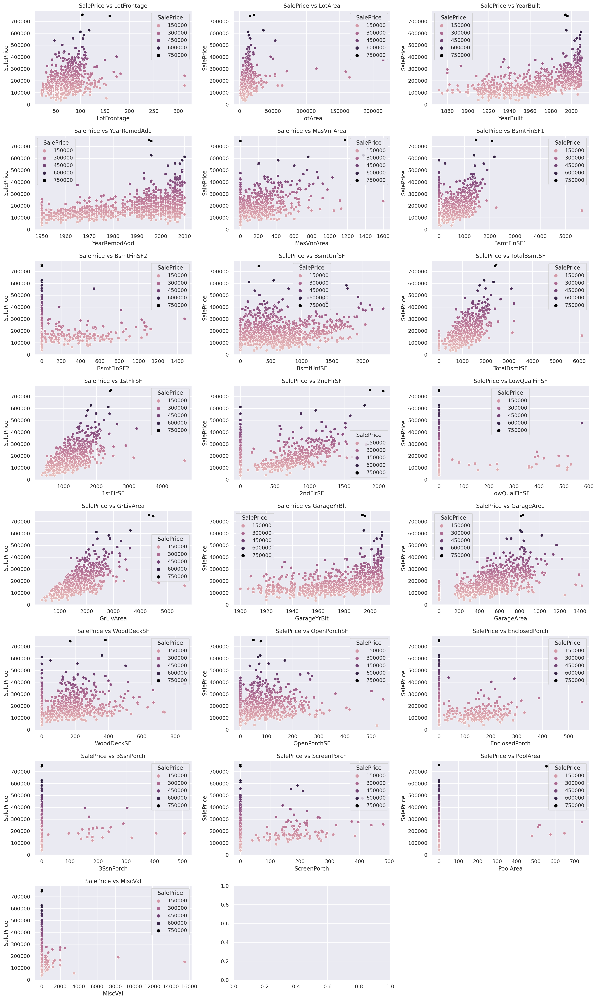

In [9]:
fig, ax = plt.subplots( 8, 3, figsize=(18, 30))
cmap = sns.cubehelix_palette(dark=0, light=0.8, as_cmap=True)

for idx, col in enumerate(continuous_cols, 1):
    plt.subplot(8, 3, idx)
    plt.title(f'SalePrice vs {col}')
    sns.scatterplot(data=train, x=col, y='SalePrice', hue='SalePrice', palette=cmap)

# to remove the last empty subplot
fig.delaxes(ax[-1][-1])
fig.tight_layout()
plt.show()

<br>

**Analysis of the scatter plots :**



- **Highly correlated features with sales price**. The scatter plots suggest that ground living area `GrLivArea`, basement area `TotalBsmtSF`,  `GarageArea` and first floor area `1stFlrSF` are all positively correlated with the house's selling price, that is, as these features increase, the house price tend to increase.


- **There are predictors that contain a lot of 0 values**. This signals the abscence of such facilites in the house such as the `PoolArea` and few types of porch `ScreenPorch`, `3SsnPorch`, or houses that don't have any Miscellaneous feature `MiscVal`.

- **Outliers in numeric features**. We can definitely detect some outliers in our predictors, like basement area `TotalBsmtSF` and first floor area `1stFlrSF`. These I don't think these outliers are due to recording or measurement error so they are not worth dropping.


- **Predictors that have a curvilinear relationship with sale price** : Some of the predictors have a non-linear relationship with the dependent variable such as  `BsmtFinSF1`, `LotFrontage` and `GarageYrBlt`.


<br>

This can be further verified using Pearson's correlation coefficient :

In [10]:
cor = train[continuous_cols + ['SalePrice']].corr().abs().unstack().sort_values(ascending=False).reset_index()
cor.loc[cor['level_0'] == 'SalePrice', :].head(20)

,level_0,level_1,0
22,SalePrice,SalePrice,1.000000
27,SalePrice,GrLivArea,0.708624
34,SalePrice,GarageArea,0.623431
36,SalePrice,TotalBsmtSF,0.613581
38,SalePrice,1stFlrSF,0.605852
46,SalePrice,YearBuilt,0.522897
50,SalePrice,YearRemodAdd,0.507101
57,SalePrice,GarageYrBlt,0.486362
62,SalePrice,MasVnrArea,0.477493
86,SalePrice,BsmtFinSF1,0.386420


As expected, the predictor variables that visually display a curvilinear relationship with the response variable `SalePrice` have a weak Pearson's correlation coefficient. For instance, `GarageYrBlt` with a coefficient of $0.48$ and `LotFrontage` with a value of $0.35$.

<br>

> *After examining the linear relationship between the response variable and each predictor and finding that not all predictors are linearly correlated with the response variable, we need to make some adjustments to the data to correct for non-linearity, we will address outliers by removing them and  apply a non-linear transformation to the response variable like the logarithm, square root, or reciprocal of x. These transformations once applied can change the distribution of the data, they can achieve normality in the variable by removing skewness. They are also found to achieve linearity between two variables once it's applied to one of the pair.*

<br>

After these adjustments, we will verify linearity by analyzing the `Residuals vs Fitted` and `Actual vs Fitted` plots. These plots will help us identify any non-linear relationships between the response variable and predictors.

However, to create these plot, we need to perform data preprocessing steps, including imputing missing values and encoding categorical variables to fit a linear regression model and calculate the residuals. If you wish to directly access the section on correcting for non-linearity, you can find it [here](#cell-id).
<br>

 ##  🧹 Impute missing data  | Data split
Split data to train and validation sets before missing data imputation, to avoid data leakage.



In [11]:
from sklearn.model_selection import train_test_split

seed = 1
# some methods use numpy like selectkbest, we set a seed to get consistent results
np.random.seed(seed)

train1, valid = train_test_split(train, test_size=0.2, random_state=seed)

y_train, y_valid = train1['SalePrice'], valid['SalePrice']
x_train, x_valid = train1.drop('SalePrice', axis=1), valid.drop('SalePrice', axis=1)

Let's visually explore the distribution of missing values in our datasets


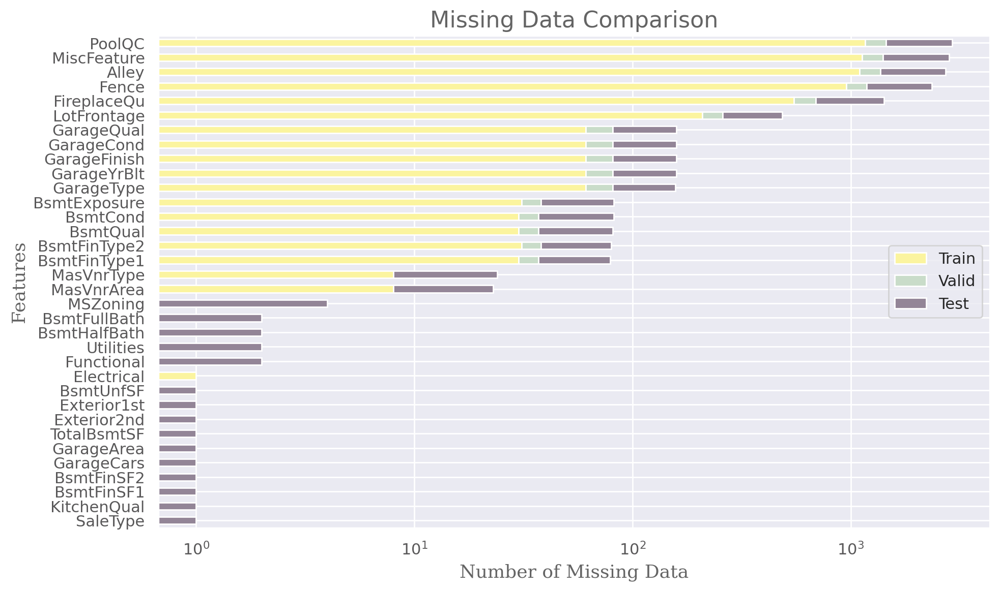

In [12]:
# Calculate the percentage of missing values for each dataset
miss_train = x_train.isnull().sum()
miss_valid = x_valid.isnull().sum()
miss_test = X_test.isnull().sum()


# Select features with missing values in any of the datasets


# Create a DataFrame to hold the missing values percentages for each dataset
missing_data = pd.DataFrame({'Train': miss_train[x_train.columns[x_train.isnull().sum() != 0]],
                            'Valid': miss_valid[x_valid.columns[x_valid.isnull().sum() != 0]],
                            'Test': miss_test[X_test.columns[X_test.isnull().sum() != 0]]})

# Sort the missing_data DataFrame by the sum of missing values across datasets
missing_data['Total'] = missing_data.sum(axis=1)
missing_data = missing_data.sort_values(by='Total', ascending=True)

# Plot the horizontal stacked bar plot
fig, ax = plt.subplots(figsize=(10, 6))

colors = ['#fbf49f','#c9dcc9', '#938597']
missing_data.drop(columns='Total').plot.barh(stacked=True, color=colors, ax=ax)

fontdict= {'family': 'serif', 'color':'#646464'}

ax.set_title('Missing Data Comparison', fontsize=16, color='#646464')
ax.set_xlabel('Number of Missing Data', fontsize=13,  fontdict=fontdict)
ax.set_ylabel('Features', fontsize=13,  fontdict=fontdict)

ax.set_xscale('log')

ax.xaxis.set_ticklabels(ax.xaxis.get_ticklabels(), color='#595859')
ax.yaxis.set_ticklabels(ax.yaxis.get_ticklabels(), color='#595859')

ax.legend(loc='center right')
plt.tight_layout()
plt.show()





<br>

> *It's important to note that I used a logarithmic scale to represent the number of missing data on the x-axis because it helps in visualizing both small and large values on the same plot. Given the significant difference in the number of missing values between the features, using a log scale allows for the compression of larger values while ensuring that smaller values remain clearly visible. Without the log scale, the features with a smaller number of missing values, located at the bottom of the plot, would not display a bar at all.*




We observe that certain features exhibit missing values across all sets of data (training, validation, and testing). Notably, the top features on the plot that contain a large number of missing values, while the bottom features only belong to the testing data and have significantly less number of missing data because the number of missing values is shown on a log scale. Consequently, our approach involves prioritizing the handling of shared features with missing values before addressing those specific to the testing data.




It is essential to highlight that we will be imputing missing data separately on the training, validation and testing sets to avoid data leakage, which occurs when information from the validation set is inadvertently used to train the model and there is a risk that the model will "see" information from the validation set during training, which could lead to overfitting and poor generalization performance on unseen data.

In [13]:
for data in [x_train, x_valid, X_test] :
    # Replace LotFrontage with median of each Neighborhood
    medianFrontage = data.pivot_table(index='Neighborhood', values='LotFrontage', aggfunc='median')

    data.loc[data['LotFrontage'].isnull(),'LotFrontage'] = data.loc[data['LotFrontage'].isnull(),'Neighborhood'].apply(lambda x: medianFrontage.loc[x]).astype(float) # converting to float because X_test converts to object in this part

    # replace houses that don't have a garage
    data.loc[data['GarageArea'] == 0, 'GarageYrBlt'] = 0

    data['MasVnrArea'] = data["MasVnrArea"].fillna(0.0)

    # for categorical vars, a lot of facilities could be replaced with NaN because they're not available in the house;
    # we will replace those with appropriate categories; the rest will be filled with None

    data.loc[data['PoolArea'] == 0.0, 'PoolQC'] = 'NoPool'

    for col in ['GarageFinish','GarageQual', 'GarageCond', 'GarageType']:
        data.loc[data['GarageArea'] == 0, col] = 'NoGarage'

    # Fill values of houses that don't have a basement
    for col in ['BsmtFinType2', 'BsmtExposure', 'BsmtQual', 'BsmtCond', 'BsmtFinType1']:
        data.loc[data['TotalBsmtSF'] == 0, col] = 'NoBasement'

    # Fill fireplaces of houses that don't have a fireplace
    data.loc[data["Fireplaces"] == 0, 'FireplaceQu'] = 'NoFireplace'

    # There is a correlation between  BsmtExposure and TotalBsmtSF.
    #The better the exposure of the basement, the larger the basement area.
    TopBsmtExposure = data.pivot_table(values='BsmtExposure', index ='BsmtFinType1', aggfunc=lambda x: x.mode())
    data.loc[data.BsmtExposure.isnull(), 'BsmtExposure'] = data.loc[data.BsmtExposure.isnull(), 'BsmtFinType1'].map(TopBsmtExposure['BsmtExposure'])

    # impute BsmtFinType2 with the most frequent category in BsmtFinType1
    # imputing missing values in 'BsmtFinType2' based on the most frequent category in 'BsmtFinType1'.
    TopBsmtFinType2 = data.pivot_table(index='BsmtFinType1', values='BsmtFinType2', aggfunc=lambda x: x.mode())
    data.loc[data['BsmtFinType2'].isnull(), 'BsmtFinType2'] = data.loc[data['BsmtFinType2'].isnull(), 'BsmtFinType1'].map(TopBsmtFinType2['BsmtFinType2'])

    # Fill with mode
    data['Electrical'].fillna(data['Electrical'].mode()[0], inplace=True)


    for col in ['PoolArea', 'MiscFeature','Alley', 'Fence', 'MasVnrType']:
        data[col] = data[col].fillna('None')

<br>

**The above imputation steps aim to fill the missing values in a meaningful way, here is the reasoning behind these data imputation techniques**:

- Since houses in the same neighborhood often have similar lot frontage values we are replacing `LotFrontage` with the median value for each neighborhood. This approach provides a more accurate estimation of missing values based on the characteristics of the surrounding houses.

- For houses with a `GarageArea` of 0, it can be inferred that these houses do not have a garage. Therefore, we are setting the `GarageYrBlt` of these houses to 0 to indicate the absence of a garage.

- The `MasVnrArea` column represents the masonry veneer area. For houses with missing values in this column, we fill them with 0.0 to indicate that these houses do not have any masonry veneer.

- Certain categorical variables related to facilities like pools, garages, basements, and fireplaces may have NaN values when the corresponding facility is not available in the house. For example, houses with a 'PoolArea' of 0 have no pool, so we replace the NaN values in the `PoolQC` column with `NoPool`. Similarly, we replace NaN values in other related columns like `GarageFinish`, `GarageQual`, `GarageCond`, `GarageType`, `BsmtFinType2`, `BsmtExposure`, `BsmtQual`, `BsmtCond`, and `BsmtFinType1` with appropriate categories such as `NoGarage` or `NoBasement` to indicate the absence of these facilities.

- There is a correlation between the `BsmtExposure` and `TotalBsmtSF` columns. We impute the missing values in `BsmtExposure` based on the most frequent category in `BsmtFinType1`. This helps to infer the 'BsmtExposure' value based on the type of basement finish.

- For houses with no fireplaces (indicated by `Fireplaces` value of 0), we replace the NaN values in the `FireplaceQu` column with `NoFireplace` to indicate the absence of a fireplace.


<br>

As mentioned earlier, there are a few features in the testing dataset that contain missing data which were not present in the training and validation sets. These features have only a small number of instances with missing values. To handle these cases, we will apply a straightforward approach for imputation. For numerical variables, we will fill the missing values with the mean of the variable, whereas, for categorical variables, we will impute the missing values with the mode, which represents the most frequent category in the variable.

<br>




In [14]:
still_null_cols = X_test.columns[X_test.isnull().any()]
print(f"There are {len(still_null_cols)} features with null values in the testing data :")

col_to_num_null = {}
for col in still_null_cols:
    col_to_num_null[col] = X_test.loc[X_test[col].isnull(), col].shape[0]

print("They have a small number of missing values in each of these features :")
for col, num_null in col_to_num_null.items():
    print(f"- {col}: {num_null} missing values")


There are 25 features with null values in the testing data :
They have a small number of missing values in each of these features :
- MSZoning: 4 missing values
- Utilities: 2 missing values
- Exterior1st: 1 missing values
- Exterior2nd: 1 missing values
- BsmtQual: 3 missing values
- BsmtCond: 4 missing values
- BsmtExposure: 1 missing values
- BsmtFinType1: 1 missing values
- BsmtFinSF1: 1 missing values
- BsmtFinType2: 1 missing values
- BsmtFinSF2: 1 missing values
- BsmtUnfSF: 1 missing values
- TotalBsmtSF: 1 missing values
- BsmtFullBath: 2 missing values
- BsmtHalfBath: 2 missing values
- KitchenQual: 1 missing values
- Functional: 2 missing values
- GarageYrBlt: 2 missing values
- GarageFinish: 2 missing values
- GarageCars: 1 missing values
- GarageArea: 1 missing values
- GarageQual: 2 missing values
- GarageCond: 2 missing values
- PoolQC: 3 missing values
- SaleType: 1 missing values


In [15]:
nan_num_test = [col for col in still_null_cols if col in numerical_cols]
nan_cat_test = [col for col in still_null_cols if col in categorical_cols]

# identify numerical and categorical variables with missing values
num_cols_test = []
cat_cols_test = []

for col in still_null_cols:
    if col in nan_num_test:
        num_cols_test.append(col)

    elif  col in nan_cat_test:
        cat_cols_test.append(col)

# impute missing values in numerical columns with mean
for col in num_cols_test:
    mean_value = X_test[col].mean()
    X_test[col].fillna(mean_value, inplace=True)

# impute missing values in categorical columns with mode
for col in cat_cols_test:
    mode_value = X_test[col].mode().values[0]
    X_test[col].fillna(mode_value, inplace=True)


In [16]:
datasets = [x_train, x_valid, X_test]

for data in datasets:
    missing_values = data.isnull().sum().sum()
    if missing_values > 0:
        print(f"There are still missing values in the dataset in {data}.")
        break
else:
    print("All missing values have been imputed.")

All missing values have been imputed.


<br>

> *All missing values have been successfully imputed in all datasets.*

<br>


##  🏷️ Encode categorical variables

After imputing missing data, the next step is to **encode the categorical features**. Categorical variables can be classified into two types, ordinal and nominal, and each requires a different encoding scheme:


* **Ordinal Data**  : variables with categories that have an inherent order. For this type of data we use **ordinal encoding**, where we map the categories to integer numbers specifying order, Alternatively, we can use the `LabelEncoder()`. The following features fall into this category : `BsmtCond`, `BsmtQual`, `HeatingQC`, `KitchenQual`, `FireplaceQu`, `GarageQual`, `GarageCond`, `PoolQC`, `BsmtFinType1`, `BsmtFinType2`, `Functional`, `GarageFinish`, `PavedDrive`, `Fence`, `LandSlope`, `Alley`, `Street`, `BsmtExposure`.


<br>

* **Nominal variables** : These variables have categories that do not have an inherent order or ranking. For encoding nominal variables, we have two options:

  *  **One-hot encoding** : This converts a variable with *n* categories into *n* binary variables, however it produces multicollinearity among various variables, which may lower the accuracy of the model. It is important to set the intercept to false in such cases.

  * **Dummy Encoding** : This approach creates *n-1* binary variables for a categorical variable with *n* categories. The final category serves as the reference and it's represented by 0 in the *n-1* binary variables.

<br>

> *Dummy encoding is preferred over one-hot encoding due to its ability to create fewer number of columns in the dataset and avoid the dummy variable trap.  With dummy encoding, the presence of one dummy variable can be inferred from the absence of the others, thereby reducing multicollinearity issues.*


<br>



In [17]:
# Encode ordinal features
# when using polynomial terms, for dataset in for dataset in [x_new_train, x_new_valid]
for dataset in [x_train, x_valid, X_test] :
  for col in ['BsmtCond', 'BsmtQual', 'HeatingQC','KitchenQual', 'FireplaceQu', 'GarageQual', 'GarageCond', 'PoolQC']:
      dataset[col] = pd.Categorical(dataset[col], categories=['Ex', 'Gd', 'Ta','Fa','Po'], ordered=True).codes

  for col in  ['BsmtFinType1', 'BsmtFinType2']:
      dataset[col] = pd.Categorical(dataset[col], categories=['GLQ', 'ALQ','BLQ','Rec', 'LwQ', 'Unf', 'NA'], ordered=True).codes

  dataset['Functional'] = pd.Categorical(dataset['Functional'], categories=['Min1', 'Min2','Mod','Maj1', 'Maj2', 'Sev', 'Sal'], ordered=True).codes
  dataset['GarageFinish'] = pd.Categorical(dataset['GarageFinish'], categories=['Fin', 'RFn', 'Unf','NA'], ordered=True).codes
  dataset['PavedDrive'] =  pd.Categorical(dataset['PavedDrive'], categories=['Y', 'P', 'N'], ordered=True).codes
  dataset['Fence'] =  pd.Categorical(dataset['Fence'], categories=['GdPrv', 'MnPrv', 'GdWo', 'MnWw',  'NA'], ordered=True).codes
  dataset['LandSlope'] =  pd.Categorical(dataset['LandSlope'], categories=['Gtl', 'Mod', 'Sev'], ordered=True).codes
  dataset['Alley'] =  pd.Categorical(dataset['Alley'], categories=['Grvl', 'Pave', 'NoAlley'], ordered=True).codes
  dataset['Street'] =  pd.Categorical(dataset['Street'], categories=['Grvl', 'Pave'], ordered=True).codes
  dataset['BsmtExposure'] = pd.Categorical(dataset['BsmtExposure'], categories=['Gd', 'Av', 'Mn', 'No', 'NoBasement'], ordered=True).codes

  dataset['MSSubClass'] = dataset['MSSubClass'].apply(str)

<br>

> **PROBLEM** : *When performing nominal encoding, an issue arises when certain nominal variables have categories that are present in one dataset but not in others. This creates a mismatch in the number of dummy variables between the datasets.*

In [18]:
for col in ['RoofMatl', 'Exterior1st']:
  print(f'- new level of {col} present only in validation set : ', list(set(x_valid[col].unique()) - set( x_train[col].unique())))
  print(f'- new level of {col} present only in training set : ', list(set(x_train[col].unique()) - set( x_valid[col].unique())))

- new level of RoofMatl present only in validation set :  ['Metal']
- new level of RoofMatl present only in training set :  ['Roll', 'Membran', 'ClyTile']
- new level of Exterior1st present only in validation set :  ['AsphShn']
- new level of Exterior1st present only in training set :  ['CBlock', 'ImStucc', 'Stone']


<br>

Even if we combine just training and validation sets so they can have the same shape, new categories will be missing from the testing set,
consequently, the test set will have a lower number of features compared to the combined set, here is an example :

In [19]:
temp_comb = pd.concat([x_train, x_valid], axis=0)

for col in ['Condition2','RoofMatl', 'Exterior1st', 'Heating', 'Electrical', 'Exterior2nd', 'MiscFeature', 'HouseStyle' ]:
  print(f'- new level of {col} present only in combined set and not in testing set : ', list(set(temp_comb[col].unique()) - set( X_test[col].unique())))

del temp_comb

- new level of Condition2 present only in combined set and not in testing set :  ['RRAe', 'RRNn', 'RRAn']
- new level of RoofMatl present only in combined set and not in testing set :  ['Metal', 'Roll', 'Membran', 'ClyTile']
- new level of Exterior1st present only in combined set and not in testing set :  ['ImStucc', 'Stone']
- new level of Heating present only in combined set and not in testing set :  ['Floor', 'OthW']
- new level of Electrical present only in combined set and not in testing set :  ['Mix']
- new level of Exterior2nd present only in combined set and not in testing set :  ['Other']
- new level of MiscFeature present only in combined set and not in testing set :  ['TenC']
- new level of HouseStyle present only in combined set and not in testing set :  ['2.5Fin']


<br>

> **Solution** : *to address this, we combine the training, validation and testing sets for dummy encoding, ensuring that all categories are included and consistent dummy variables are created. This prevents problems with missing dummy variables in the testing data, avoiding a mismatch in the number of features. Importantly, this approach does not cause data leakage as only the category names are shared between the datasets, not specific values or observations.*

In [20]:
# get the nominal vars, ordinal vars are already encoded
nominal_vars = list(x_train.select_dtypes(include='object'))

x_train['data_split'] = 'train'
x_valid['data_split'] = 'valid'
X_test['data_split'] = 'test'

combined_data = pd.concat([x_train, x_valid, X_test], axis=0)

# apply dummy encoding to nominal variables
combined_data = pd.get_dummies(combined_data, columns= nominal_vars, drop_first=True)

# split the data sets again
x_new_train = combined_data.loc[combined_data['data_split']=='train'].drop('data_split', axis=1)
x_new_valid = combined_data.loc[combined_data['data_split']=='valid'].drop('data_split', axis=1)
X_test = combined_data.loc[combined_data['data_split']=='test'].drop('data_split', axis=1)

del combined_data

print(f'There are {x_new_train.shape[1] - (x_train.shape[1]-1)} newly created dummy variables for {len(nominal_vars)} nominal variables.')
print(f'This increases the total number of features from {x_train.shape[1]} to {x_new_train.shape[1]}.')


There are 143 newly created dummy variables for 26 nominal variables.
This increases the total number of features from 80 to 222.


In [21]:
# Let's check if every categorical variable has been encoded
nominal_vars = list(x_new_train.select_dtypes(include='object'))
if len(nominal_vars)==0 :
  print('Every nominal variable has been encoded.')
else:
  print(f'There are still {len(nominal_vars)} nominal variables to be encoded.')

Every nominal variable has been encoded.


<a name="cell-id"></a>
## 🔧 Data Transformations to achieve linearity



> *We will be applying a non-linear transformation to the response variable and then removing outliers with large residuals to achieve the linearity assumption, we will examine residuals plots for a pattern to detect non-linear relationships between the response variable and the predictors.*

<br>

It's important to evaluate the distribution of the dependent variable, particularly its skewness and kurtosis, to examine  how the transformation affected the distribution of the variable. Let's run the analysis now :

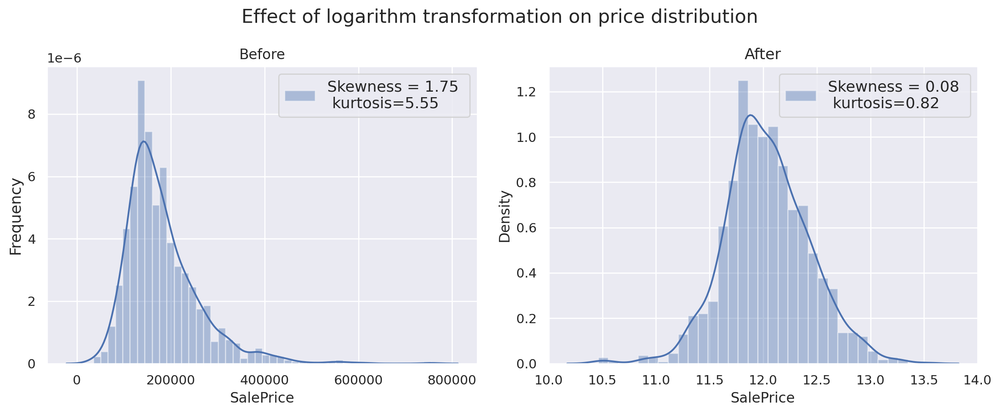

In [22]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

sns.distplot(y_train,ax=ax1, label=f"Skewness = {y_train.skew() :.2f} \n kurtosis={y_train.kurt():.2f}")
ax1.legend(fontsize=13, loc='upper right')
ax1.set_ylabel('Frequency', fontsize=13)
ax1.set_title('Before')

y_log_train = np.log1p(y_train)
y_log_valid = np.log1p(y_valid)

sns.distplot(y_log_train  ,ax=ax2, label=f"Skewness = {skew(y_log_train) :.2f} \n kurtosis={kurtosis(y_log_train):.2f}")
ax2.legend(fontsize=13, loc='upper right')
ax2.set_title('After', fontsize=13)
plt.suptitle('Effect of logarithm transformation on price distribution', fontsize=16)
plt.tight_layout();

In this graph, we are comparing the kernel density plot (KDE) of the `SalePrice` variable before and after transforming it. KDE is a smoother version of histogram which estimates the probability density function of any continuous random variable. The KDE plot shows that the original distribution of the `SalePrice` variable is positively skewed, this is a logical outcome since few houses tend to have extremely high prices,, which are represented as points on the right side of the plot.

<br>

**Analysing skewness and kutosis measures**  : Skewness and kurtosis are two descriptive statistics that describe the shape of a distribution, where skewness measures the degree of asymmetry in the distribution while kurtosis measures the peakedness and thickness of the tails.



- **Skewness**. A normal distribution has a bell curve where most of the data falls in the middle and it's symmetrical, i.e data is distributed equally on both sides of the central point. A normally distributed variable has a skewness value between $[-0.5, 0.5]$ indicating little to no skewness while anything outside of this range indicates a highly skewed distribution, with the sign indicating the direction of the skew.

<br>

> *The dependent variable has a skewness value of $1.75$ which indicates a positively skewed distribution, after applying the logarithm function to the variable, the skewness is reduced to $0.08$ falling within the normal range.*



<br>

- **Kurtosis**. Kurtosis is a measure of the distribution of data, it measures the extent to which the data is spread out in the tails of the distribution, compared to the center. If the kurtosis value is greater than $3$, it indicates that the data has more points in the tails than in the center, that is, a heavier-tailed distribution than a normal distribution. Conversely, if the kurtosis value is less than $3$, the data has fewer points in the tails compared to the center, indicating a lighter-tailed distribution than a normal distribution.

<br>

> *The original `SalePrice` variable has a high kurtosis value of $5.55$. This heavy tail is likely due to the presence of outliers, which can increase the variance of the data and lead to a high kurtosis value. After the non-linear transformation, the kurtosis of the variable decreases to $0.82$, suggesting a more moderate tail behavior.*

<br>


In [23]:
from IPython.display import display

def run_ols_summary(X, y, summary_as_html=False):
    # with statsmodels
    x = sm.add_constant(X) # adding a constant
    model = sm.OLS(list(y), x).fit()
    summary = model.summary()
    if summary_as_html:
        summary = display(HTML(summary.tables[0].as_html()
            .replace('<th>  Adj. R-squared:    </th>', '<th style="background-color:#aec7e8;">  Adj. R-squared:  </th>')))

    return summary



Let's check the model performance before and after applying the logarithm transformation on the response variable:

In [24]:
print('Before transforming y variable :')
before_summary = run_ols_summary(x_new_train, y_train, summary_as_html=True)
print(before_summary)

print('After transforming y variable :')
after_summary = run_ols_summary(x_new_train, y_log_train, summary_as_html=True)
print(after_summary)

Before transforming y variable :


Dep. Variable:,y,R-squared:,0.925
Model:,OLS,Adj. R-squared:,0.909
Method:,Least Squares,F-statistic:,55.27
Date:,"Sat, 05 Aug 2023",Prob (F-statistic):,0.00
Time:,14:24:07,Log-Likelihood:,-13299.
No. Observations:,1168,AIC:,2.703e+04
Df Residuals:,953,BIC:,2.812e+04
Df Model:,214,,
Covariance Type:,nonrobust,,


None
After transforming y variable :


Dep. Variable:,y,R-squared:,0.944
Model:,OLS,Adj. R-squared:,0.931
Method:,Least Squares,F-statistic:,74.72
Date:,"Sat, 05 Aug 2023",Prob (F-statistic):,0.00
Time:,14:24:07,Log-Likelihood:,1110.5
No. Observations:,1168,AIC:,-1791.
Df Residuals:,953,BIC:,-702.4
Df Model:,214,,
Covariance Type:,nonrobust,,


None


> *Conclusion of effect of normalizing target variable on model performance :  It looks like adjusted R-squared has improved from	0.909 to 0.931.*

<br>




**let's now check the effect of outliers on model performance :**

An outlier point is a point that deviates from the main cluster of data points and is characterized by a large residual. Outliers can have a significant impact on models, particularly in the context of linear regression.

When outliers are present in the dataset, they have the potential to influence the regression line, due to their extreme values outliers can pull the regression line towards their direction, causing it to deviate from the general trend exhibited by the majority of the data points. As a result, outliers can distort the linear regression model and affect its accuracy in representing the underlying pattern of the data.

<br>

Additionally, the removal of outliers can have a significant impact on meeting the assumptions of linear regression, particularly in the context of residual analysis where we examine the patterns and characteristics of the residuals (the differences between the observed and predicted values) to assess the validity of the linear regression model.

<br>





In [25]:
def detect_outliers_residuals(X, y, top=150):
    """ Identify and remove the observations with the largest residuals. """
    x = sm.add_constant(X) # adding a constant
    model = sm.OLS(list(y), x).fit()
    y_pred = model.predict(x)
    residuals = abs(y) - abs(y_pred)

    # get top largest residuals
    # get abs value to get both largest positive and negative residuals
    data = zip(list(x.index), np.abs(residuals), residuals)
    sorted_data = sorted(data, key=lambda x: x[1], reverse=True)

    # the returned outler_res should not be in absolute value
    indices, _,outlier_res =  zip(*sorted_data[: top])

    return model, indices, y, y_pred, residuals, outlier_res



# identify outliers with largest residuals
model, outliers, y_log_train, y_pred, residuals, res_outlier  = detect_outliers_residuals(x_new_train, y_log_train)

# get (y_pred, y) coordinates for outlier points for plotting
y_outliers = []
y_pred_outliers = []
for index in outliers :
  y_pred_outliers.append(y_pred[index])
  y_outliers.append(y_log_train[index])

Now that we've detected the outliers, let's plot the Actual vs Fitted plot along with Residuals vs Fitted plot to visually inspect them :

In [26]:
class ResidualsPlot:
  def __init__(self, y_obs, y_pred, model, residuals, suptitle, with_outliers=False, y_outliers=None, y_pred_outliers=None, res_outlier=None):
    self.y_obs = y_obs
    self.y_pred = y_pred
    self.model = model
    self.residuals = residuals
    self.suptitle = suptitle
    self.with_outliers = with_outliers
    self.y_outliers = y_outliers
    self.y_pred_outliers = y_pred_outliers
    self.res_outlier = res_outlier


  def plot_actual_vs_fitted(self, ax=None):
    if ax is None:
      fig, ax = plt.subplots()

    if self.with_outliers:
      if self.y_outliers is None or self.y_pred_outliers is None or self.res_outlier is None:
        raise ValueError("Both y_outliers and y_pred_outliers must be provided if with_outliers is enabled.")

    # to fit regression line
    fit = np.polyfit(self.y_pred, self.y_obs, 1)
    fit_fn = np.poly1d(fit)

    # Actual vs Fitted plot
    ax.scatter(self.y_obs, self.y_pred)
    if self.with_outliers:
      ax.scatter(self.y_outliers, self.y_pred_outliers,c='red')
    ax.plot(y_pred, fit_fn(y_pred), color='black', linestyle='--')
    ax.set_title('Actual vs Fitted')
    ax.set_xlabel('Observed values')
    ax.set_ylabel('Fitted values')


  def plot_residuals_vs_fitted(self, ax=None):
    '''Residuals vs Fitted plot is used to detect non-linearity, unequal error variances, and outliers'''
    if ax is None:
      fig, ax = plt.subplots()

    if self.with_outliers:
      if self.y_outliers is None or self.y_pred_outliers is None:
        raise ValueError("Both y_outliers and y_pred_outliers must be provided if with_outliers is enabled.")

    # calculate adjusted R-squared score : Adjusted-R2 = 1 – [(1-R2)*(n-1)/(n-k-1)]
    ax.scatter(self.y_pred, self.residuals, label=f'Adjusted-R² = {self.model.rsquared_adj:.4f}')
    ax.legend(loc='best', markerfirst=False, shadow=True, fontsize=14)
    if self.with_outliers:
      ax.scatter(self.y_pred_outliers, self.res_outlier, c='red')
    ax.axhline(y=0,  color='black', linestyle='--')
    ax.set_ylim(min(residuals)-1, max(residuals)+1)
    ax.set_title('Residuals vs Fitted')
    ax.set_xlabel('Fitted values')
    ax.set_ylabel('Residuals')


  def plot_both(self, nrows =1, ncols=2, figsize=(15,6), size=18):
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    plt.suptitle(self.suptitle, size=size)
    self.plot_actual_vs_fitted(ax= axes[0])
    self.plot_residuals_vs_fitted(ax= axes[1])
    fig.tight_layout()
    plt.show()


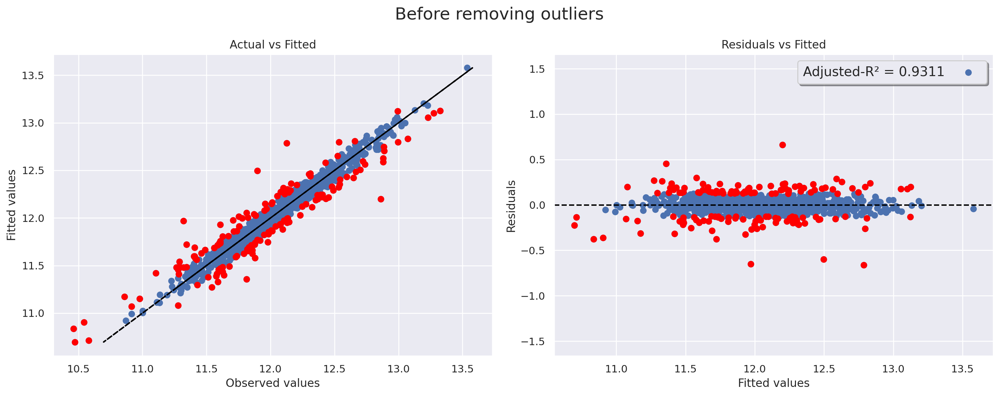

In [27]:
residual_plot = ResidualsPlot(y_log_train, y_pred, model, residuals, "Before removing outliers", with_outliers=True, y_outliers=y_outliers, y_pred_outliers=y_pred_outliers, res_outlier=res_outlier)
residual_plot.plot_both()


**Now let's remove these outlier observations from training set and check the plots again**  :


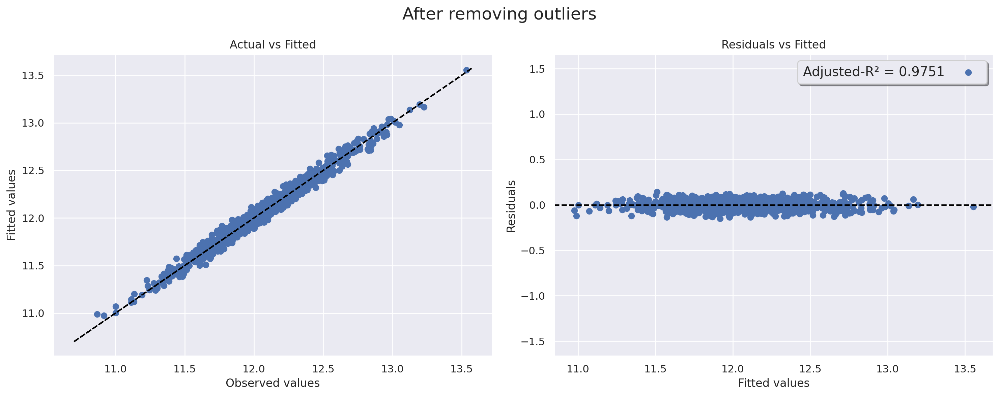

In [28]:
# get clean training data without outliers
x_new_train_clean = x_new_train.drop(list(outliers), axis=0)
y_log_train_clean =  y_log_train.drop(list(outliers))

# fit OLS on cleaned data
x = sm.add_constant(x_new_train_clean)
model = sm.OLS(list(y_log_train_clean), x).fit()
y_pred_clean = model.predict(x)
res = abs(y_log_train_clean) - abs(y_pred_clean)

# plot the residuals plot
residual_plot = ResidualsPlot(y_log_train_clean, y_pred_clean, model, res, "After removing outliers", with_outliers=False)
residual_plot.plot_both()

<br>

**Final conclusions about linearity assumption and outliers** :
The usual method to check for linearity is by plotting each of the independent variables  against the predictor variable, however in the case of a multiple linear regession problem with a large number of predictors, this quickly become not practical, therefore we examine the residuals vs fitted  and Actual vs Fitted plots for pattern to detect non-linear relationships between the response variable and the predictors.


- In the **Actual vs Fitted plot**, we plot the actual values of the response variable against the predicted values from the model. The points are scattered perfectly around the diagonal line and not in a non-linear pattern or a curve form, which suggests that the linearity assumption is met.


- In the **residuals vs fitted plot**, we plot the residuals  against the predicted values from the model. It looks like the points are scattered randomly around the horizontal 0 line, this further confirms the linearity claim.

<br>

>  *Additionally, it looks like the **Adjusted R²** value has also increased from 0.9311 to 0.9751 after removing outliers from training set, which implies that removing the outliers has improved the model performance.*

<br>




> We can now conclude that the assumption of linearity is met.

<br>

## 🔬 Check multicollinearity assumption


As we mentioned [earlier](#abcdef), multicollinearity occurs when two or more predictor variables are highly correlated, leading to inflated standard error of the regression coefficients causing unstable coefficients and unreliable p-values.

We can inspect for multicollinearity using a **bivariate Pearson correlation matrix** (pair-wise correlation coefficient) that is visualized in a heat map, where Pearson correlation coefficient is used to measure the strength of linear correlation between each pair of predictors. Another approach is to use **the variance inflation factor** (VIF) of each numerical predictor variable. **VIF** of a certain variable measures the extent to which the variance of a regression coefficient is inflated when multicollinearity exists in the regression model. To calculate VIF, we regress each explanatory variable against the rest of explanatory variables, that is $y=x_1$, and obtain the predictive power of the model using the coefficient of determination R², which is then used in the VIF formula  :
<br>

$$VIF_i = \dfrac {1}{(1-R^²)}$$




<br>

**Action steps** :

To address multicollinearity, we need to identify and remove **problematic predictors**, we will take into consideration the following factors to make an informed decision on which predictors to drop :

- **VIF values**. We will compute the Variance Inflation Factor (VIF) values for each predictor. A **high VIF value** greater than 10 indicates high correlation with other predictors and should be considered for removal.

<br>

- **Pearson correlation coefficient**. We will identify pairs of predictors with a **high pairwise Pearson correlation coefficient** greater than 0.5 using the heatmap, as they are measuring similar information. These predictors should also be considered for removal.

<br>

- **Statistical significance between the predictor and reponse variable**. We will evaluate the significance of predictors by computing the **p-value of the T-test**. The t-test statistic helps to determine the correlation between the response and the predictor variable, and we want to keep only those variables that are significant in predicting the target variable and have a meaningful relationship with it. Non-significant predictors may not contribute significantly to the model, and can be considered for removal.

<br>

- **Correlation between each predictor and response variable**. A predictor with the **least association with the response variable**, that is least correlated with it,  is the least useful in predicting the outcome and can negatively impact the overall performance of the model, therefore can be considered for removal.

<br>

We will implement all of these steps in the `PredictorDropAnalysis` class :


In [29]:
class PredictorDropAnalysis:
  def __init__(self, x, y, nominal_vars):
    self.x = x
    self.y = y
    self.nominal_vars = nominal_vars


  def get_pairwise_correlation(self, continuous_cols, get_high_pairs=False):
    correlate = self.x[continuous_cols].corr().abs().unstack().sort_values(ascending=False).reset_index()
    diff_cols = correlate.loc[correlate['level_0']  != correlate['level_1'] , :]
    corr_df = diff_cols.loc[correlate[0]>0.5, :].loc[::2, :].rename(columns={0 : 'corr_coeff', 'level_0': 'variable_1', 'level_1': 'variable_2' })
    if get_high_pairs:
      return set(corr_df.loc[:, ['variable_1', 'variable_2']].values.flatten())
    return corr_df


  def get_high_vif_vars(self, continuous_cols, high_vif_only=False, verbose=False):
    vif_data = pd.DataFrame()
    vif_data["Variable"] = self.x.columns
    vif_data["VIF"] = [variance_inflation_factor(self.x.values, i) for i in range(len(self.x.columns))]
    vif_data.set_index('Variable', inplace=True)
    # only for continuous variables
    vif_num = vif_data.loc[continuous_cols]
    vif_num.sort_values(by='VIF', ascending=False)
    if high_vif_only:
      high_vifs = dict(vif_num.loc[vif_num['VIF']>10, 'VIF'])
      if verbose:
        if len(high_vifs)>= 1:
          print(f"The following predictors have a high VIF values :\n{high_vifs}")
        else :
          print("There is no variable with a higher VIF value than 10.")
      return  high_vifs
    # otherwise get sorted VIFs
    else:
      return vif_num


  def get_all_problematic_vars(self, continuous_cols, high_corr_pairs=None, high_vif_vars=None):
    if high_corr_pairs is None:
      high_corr_pairs = self.get_pairwise_correlation(continuous_cols, get_high_pairs=True)
    if high_vif_vars is None:
      high_vif_vars = self.get_high_vif_vars(continuous_cols, high_vif_only=True)
    problematic_vars = set(list(high_corr_pairs) + list(high_vif_vars))
    problematic_vars = problematic_vars - set(self.nominal_vars)
    return problematic_vars


  def get_significance(self, problematic_vars=None):
    if problematic_vars is None:
      problematic_vars = self.get_all_problematic_vars()

    # add constant to predictor variables
    x = sm.add_constant(self.x)
    # fit linear regression model
    model = sm.OLS(self.y, x).fit()
    summary_table_html = model.summary().tables[1].as_html()
    p_values = pd.read_html(summary_table_html, header=0, index_col=0)[0].loc[:, 'P>|t|']

    # identify all predictors that are non-significant
    non_significant_vars = list(p_values.loc[p_values >= 0.05].index)
    # identify all predictors that are significant
    significant_vars = list(p_values.loc[p_values < 0.05].index)

    # identify problematic predictors that are non-significant
    problematic_non_sig_vars = [var for var in problematic_vars if var in non_significant_vars]
    # identify problematic predictors that are significant
    problematic_sig_vars = [var for var in problematic_vars if var in significant_vars]
    return problematic_non_sig_vars, problematic_sig_vars


  def get_correlation_with_y(self, problematic_vars=None):
    if problematic_vars is None:
      problematic_vars = self.get_problematic_vars()

    df = pd.concat([self.x[problematic_vars], self.y], axis=1)
    cor = df.corr().abs().unstack().sort_values(ascending=False).reset_index().rename(columns={0:'corr_coeff'})

    # from problematic vars (with high vifs and high corr coeff) identify the least correlated ones with y
    low_correlated_with_y = cor.loc[(cor['level_0'] == 'SalePrice') & (cor['corr_coeff'] < 0.5), 'level_1'].values
    return list(low_correlated_with_y)


In [30]:
# remove yearbuilt from continuous cols
continuous_cols.remove('YearBuilt')
drop_analysis = PredictorDropAnalysis(x_new_train_clean, y_log_train_clean, nominal_vars)

Let's calculate VIF of predictors:

In [31]:
# print the number of high VIF variables found
high_vif_vars = drop_analysis.get_high_vif_vars(continuous_cols, high_vif_only=True)
print(f"{len(high_vif_vars)} predictors have a high VIF value greater than 10:\n{high_vif_vars}")


14 predictors have a high VIF value greater than 10:
{'LotFrontage': 33.59733716770646, 'YearRemodAdd': 36987.65542581764, 'BsmtFinSF1': inf, 'BsmtFinSF2': inf, 'BsmtUnfSF': inf, 'TotalBsmtSF': inf, '1stFlrSF': inf, '2ndFlrSF': inf, 'LowQualFinSF': inf, 'GrLivArea': inf, 'GarageYrBlt': 49505.86243576502, 'GarageArea': 53.45773840042072, 'PoolArea': 88.41265475927271, 'MiscVal': 34.70483740749599}


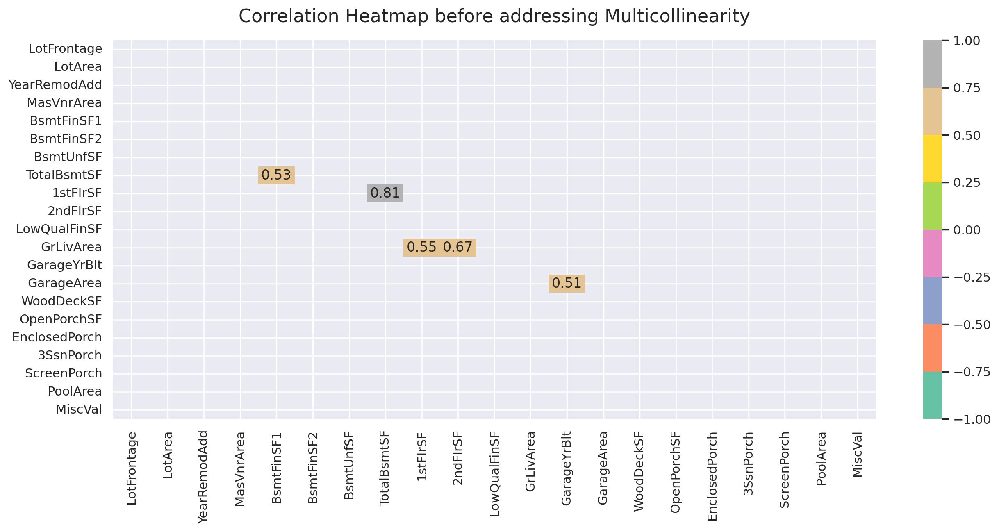

In [32]:
# plot scatter plot to show correlation heat map of continuous predictors
# pair-wise correlation matrix
corr_mat = x_new_train_clean[continuous_cols].corr().abs()

# split the matrix diagonally into triangle
# mask removes bottom matrix triangle
mask = np.triu(np.ones_like(corr_mat, dtype=np.bool))

keep_corr = 0.49

# the mask is the part to remove from the matrix with True values
mask = mask | (np.abs(corr_mat) <= keep_corr)
corr_mat = corr_mat[~mask]

plt.figure(figsize=(15,6))

cmap = sns.color_palette("Set2")
#cmap = sns.diverging_palette(230, 20, as_cmap=True)
#cmap=sns.color_palette("rocket")

heatmap = sns.heatmap(corr_mat, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap=cmap)

heatmap.set_title('Correlation Heatmap before addressing Multicollinearity', fontdict={'fontsize': 16}, pad=16);

**Interpreting the heatmap**. After analyzing the heatmap, we found some highly correlated predictors that could be measuring almost the same thing, which can lead to multicollinearity issues.

- `1stFlrSF`: This variable is highly correlated with `TotalBsmtSF` (correlation coefficient of 0.811701), which means that they are measuring almost the same thing. Moreover, `TotalBsmtSF` includes the first floor area, as well as the basement area, which makes it a more informative variable. Therefore, **`1stFlrSF` can be dropped**. Furthermore, they are both significant and highly correlated with `SalePrice` (calculated below).

- `2ndFlrSF` and `GrLivArea` are correlated with 0.68, **`2ndFlrSF` can be dropped**. Furthermore, `2ndFlrSF` is the least correlated with `SalePrice`.

- `GarageYrBlt`: This variable is highly correlated with `YearBuilt` (correlation coefficient of 0.582562), which makes sense because a garage is usually built at the same time as the house. Therefore, **`GarageYrBlt` can be dropped**, also because `GarageYrBlt` is a non-significant and has low correlation with `SalePrice`.

- For the correlated pair `GarageArea` and `GarageYrBlt`, we've already decided to drop `GarageYrBlt`.

- The pair of `TotalBsmtSF` and `BsmtFinSF1` has a correlation coefficient of 0.520332, which indicates a moderate positive correlation. Moreover, `TotalBsmtSF` includes all types of basement finished area, which makes it a more informative variable. Therefore, **`BsmtFinSF1` can be dropped**. Furthermore, `BsmtFinSF1` has low correlation with `SalePrice` while `TotalBsmtSF` has high correlation with it but they are both significant.



Overall, these variables were chosen for dropping based on their correlation with other variables and their significance with the target variable. By dropping these variables, we can reduce the risk of multicollinearity and improve the performance of our model.



In [33]:
to_drop_from_heatmap = [ '1stFlrSF', '2ndFlrSF', 'GarageYrBlt' , 'BsmtFinSF1']

In [34]:
# The number of highly correlated variable pairs found
high_corr_pairs = drop_analysis.get_pairwise_correlation(continuous_cols, get_high_pairs=True)
print(f"{len(high_corr_pairs)} sets of predictors are highly correlated with each other:\n{high_corr_pairs}")

# The number of problematic variables found
problematic_vars = drop_analysis.get_all_problematic_vars(continuous_cols, high_corr_pairs=high_corr_pairs, high_vif_vars=high_vif_vars)
print(f"\n{len(problematic_vars)} predictors have high VIF values and are part of highly correlated pairs:\n{problematic_vars}")

7 sets of predictors are highly correlated with each other:
{'TotalBsmtSF', 'GarageArea', 'BsmtFinSF1', 'GrLivArea', '1stFlrSF', '2ndFlrSF', 'GarageYrBlt'}

14 predictors have high VIF values and are part of highly correlated pairs:
{'MiscVal', 'TotalBsmtSF', 'LotFrontage', 'GarageArea', 'LowQualFinSF', 'BsmtFinSF1', 'GrLivArea', 'BsmtFinSF2', 'BsmtUnfSF', 'PoolArea', '1stFlrSF', 'YearRemodAdd', '2ndFlrSF', 'GarageYrBlt'}


T-tests are used to test the statistical significance of the relationship between each predictor variable and the response 'SalePrice' variable. The null hypothesis is that there is no relationship between the two variables. If the T-tes has a p-value that is very small (p < 0.001) it indicates that the relationship is statistically significant.

In [35]:
# Problematic variables that are significant and non-significant
problematic_non_sig_vars, problematic_sig_vars = drop_analysis.get_significance(problematic_vars=problematic_vars)
print(f"{len(problematic_sig_vars)} problematic predictors are significant according to t Test:\n{problematic_sig_vars}")
print(f"\n{len(problematic_non_sig_vars)} problematic predictors are non significant according to t Test:\n{problematic_non_sig_vars}")

8 problematic predictors are significant according to t Test:
['TotalBsmtSF', 'LotFrontage', 'GarageArea', 'BsmtFinSF1', 'GrLivArea', '1stFlrSF', 'YearRemodAdd', '2ndFlrSF']

6 problematic predictors are non significant according to t Test:
['MiscVal', 'LowQualFinSF', 'BsmtFinSF2', 'BsmtUnfSF', 'PoolArea', 'GarageYrBlt']


Let's get the predictors that are least correlated with the target variable with a Pearson correlation coefficient lower than 0.5 :

In [36]:
# Predictors with the least correlation with the target variable
low_correlated_with_y = drop_analysis.get_correlation_with_y(problematic_vars=problematic_vars)
print(f"{len(low_correlated_with_y)} predictors have the least correlation with the target variable:\n{low_correlated_with_y}")


9 predictors have the least correlation with the target variable:
['BsmtFinSF1', 'LotFrontage', 'GarageYrBlt', '2ndFlrSF', 'BsmtUnfSF', 'LowQualFinSF', 'PoolArea', 'MiscVal', 'BsmtFinSF2']


**Given the above information, Variables to drop based on VIF value, Pearson correlation, statistical signficance and association with target variable** :
- `LotFrontage` has low correlation with `y` and has high VIF value, it's also non-significant.
- `BsmtFinSF2` has low correlation with `y` and has high VIF value, it's also non-significant.
- `BsmtUnfSF` has low correlation with `y` and has high VIF value, it's also non-significant.
- `MiscVal` has low correlation with `y` and has high VIF value, it's also non-significant.
- `LotFrontage` has a high VIF value and it's also non-significant.
- `PoolArea` has low correlation with `y` and has high VIF value, it's also non-significant.


After dropping the above mentioned predictors and computing VIF again it shows that the following predictors have the highest VIF values:  `YearRemodAdd`, `GarageArea`, `TotalBsmtSF`, `GrLivArea`

<br>

| Feature      | Standard deviation |
| ------------ | ------------------ |
| `YearRemodAdd` | 33740.95           |
| `TotalBsmtSF`  | 49.76              |
| `GrLivArea`    | 133.37             |
| `GarageArea`   | 48.53              |


<br>

> *By identifying and removing the following predictors, we are able to bring down the VIF values to a normal range of under 10 and eliminate any highly correlated pairs in the data as shown in the following steps :*


In [37]:
to_drop_continuous = [ '1stFlrSF', 'GarageYrBlt' , 'BsmtFinSF1', '2ndFlrSF', 'LotFrontage', 'BsmtUnfSF', 'MiscVal', 'PoolArea']

# found with high vif on second run after droping `to_drop_continuous` first
to_drop_continuous.extend(['GarageArea',  'YearRemodAdd','TotalBsmtSF', 'GrLivArea'])

no_corr_x_train = x_new_train_clean.drop(to_drop_continuous, axis=1)

# drop also from validation set
no_corr_x_valid = x_new_valid.drop(to_drop_continuous, axis=1)

new_continuous_cols = [col for col in continuous_cols if col not in to_drop_continuous]

In [38]:
drop_analysis = PredictorDropAnalysis(no_corr_x_train, y_log_train_clean, nominal_vars)
high_vif_vars = drop_analysis.get_high_vif_vars(new_continuous_cols, high_vif_only=True)
if len(high_vif_vars)>= 1:
  print(f"The following predictors still have a high VIF values :\n{high_vif_vars}")
else :
  print("There is no variable with a higher VIF value than 10.")

There is no variable with a higher VIF value than 10.


Let's check the pairwise correlation in heatmap :

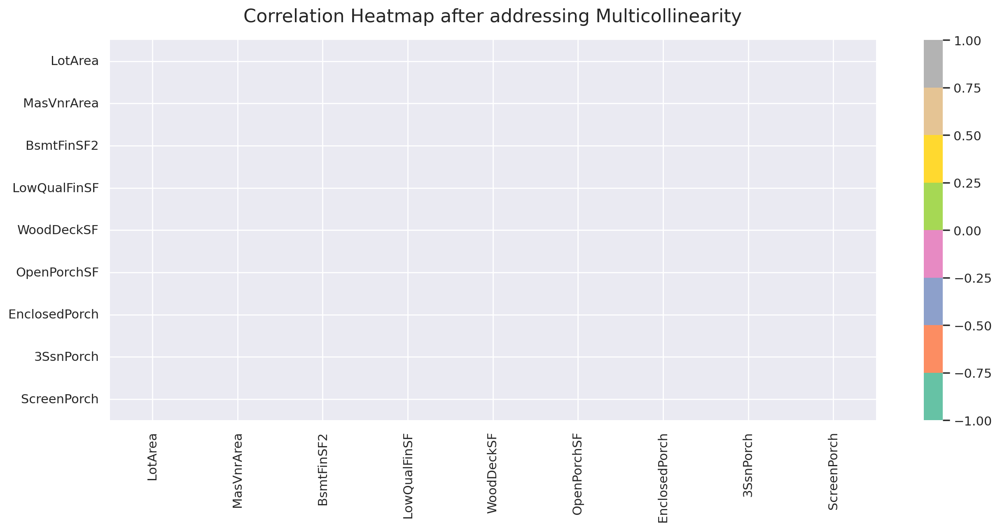

In [39]:
# plot scatter plot to show correlation heat map of continuous predictors
# pair-wise correlation matrix
corr_mat = no_corr_x_train[new_continuous_cols].corr().abs()

# split the matrix diagonally into triangle
# mask removes bottom matrix triangle
mask = np.triu(np.ones_like(corr_mat, dtype=np.bool))

keep_corr = 0.49

# the mask is the part to remove from the matrix with True values
mask = mask | (np.abs(corr_mat) <= keep_corr)
corr_mat = corr_mat[~mask]

plt.figure(figsize=(15,6))

cmap = sns.color_palette("Set2")
#cmap = sns.diverging_palette(230, 20, as_cmap=True)
#cmap=sns.color_palette("rocket")

heatmap = sns.heatmap(corr_mat, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap=cmap)

heatmap.set_title('Correlation Heatmap after addressing Multicollinearity', fontdict={'fontsize': 16}, pad=16);


Let's check the  `Actual vs Fitted ` and the  `Residuals vs Fitted ` plots again after addressing multicollinearity :


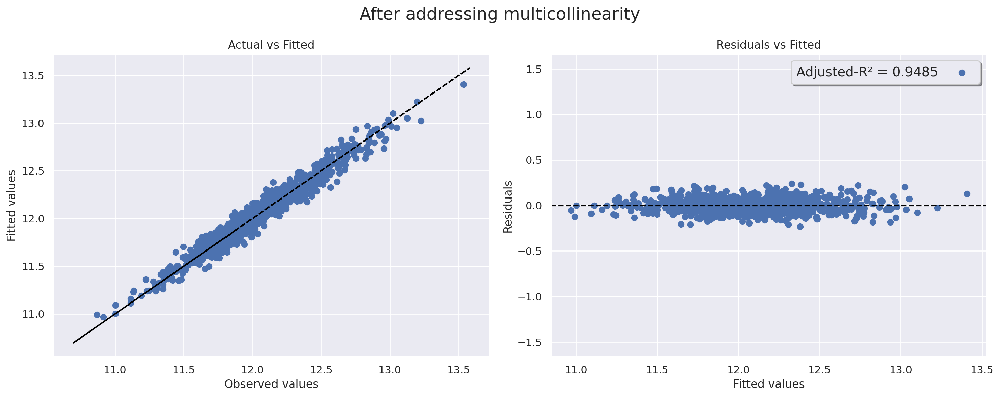

In [40]:
# fit OLS
x = sm.add_constant(no_corr_x_train)
model = sm.OLS(list(y_log_train_clean), x).fit()
y_pred_clean = model.predict(x)
res = abs(y_log_train_clean) - abs(y_pred_clean)

residual_plot = ResidualsPlot(y_log_train_clean, y_pred_clean, model, res, "After addressing multicollinearity")
residual_plot.plot_both()

<br>

> *We can conclude that the assumption of having no multicollinearity is met*.

<br>

## 📈 Residuals diagnostic plots

We use residual analysis to assess and validate assumptions related to the residuals in a regression model, let's revisit what these concepts mean :

-  **Normality of the residuals**: the residuals should follow a normal distribution with a mean of zero. This is important because many statistical tests and confidence intervals assume normality.

- **Homoscedasticity - homogeneity of the variance of the residuals** : this implies that the variance of the residuals σ² is the same across the spectrum of all values of the predictor variables, more precisely the variance should not be a function of the explanatory variables X. Violations of homoscedasticity indicate heteroscedasticity, where the variability of residuals varies systematically with the predictors.


- **No autocorrelation - independence of the residuals**  : Autocorrelation refers to the dependence or correlation between residuals. The residuals should be independent of each other, that is the value of one residual is not influenced by the value of other residuals. If there is a departure of this assumption it indicates that there is crucial information that the model has not captured or has missed.










<br>

**Visually testing for the <font color=red> normality of residuals</font>  assumption using**  :

<br>

- **Q-Q plot** : this plot compares the distribution of a sample to a theoretical normal distribution. If the residuals follow a normal distribution, the points in the Q-Q plot will fall on a straight line and any deviation from a straight line indicates a deviation from normality.


- **Density plot** : this plots the kernel density estimate (KDE) of the distribution of a variable. In this context the density plot shows the estimated frequency distribution of the residuals, if the data is skewed, the density plot will display unequal sides, which indicates that the residuals are do not follow a normal distribution.

<br>

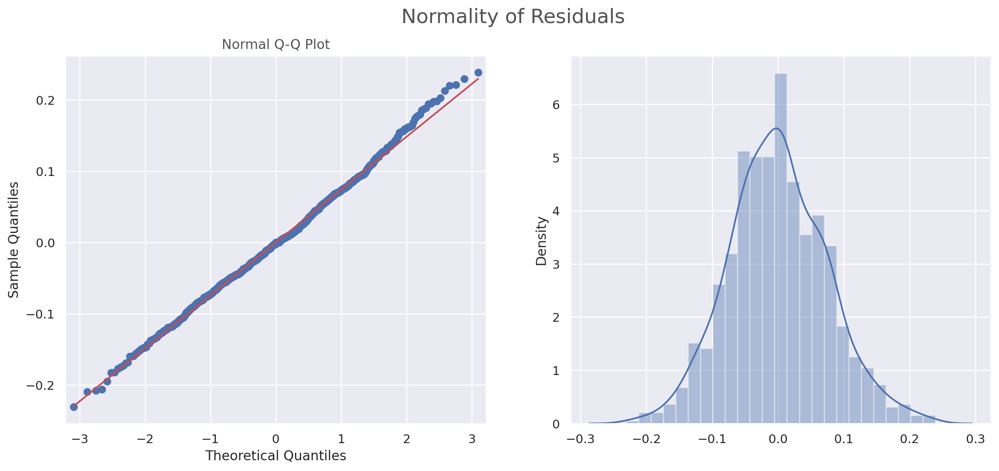

In [41]:
# Fit OLS model
x = sm.add_constant(no_corr_x_train)
model = sm.OLS(list(y_log_train_clean), x).fit()
y_pred = model.predict(x)
res = abs(y_log_train_clean) - abs(y_pred)

# Q-Q plot for the residuals
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,6))
plt.suptitle("Normality of Residuals", size=18, color='#525252')
sm.qqplot(np.array(res), line='s', ax=axes[0])
axes[0].set_title('Normal Q-Q Plot', color='#525252')

# probability plot for the residuals
sns.distplot(np.array(res), ax=axes[1])

plt.show()

> *We performed visual inspection for the normality of the residuals using Q-Q plot and Seaborn Distplot. Both plots show a relatively normal distribution of the residuals. To confirm this visual inspection, we will run a normality statistical test, namely Shapiro-Wilk test.*

<br>

**Inspecting for normality of residuals assumption sing statistical testing** :

<br>

- The null hypothesis of the normality test is that the residuals are normally distributed, while the alternative hypothesis is that they are not.

- The p-value represents the probability of obtaining the observed results of the test statistic, assuming that the null hypothesis is true. A smaller p-value indicates that the observed outcome is highly unlikely to occur by chance if the null hypothesis is true, in other words, it provides stronger evidence against the null hypothesis.


- If the p-value is below the chosen significance level `alpha_threshold`, then the null hypothesis is rejected in favor of the alternative hypothesis, and the conclusion is that the residuals are not normally distributed. Conversly, if the p-value is greater than `alpha_threshold`, then the null hypothesis is not rejected, and the conclusion is that the residuals are normally distributed.

<br>

In [42]:
from scipy.stats import shapiro

alpha_threshold = 0.05

shapiro_output = shapiro(np.array(res))

p_value = shapiro_output[1]

if p_value < alpha_threshold:
    print('According to the Shapiro-Wilk test, the residual terms are not normally distributed')
else:
    print('According to the Shapiro-Wilk test, the residual terms are normally distributed')

According to the Shapiro-Wilk test, the residual terms are normally distributed


<br>

> *We can conclude that the normality of the residuals terms is met.*

<br>

**Visually testing for the <font color=red> hetroscedasticity</font> assumption**. We use the following plots  to check if the residuals suffer from non-constant variance or not :
- **Residuals plot** : plots the residuals vs index plot, it's used to  plot the spread of the residuals and to inspect for a systematic pattern in the spread that could imply the presence of homoscedasticity.

- **Scale-location plot** : it plots the square root of the absolute standardized residuals against the fitted values of the model. The horizontal axis of the plot represents the fitted values of the model, while the vertical axis represents the square root of the absolute standardized residuals. By taking the square root of the absolute standardized residuals, we are transforming them to have a roughly constant variance across the range of fitted values.

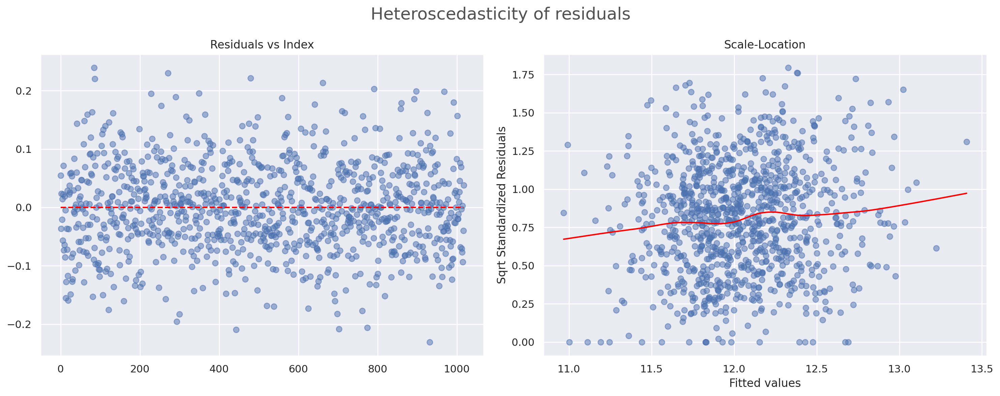

In [43]:
fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(15,6)) #(20,5)

# Plotting the residuals plot

# create an array of x values ranging from 0 to the number of rows in the data
x = np.array(range(no_corr_x_train.shape[0]))
# create a scatter plot of the residuals against the x values, with transparency set to 0.5
ax[0].scatter(x=x, y=res, alpha=0.5)
# plot a dashed line at y=0
ax[0].plot(np.repeat(0, x.max()), color='red', linestyle='--') #darkorange
ax[0].set_title('Residuals vs Index')


# Scale-Location plot
# calculate standardized residuals
std_res = res / np.std(res)
abs_std_res = np.abs(std_res)
sqrt_abs_std_res = np.sqrt(abs_std_res)

# Calculate loess line for standardized residuals
loess_line = lowess(sqrt_abs_std_res, y_pred_clean, frac=0.5)

ax[1].scatter(y_pred_clean, sqrt_abs_std_res, alpha=0.5)
ax[1].plot(loess_line[:,0], loess_line[:,1], color='red')

#plt.axhline(y=0,  color='black', linestyle='--')
ax[1].set_title('Scale-Location')
ax[1].set_xlabel('Fitted values')
ax[1].set_ylabel('Sqrt Standardized Residuals')
fig.suptitle('Heteroscedasticity of residuals', size=18, color='#525252')

plt.tight_layout()
plt.show()

**Interpreting the plots** :
-  A well behaving **Scale-Location plot**: has a red line that is roughly horizontal across the plot and there is no clear pattern in the spread of the residual terms.

<br>

>  **The red line in Scale-Location plot is called the lowess line** is designed to capture the underlying structure of the data by smoothing out the fluctuations in the plot, and it helps to visually identify the direction and strength of the relationship between the two variables. It's called a `location-scale` plot because it shows the location (i.e., the values of the predictor variable) on the x-axis and the scale (i.e., the values of the response variable) on the y-axis.

<br>

- Similarly, the **residuals plot** shows a random pattern of residuals scattered around the horizontal line, further supporting the homoscedasticity assumption.


<br>

**Let's inspect for hetroscedasticity using statistical testing** :

<br>


To confirm this visual inspection, we ran the **Breusch-Pagan test for hetroscedasticity**, and the test concluded that the residual variance does not depend on the variables in x in the form, confirming the homoscedasticity assumption of the residuals.


- The null hypothesis of the Breusch-Pagan test states that the variance of the residuals is constant (homoscedasticity). A low p-value less than  `alpha_threshold` indicates that the null hypothesis can be rejected, meaning that there is evidence of heteroscedasticity. Conversely, a high p-value greater than `alpha_threshold` indicates that the null hypothesis cannot be rejected, meaning that there is no evidence of heteroscedasticity and that the homoscedasticity assumption is met.

<br>


In [44]:
from statsmodels.stats.diagnostic import het_breuschpagan


x = sm.add_constant(no_corr_x_train)

p_value = het_breuschpagan(res, x)[1]

# Reporting the normality of the residuals
if p_value < alpha_threshold:
    print('According to the Breusch-Pagan test, the residual variance does in fact depend on the variables in x in the form, therefore homoscedasticity assumption is not met.')
else:
    print('According to the Breusch-Pagan test, the residual variance does not depend on the variables in x in the form, therefore homoscedasticity is met.')

According to the Breusch-Pagan test, the residual variance does not depend on the variables in x in the form, therefore homoscedasticity is met.


<br>

> *We can conclude that the homoscedasticity assumption is met.*

<br>

**Evaluating the <font color='red'> autocorrelation</font>  assumption of the residuals through statistical testing** :

<br>

- The **Durbin-Watson test** is used to test for autocorrelation in the residuals of a linear regression model. Autocorrelation occurs when the residuals of a model are correlated with one another, meaning that errors in predicting one observation are related to errors in predicting another observation. This violates the assumption of independent errors, which is a key assumption of linear regression.


In [45]:
from statsmodels.stats.stattools import durbin_watson

durbinWatson = durbin_watson(np.array(res))

print(f'Durbin-Watson test result is: {durbinWatson:.3f}' )

if durbinWatson < 1.5:
    print('The residuals show signs of positive autocorrelation.')
    print('This violates the assumption of no autocorrelation of the residuals.')
elif durbinWatson > 2.5:
    print('The residuals show signs of negative autocorrelation.')
    print('This violates the assumption of no autocorrelation of the residuals.')
else:
    print('The residuals show little to no autocorrelation.')
    print('This satisfies the assumption of no autocorrelation of the residuals.')



Durbin-Watson test result is: 1.979
The residuals show little to no autocorrelation.
This satisfies the assumption of no autocorrelation of the residuals.


<br>

> *We can conclude that the assumption of no autocorrelation of the residuals is met.*

<br>

Overall, the linearity and multicollinearity assumptions, as well as the assumptions related to the residuals namely the normality and homoscedasticity and independence of the residuals are met, indicating that the linear regression model is valid for predicting the response variable using the given set of predictor variables.

<br>

## 📊  Feature Selection

**Feature selection** is a crucial step in model building, it consists of identifying the most important and most relevant features to the given problem. This means it keeps variables that influence the model's prediction and removes irrelevant features that don't add any meaningful information or redundant ones that only increase the model's complexity. This step is important due to the following reasons:

- It reduces the **dimensions from the feature space** by eliminating noisy features which effectively reduces overfitting and improves the model's overall performance and its ability to make accurate predictions.

- Additionally, feature selection leads to improving **the model's Interpretability** because having fewer number of features makes understanding the model's decision making clearer.

- Furthermore, it reduces **the computational complexity** which increases the model's run time in terms of training and inference.

<br>


**There are three main approaches to performing feature selection**. Here is the difference between them:


- **Filter methods** : involve running statistical tests that measure the relevance of  features to the target variable. They are faster to run and more computationally efficient because they do not require training a model. However, they ignore the interactions between the features and the model used for training.


- **Embedded methods** : involve identifying important features during the model training process, it uses built-in techniques to indentify important features such as standardized coefficient values from linear regression models or feature importance measure from tree-based models.  In this case the selected features are directly relevant to the model's performance. However, the results are specific to the model used for training and may not generalize well on other models.



- **Wrapper methods** : involve running a model on different subsets of features where at each step, the model is trained on a subset of features from the feature space and evaluated based on a chosen metric, at the end it selects the best subset. The process of selecting the subset of features at each step can vary between different wrapper methods. Wrapper methods are the most computationally expensive method among the other feature selection approaches since they require running the model multiple times while considering different subsets of features as distinct models.
    
<br>

> To run a comprehensive and rigorous way to perform feature selection we will select the best performing sub-method in each approach based on various evaluation metrics such as RMSE, AIC, BIC and Adjusted R² scores. We will compare the results of each approach and select the best subset of features that performs well on all evaluation metrics.

<br>

#### Metrics implementation for model evaluation


**Let's take a closer look at the evalutation metrics we will use for feature selection 🔬**


We will use the above mentioned feature selection methods to generate a set of selected features creating a reduced model. As each reduced model consists of different predictors but the same response variable, they are considered distinct models. We will use the following evaluation metrics to compare these models and perform model selection.


- **RMSE** (Root Mean Square Error) : is a measure of goodness of fit that evaluates how well the model fits the data, specifically it measures the standard deviation of the residuals, also called the standard error of regression. It's important to note that RMSE quantifies how accurate the predictions are in units of the response variable.

- **Information Criterion** metrics are evaluation metrics that assess the model's fit while penalizing for the complexity of the model, that is they add a penalty for the number of predictors used in the model. **Information Criterion metrics are used when the goal is to select a model that achieves a good fit while using the fewest predictors possible to avoid complexity.**

    The two most known metrics are **AIC** (Akaike Information Criterion) and **BIC** (Bayesian Information Criterion), both use Log-Likelihood function as a goodness of fit but use different penalty terms so let's define Log-Likelihood first :


- **Log-Likelihood** : is also a statistic that evaluates the overall fit of a model, where higher the log-likelihood value, the better the model is at fitting the data. However, similar to R², adding a new predictor variable always increases the log-likelihood value even if this variable doesn't improve the model's fit.

<br>

\begin{align}
\text{Log Likelihood} = -\frac{n}{2} \left[ \log\left(\frac{2 \pi}{n}\right) + \log(SSE) + 1 \right]
\end{align}

<br>

- **AIC** :
$$
\begin{align}
\text{AIC} = \underbrace{-2\log\text{likelihood}}_{\substack{\text{Fit of the model}}} + \underbrace{2k}_{\substack{\text{Penalty term for complexity}}}
\end{align}$$


<br>

- **BIC** :
$$\begin{align}
\text{BIC} = \underbrace{-2\log\text{likelihood}}_{\substack{\text{Fit of the model}}} + \underbrace{\text{k}\log n}_{\substack{\text{Penalty term for complexity}}}
\end{align}$$

Where :
- $n$ : Number of observations in the sample.
- $k$ : Number of parameters $p$ in the model including the intercept term, $k=p+1$.
- $SSE$ : Sum of Squares Error.

<br>

> As we can see, BIC adds a larger penalty term than AIC, by using `log(n)` instead of 2. The stronger penalty encourages the selection of simpler models, by doing so it avoids the risk of overfitting.
AIC and BIC favor models with the best fit with the minimum number of predictors to reduce the complexity of the model.

<br>


- **R²** : also called Coefficient of Determination, is a measure goodness of fit statistic that measures the proportion of variation in the response variable that is explained by the set of predictors in the model.

<br>

$$R^2=\frac{\text{SSE}}{\text{SST}}=\frac{\text{SSE}}{\text{SSE}+\text{SSR}}$$

<br>

where :
- $SSE$ : Sum of Squares Error, where $\text{SSE} = \sum_{i=1}^{n} (y_i - \hat{y}_i)^2$.

- $SST$ : Sum of Squares Total, where $\text{SSTotal} = \sum_{i=1}^{n} (y_i - \bar{y})^2$.

<br>



- **Adjusted R²** : However, it's important to note that the $R^²$ value increases as we add new predictors to the model, regardless of whether the additional predictors explain any variation in the response variable. To address this limitation $Adjusted$ $R^²$ is used as an alternative metric, which penalizes $R^²$  for each additional predictor by taking into account both the number of parameters and the sample size.

<br>

$$R^2_{\text{adj}} = 1 - \frac{(1 - R^2)(n - 1)}{n - p - 1}$$

<br>


> Let's implement these metrics in Python  :

<br>


In [46]:
n_jobs = 1
n_folds = 10
kfolds = KFold(n_folds, shuffle=True, random_state=seed)
n = no_corr_x_train.shape[0]

In [47]:
class LRMetrics:
    """ Class used to compute Linear Regression metrics. By default, this class computes LR metrics using cross validation on
        training set, if class method  `from_valid_set ` is invoked then it computes the same metrics using an already fitted model
        by predicting on the validation set and not using cross validation. This way I don't have to repeat most of the code using a class method
        to compute the same metrics but on validation set, model, X, y, n and p will change automatically according to the class method.
        This allows for convenient creation of objects with pre-fitted models.
    """
    def __init__(self,  X, y, model=None, kfolds=None, all_metrics=True, rmse_cv=True, pre_computed_rmse=None):
        """
        Args:
            model (sklearn model) :
            X (array like):
            y (array like):
            all_metrics (bool) : if enabled the class computes the rest of LR metrics other than rmse necessary to calculate aic, bic and adj_r2.
            rmse_cv (bool): if enabled the class computes the metrics on validation set and not using cross validation, this is used when invoking
                                `from_valid_set` class method.
                            Default: True
            pre_computed_rmse (Optional) : If `pre_computed_rmse` value is passed, the RMSE value must be provided as a float. This is used when other metrics are wanted.
        """
        self.model = model
        self.X = X
        self.y = y
        self.kfolds = kfolds
        self.n, self.p = self.X.shape

        if rmse_cv:
            # calculates rmse using cross validation on training set
            self.rmse = self.compute_rmse_cv()

        elif pre_computed_rmse is not None:
            if rmse_cv:
                raise ValueError("If pre_computed_rmse value is passed, rmse_cv must be disabled.")
            self.rmse = pre_computed_rmse

        elif not rmse_cv and LRMetrics._is_model_fitted(self.model, self.X):
            # calculates the rmse on a validation set, this is sepecified by the classmethod
            self.rmse = self.compute_rmse_valid()


        if all_metrics:
            # since we compute rmse first, sse (used in log_likelihood) will be derived from rmse.
            # I invoked these metrics in the intializer so that the end user of the metrics class
            # can access aic, bic and adj_r2 directly.
            self.loglikelihood = self.log_likelihood(rmse=self.rmse)
            self.sst = self.compute_SST()
            self.r2 = self.compute_r2()


    @classmethod
    def from_valid_set(cls, X_valid, y_valid, model, kfolds, all_metrics=True, rmse_cv=False):
        if not LRMetrics._is_model_fitted(model, X_valid):
            raise ValueError("Model must be fitted to perform prediction.")

        return cls(X_valid, y_valid, model, kfolds, all_metrics, rmse_cv=False)


    @staticmethod
    def _is_model_fitted(model, X):
        """ Utility function that is also private that test wether a sklearn model is fitted or not.
        """
        try:
            y_pred = model.predict(X)
            return True
        except NotFittedError as e:
            return False


    def compute_rmse_cv(self, verbose=False):
        rmse_scores = np.sqrt(-cross_val_score(self.model, self.X, self.y, cv=self.kfolds, scoring="neg_mean_squared_error"))
        if verbose:
            print(f'Cross Validation RMSE mean: {rmse_scores.mean():.3f} \nRMSE std: {rmse_scores.std():.3f}')
        return round(rmse_scores.mean(), 3)


    def compute_rmse_valid(self):
        y_pred = self.model.predict(self.X)
        rmse = np.sqrt(mean_squared_error(self.y, y_pred))
        return rmse


    def log_likelihood(self, sse=None, from_rmse=True, rmse=None):
        """ Calculate log likelihood using sse, either provide sse directly or calculate it from rmse.
        """
        if not from_rmse:
            if sse is None:
                raise ValueError("SSE must be provided if `from_rmse` is False.")
        else:
            if rmse is None:
                raise ValueError("RMSE must be provided if `from_rmse` is True.")
            else:
                self.sse = np.square(rmse) * self.n

        loglikelihood = -np.log(self.sse) * self.n / 2 - (1 + np.log((2 * np.pi) / self.n)) * self.n / 2
        return loglikelihood


    def compute_aic(self):
        k = self.p + 1
        aic = -2 * self.loglikelihood + 2 * k
        return aic


    def compute_bic(self):
        k = self.p + 1
        bic = -2 * self.loglikelihood + np.log(self.n) * k
        return bic

    def compute_r2(self):
        """Computes R-squared (coefficient of determination) which is the ratio of the sum of squares error (SSE) to the sum of squares total (SST)."""
        return 1 - self.sse / self.sst


    def compute_adjusted_r2(self, r2):
        """Computes Adjusted R-squared score."""
        Adj_r2 = 1 - (1 - r2) * (self.n - 1) / (self.n - self.p - 1)
        return Adj_r2


    def compute_SST(self):
        """Computes the sum of squares total (SST)."""
        y_mean = np.mean(self.y)
        return np.sum((self.y - y_mean) ** 2)


    # I don't use the following methods in my code because I computed sse from rmse (rmse is computed first by default)
    # and only sse and sst are used to compute log likelighood and in turn the rest of metrics. I only added them for potential future use.
    @staticmethod
    def compute_SSE(y_true, y_pred):
        """Computes the sum of squares error (SSE)."""
        return np.sum((y_true - y_pred) ** 2)

    @staticmethod
    def compute_SSR(y_true, y_pred):
        """Computes the sum of squares regression (SSR)."""
        y_mean = np.mean(y_true)
        return np.sum((y_pred - y_mean) ** 2)

# X, y, model=None, kfolds=None, all_metrics=True, rmse_cv=True, pre_computed_rmse=None)

### Filter methods

**The F-test filter**. We will start with the F-test filter method implemented via sklearn's `f_regression`, which is used to evaluate the linear relationship between each feature and the response variable.

In more detail, the F-test filter perfroms univariate linear regression between each feature individually and the response variable, it then computes the **F-statistic** value to quantify the strength of the linear relationship and also the corresponding p-value to determine the significance of the result.


<br>

**F-statistic formula** :
$$F \text{-ratio} = \frac{{\text{MSR}}}{{\text{MSE}}} = \frac{{\frac{{\text{SSR}}}{{\text{df}_{\text{msr}}}}}}{{\frac{{\text{SSE}}}{{\text{df}_{\text{mse}}}}}}$$

<br>

where,

$df_{msr}$ : degrees of freedom of the numerator, $df_{msr}$= $k$.

$df_{mse}$ : degrees of freeom of the denominator, $df_{mse}$= $n-k-1$.

$k$ : number of parameters in the model including the intercept.

$n$ : number of observations in the sample.

<br>

Finding the p-value becomes straightforward once we have the observed F-statistic value from the given formula and the corresponding degrees of freedom.

<br>

> The `p-value` represents the probability of observing the result of the test statistic assuming that the null hypothesis is true. It indicates the likelihood the test statistic's outcome is purely due to chance.If the p-value is less than significance level `α`, we reject the null hypothesis which states that there is no relationship between the feature and the response variable. It's worth noting that the smaller the p-value, the stronger is the evidence against the null hypothesis. This information is then used by `SelectKBest` to rank features based on their importance.

<br>

The process of computing the test statistic and the corresponding p-values that we described above, as well as ranking the features based on their p-values, is implemented using the `SelectKBest` function.
It's important to note that  `SelectKBest` can be used  with any statistical test, and we will use it again in the next filter method. Furthermore, `SelectKBest` requires specifying the number of features to select `k`, however instead of providing an arbitrary number, let's find the optimal `k` value that results in the minimum rmse score :

<br>

In [48]:
def find_optimal_k(score_function, n, model, X, y, kfolds):
    """Find optimal the number features `k` that that minimizes the rmse score."""
    np.random.seed(seed)
    all_rmse = []
    k_values = range(50, 180, 10)
    for k in k_values:
        # get best features based on scoring function
        selector = SelectKBest(score_func=score_function, k=k)
        selector.fit(X, y)
        top_k_features = list(no_corr_x_train.columns[selector.get_support()])

        # calculate performance for the selected subset of features
        metrics = LRMetrics(X.loc[:, top_k_features], y, model=model, kfolds=kfolds, all_metrics=False)
        cv_rmse = metrics.rmse
        all_rmse.append(cv_rmse)

    # select k with minimum rmse score
    best_rmse, best_k = min(zip(all_rmse, k_values), key=lambda x: x[0])
    return best_rmse, best_k


In [49]:
best_rmse, best_k_f = find_optimal_k(f_regression, n, DecisionTreeRegressor(random_state=seed), no_corr_x_train, y_log_train_clean, kfolds)
print(f'The filter method f_regression yielded the best RMSE score of {best_rmse} when using {best_k_f} number features.')

selector = SelectKBest(score_func=f_regression, k=best_k_f)
selector.fit(no_corr_x_train, y_log_train_clean)
top_k_features_f_test = list(no_corr_x_train.columns[selector.get_support()])

print(f'\nThe {len(top_k_features_f_test)} selected features are:\n{top_k_features_f_test}')

The filter method f_regression yielded the best RMSE score of 0.194 when using 170 number features.

The 170 selected features are:
['LotArea', 'Street', 'Alley', 'LandSlope', 'OverallQual', 'OverallCond', 'YearBuilt', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'LowQualFinSF', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageFinish', 'GarageCars', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolQC', 'Fence', 'MoSold', 'MSSubClass_160', 'MSSubClass_180', 'MSSubClass_190', 'MSSubClass_20', 'MSSubClass_30', 'MSSubClass_45', 'MSSubClass_50', 'MSSubClass_60', 'MSSubClass_85', 'MSSubClass_90', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM', 'LotShape_IR2', 'LotShape_IR3', 'LotShape_Reg', 'LandContour_HLS', 'LandContour_Low', 'LotConfig_CulDSac', 'LotC


<br>

**Mutual Information  (MI) test** is another filter method, which is a statistical test between two random variables $X$ and $Y$ that measures the amount of information that we can obtain about $X$ knowing $Y$. It $X$ and $Y$ are dependent then the $MI$ would be zero, indicating that knowing one variable does not provide any information about the other. Therefore, Mutual Information measures the amount of dependency between the two variables.

<br>

In the context of linear regression, we can use Mutual Information to identify which feature provide most information about the reponse variable. This way we can determine the degree of dependency or information shared between the them. This can help in selecting the most relevant features for the regression analysis.

<br>

Furthermore, a high $MI$ value between a feature and a reponse variable indicates a significant reduction in uncertainty in the reponse variable when the feature is known. That is why uncertainty or entropy is used to compute Mutual Information using the following formula, which represents the reduction in uncertainty or randomness in the feature when the response variable is known, compared to when it is unknown.


<br>

$$MI(\text{feature}; \text{response}) = \text{Entropy}(\text{feature}) - \text{Entropy}(\text{feature}|\text{response})$$

<br>

- $\text{Entropy}(\text{feature})$: the entropy of the feature variable, it measures the amount of uncertainty or randomness in the distribution of that feature.

- $\text{Entropy}(\text{feature}|\text{response})$  : the conditional entropy of the feature given the response variable, it measures the amount of uncertainty or randomness in a response variable given the value of another the response variable.


<br>



In [50]:
best_rmse, best_k_m = find_optimal_k(mutual_info_regression, n, DecisionTreeRegressor(random_state=seed), no_corr_x_train, y_log_train_clean, kfolds)
print(f'The filter method mutual_info_regression yielded the best RMSE score of {best_rmse} when using {best_k_m} number features.')

selector = SelectKBest(score_func=mutual_info_regression, k=best_k_m)
selector.fit(no_corr_x_train, y_log_train_clean)
top_k_features_mutual_info = list(no_corr_x_train.columns[selector.get_support()])

print(f'\nThe {len(top_k_features_mutual_info)} selected features are:\n{top_k_features_mutual_info}')


The filter method mutual_info_regression yielded the best RMSE score of 0.191 when using 50 number features.

The 50 selected features are:
['LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'MasVnrArea', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'HeatingQC', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Fireplaces', 'FireplaceQu', 'GarageFinish', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF', 'Fence', 'MSSubClass_30', 'MSSubClass_60', 'MSZoning_RL', 'MSZoning_RM', 'LotShape_Reg', 'Neighborhood_CollgCr', 'Neighborhood_Gilbert', 'Neighborhood_NAmes', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_Somerst', 'HouseStyle_2Story', 'Exterior1st_VinylSd', 'Exterior2nd_VinylSd', 'Exterior2nd_Wd Sdng', 'MasVnrType_BrkFace', 'MasVnrType_None', 'MasVnrType_Stone', 'ExterQual_Gd', 'ExterQual_TA', 'Foundation_CBlock', 'Foundation_PConc', 'CentralAir_Y', 'Electrical_SBrkr', 'GarageType_Attchd', 'GarageType_Detchd', 'SaleType_New', 'SaleType_WD', 'SaleCondit

We will save the features selected by each filter method for later :

In [51]:
filter_methods_features = {'Mutual Information' : top_k_features_mutual_info,
                            'F Regression' : top_k_features_f_test}

Let's check the overlap between the selected features from both filter methods :

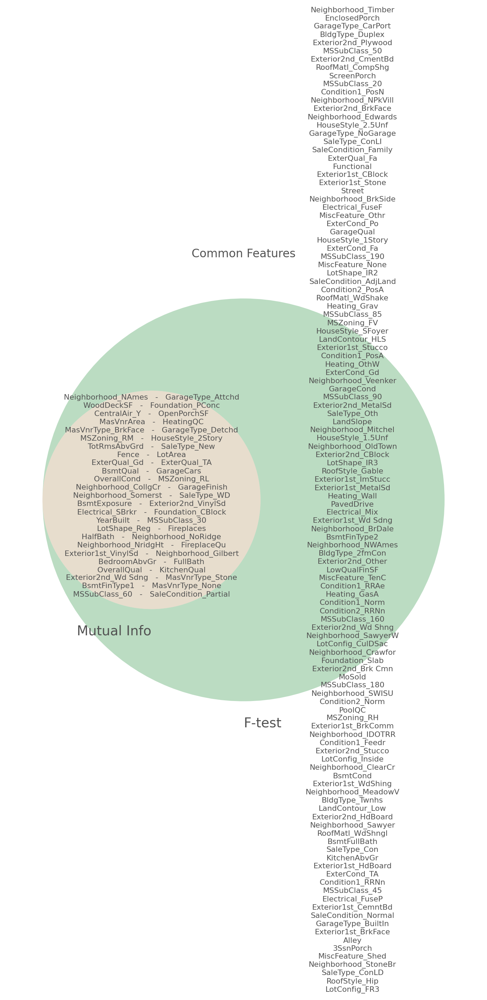

In [52]:
from matplotlib_venn import venn2


mutual_info_only = set(top_k_features_mutual_info) - set(top_k_features_f_test)
f_test_only = set(top_k_features_f_test) - set(top_k_features_mutual_info)

common_features = set(top_k_features_mutual_info) & set(top_k_features_f_test)

plt.figure(figsize =(30, 9))
diagram = venn2([set(top_k_features_mutual_info), set(top_k_features_f_test)], ('Mutual Info', 'F-test'))

# for a better visualization of common_features, every two elements of the list
# are separated with a hyphen and a new line between them, and separates each pair with a comma.
joined_features = ''
for i, feature in enumerate(common_features):
    if i % 2 == 0:
        joined_features += feature
    else:
        joined_features += f'   -   {feature}\n'


joined_features = ''
for i, feature in enumerate(common_features):
    if i % 2 == 0:
        joined_features += feature
    else:
        joined_features += f'   -   {feature}\n'


test_features = ''
for i, feature in enumerate(f_test_only):
    if i % 2 == 0:
        test_features += feature
    else:
        test_features += f'   -   {feature}\n'


# Set text content of areas
diagram.get_label_by_id("10").set_text("\n".join(mutual_info_only))
diagram.get_label_by_id("11").set_text(joined_features)
diagram.get_label_by_id("01").set_text("\n".join(f_test_only )) #

label = diagram.get_label_by_id("11")
label.set_size(30)

# Modify font sizes
for text in diagram.set_labels:
    text.set_fontsize(14)
    text.set_color('#525252')
for text in diagram.subset_labels:
    text.set_fontsize(8)
    text.set_color('#525252')

# Common Features Selected by Feature Selection Methods
plt.title('Common Features', color='#525252')
plt.show()

In [53]:
print(f'It appears that there are {len(common_features)} features that both F-test and Mutual Information consider to be important.')

It appears that there are 50 features that both F-test and Mutual Information consider to be important.



<br>

It seems that there is a considerable overlap between the features selected by the F-test and mutual information filter methods, with 50 features being considered important by both statistical tests. This suggests that these features have a strong linear relationship with the target variable as well as a high mutual information score.


<br>

### Embedded methods

<br>


**Shrinkage methods provide an effective approach to feature selection**, they are methods that use regularization such as Lasso (L1-norm) and Ridge (L2-norm) to avoid overfitting and improve the generalization performance of the model.

Furthermore, shrinkage or regularization algorithms achieve this by modifying the loss function to not only depend on the SSE but also on the magnitude of the regression coefficients. Consequently, they search for coefficients that minimize the penalized sum of squares, this way they balance between fitting the data and preventing overfitting.

This added penalty term varies across shrinkage algorithms. For instance, Lasso regression adds the absolute values of coefficients:



<br>


$$\text{Lasso Loss} = \underbrace{\sum_{i=1}^{n} (y_i - \hat{y}_i)^2}_{\text{SSE}} + \underbrace{\lambda \sum_{i=1}^{n} |w_i|}_{\text{Lasso penalty}}$$

<br>

On the other hand, Ridge regression adds the sum of the squares of the coefficients :


$$\text{Ridge Loss} = \underbrace{\sum_{i=1}^{n} (y_i - \hat{y}_i)^2}_{\text{SSE}} + \underbrace{\lambda \sum_{i=1}^{n} w_i^2}_{\text{Ridge penalty}}$$

where,
- $λ$ : controls the amount of shrinkage. It ranges from 0 to $∞$, if  λ = 0 then all features are considered, that is no coefficient has been shrinked, and the model becomes equivalent to ordinary least squares. If λ = $∞$ then all features will been shrinked to zero.

<br>

**Lasso is considered a sparse solution** since it forces most of the coefficients of the model to be zero, by favoring only the most relevant features and discards the irrelevant or redundant ones. This property makes it a perfect method to perform explicit feature selection.

**Ridge shrinks the coefficients towards zero but does not result in exactly zero-valued coefficients**. However, Ridge regression can still be used for feature selection by identifying the features with the largest absolute coefficient values as the most important and the features with the smallest absolute values as the least important.

<br>

First, **let's define the geometric landscape of regularized loss functions**:
- Geometrically, the SSE loss function is repersented by a contour plot.

- The constraint term in Lasso regression is geometrically represented by a diamond, because the constraint term is the sum of absolute values of the coefficients.

- Similarly, the constraint term in Ridge regression is represented by a circle, because the constraint term is the sum of the squares of the coefficients.

<br>

Let's illustrate this to make the concept clearer  :

<br>


<center>
<img src="https://i.ibb.co/KjzJ14c/Lasso-and-Ridge-5.png" width="800" />
</center>


<center>
<p><em><font color="#666" size="3px"> Geometric representation of Lasso and Ridge regression. (Created by Manal El Aidouni)</font></em></p>
</center>


<br>

Considering the distinctive geometric shapes of the constraints, the goal is to find the point that lie at the intersection of the SSE contour plot and the circle or diamond-shaped constraint region. This particular point representes the optimal coefficients that balances the minimization of the penalized SSE that we discussed earlier.

<br>

> Now that we have a clear visual of the geometric interpretation of Lasso and Ridge regression, we have yet to cover why Lasso produce sparse coefficients and Ridge regression does not. In essence, **the key reason lies in the difference in the shape of the constraints**.

> Lasso's diamond-shaped constraint has corners while Ridge circle don't. These corners when they lie on the coordinate axes, the corresponding coefficient values become precisely zero. Conversely the cirlce-shaped Ridge constraint doesn't have corners, as a result the coefficients do not lie on the coordinate axes but rather close to them, this way some of Ridge coefficients will be shrinked to zero but not be be excatly equal to zero.

<br>



**Let's implement Lasso with with L1-based feature selection** :


In scikit-learn, the Lasso parameter `lambda` is reffered to as `alpha`.

As discussed previously, the regularization parameter `alpha` controls the amount of shrinkage applied to the coefficients, where the higher the `alpha` value, the more coefficients would shrink to zero. Consequently, in the context of feature selection, a smaller number of features will be selected.

First, let's determine the optimal `alpha` value that results in the minimum rmse score, to obtain the best possible set of features :

In [54]:
# scale data before fitting Lasso to get standardized coefficient
scaler = StandardScaler()
scaled_x_train = scaler.fit_transform(no_corr_x_train)

alphas = np.logspace(-4, 0, 50)
lasso_model = Lasso(random_state=seed)
results = []
for alpha in alphas:
    lasso_model.alpha = alpha
    metrics = LRMetrics(scaled_x_train, y_log_train_clean, model=lasso_model, kfolds=kfolds, all_metrics=False)
    results.append((alpha, metrics.rmse))

best_alpha, min_rmse_mean = min(results, key=lambda x: x[1])
print(f"Best alpha: {best_alpha:.4f}, RMSE mean: {min_rmse_mean:.3f}")


Best alpha: 0.0017, RMSE mean: 0.111



Now, let's identify the most important features according to Lasso. The features with a coefficient value of zero are considered the most important :

In [55]:
scaler = StandardScaler()
scaled_x_train = scaler.fit_transform(no_corr_x_train)

lasso = Lasso(alpha=best_alpha, random_state=seed)
lasso.fit(scaled_x_train, y_log_train_clean)
lasso_selected_indices = [i for i in range(len(lasso.coef_)) if  lasso.coef_[i] != 0]

lasso_selected_features =  no_corr_x_train.columns[lasso_selected_indices]
print(f'{len(lasso_selected_features)} features that Lasso considers important are :\n{list(lasso_selected_features)}')

124 features that Lasso considers important are :
['LotArea', 'Street', 'Alley', 'OverallQual', 'OverallCond', 'YearBuilt', 'MasVnrArea', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'BsmtFinSF2', 'HeatingQC', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageFinish', 'GarageCars', 'GarageCond', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolQC', 'Fence', 'MSSubClass_160', 'MSSubClass_190', 'MSSubClass_20', 'MSSubClass_30', 'MSSubClass_40', 'MSSubClass_45', 'MSSubClass_50', 'MSSubClass_60', 'MSSubClass_70', 'MSZoning_RH', 'MSZoning_RL', 'LotShape_IR2', 'LotShape_IR3', 'LandContour_HLS', 'LandContour_Low', 'LandContour_Lvl', 'Utilities_NoSeWa', 'LotConfig_CulDSac', 'LotConfig_FR2', 'LotConfig_FR3', 'Neighborhood_BrDale', 'Neighborhood_BrkSide', 'Neighborhood_ClearCr', 'Neighborhood_Crawfor', 'Neighborhood_Edwards', 'Neighborhood_Gilbert', 'Neighborhood_MeadowV', 'N


<br>

Let's perform feature selection according to Ridge. Since Ridge is not a sparse solution but shrinks the coefficients towards zero, we will identify the features with the largest absolute coefficient values as the most important ones and discard the features with the smallest absolute values.

<br>


We can easily implement this using sklearn's `SelectFromModel` class. It uses either the `coef_` or `feature_importances_` attribute of the passed estimator, which will discuss later. To select top features based on `coef_` it uses a threshold, where if the coefficient of a feature is greater than the threshold, it is considered important and selected. If the coefficient is below the threshold, the feature is considered unimportant and discarded, we will use the default one.

<br>

In [56]:
# find optimal alpha value for Ridge that minimizes rmse score
ridge = Ridge()
results = []
for alpha in alphas:
    ridge.alpha = alpha
    metrics = LRMetrics(scaled_x_train, y_log_train_clean, model=ridge, kfolds=kfolds, all_metrics=False)
    results.append((alpha, metrics.rmse))

best_alpha_ridge, min_rmse_mean = min(results, key=lambda x: x[1])

print(f"Best alpha: {best_alpha_ridge:.4f}, RMSE mean: {min_rmse_mean:.3f}")

Best alpha: 0.6866, RMSE mean: 0.136


In [57]:
# selected features according to Ridge regularization
ridge = Ridge(alpha=best_alpha_ridge, random_state=seed)
ridge.fit(scaled_x_train, y_log_train_clean)
ridge_selector = SelectFromModel(ridge, prefit=True)
ridge_selected_features = no_corr_x_train.columns[ridge_selector.get_support()]
print(f'{len(ridge_selected_features)} features that Lasso considers important are :\n{list(ridge_selected_features)}')

66 features that Lasso considers important are :
['LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'MasVnrArea', 'BsmtExposure', 'BsmtFullBath', 'FullBath', 'HalfBath', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'OpenPorchSF', 'PoolQC', 'MSSubClass_160', 'MSSubClass_30', 'MSSubClass_45', 'MSSubClass_60', 'MSSubClass_80', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM', 'Neighborhood_Crawfor', 'Neighborhood_Edwards', 'Neighborhood_Gilbert', 'Neighborhood_MeadowV', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_StoneBr', 'Condition1_Norm', 'BldgType_Twnhs', 'BldgType_TwnhsE', 'HouseStyle_1.5Unf', 'RoofStyle_Gable', 'RoofStyle_Hip', 'RoofMatl_CompShg', 'RoofMatl_Membran', 'RoofMatl_Roll', 'RoofMatl_Tar&Grv', 'RoofMatl_WdShake', 'RoofMatl_WdShngl', 'Exterior1st_BrkFace', 'Exterior1st_HdBoard', 'Exterior1st_MetalSd', 'Exterior1st_Plywood', 'Exterior1st_Stone', 'Exterior1st_Stucco', 'Exterior1st_VinylSd', 'Exterior1st_Wd Sdng', 'MasVnrType_BrkF

<br>

**Coefficients and feature importance** :

<br>

- **Linear Regression coefficients can provide information about feature importance**, where higher ceofficient absolute values indicate greater importance of their corresponding features. It's worth noting that coefficients can be negative where the sign indicate the direction of relationship between the feature and response variable.

<br>

> It is important to be note that using LR coefficient values as a measure of feature importance **assume that the input variables have the same scale or have been scaled prior to fitting a model**, because the magnitude of the coefficients are scale-variant, i.e, they depend on the scale of the input data.Therefore, applying data standaridization before fitting the model is necessary for a proper interpretation of feature importance.

<br>

- **Tree-based algorithms can also be used for feature selection**. They implicitly perform feature selection through their internal decision making process, these algorithms use criterions like Gini impurity or entropy that help identify features for splitting that results in the largest reduction in impurity. This means that the most important features are prioritized at the top of the tree, which provides valuable information for feature selection.




<br>


**Feature importance based on Embedded methods** :

We will examine the features identified as most important by each embedded method and make it easier to compare by visualizing the top 10 features  :

In [58]:
# with scaling input data to get standardized coefficients to be used for feature importance
feature_importances = {}
algorithms = {
    'Lasso' : Lasso(alpha=best_alpha, random_state=seed),
    'Ridge' : Ridge(alpha=best_alpha_ridge, random_state=seed),
     #'LinearRegression': LinearRegression(),
    'Decision Tree': DecisionTreeRegressor(random_state=seed),
    'Random Forest': RandomForestRegressor(random_state=seed),
    'Gradient Boosting': GradientBoostingRegressor(random_state=seed),
    'XGBoost': XGBRegressor(random_state=seed)}

embedded_methods_features = {}

for algorithm_name, algorithm in algorithms.items():
    selector = SelectFromModel(algorithm)
    if hasattr(algorithm , 'fit_intercept'):
        # for Lasso and Ridge scale input data to get feature importance via coef_
        scaler = StandardScaler()
        scaled_x_train = scaler.fit_transform(no_corr_x_train)
        selector.fit(scaled_x_train, y_log_train_clean)
        # get features based on coef_
        feature_importances[algorithm_name] = dict(zip(no_corr_x_train.columns, (selector.estimator_.coef_)))
        embedded_methods_features[algorithm_name] = list(no_corr_x_train.columns[selector.get_support()])

    elif hasattr(algorithm, 'max_depth'):
        # DecisionTreeRegressor, RandomForestRegressor, GradientBoostingRegressor
        selector.fit(no_corr_x_train, y_log_train_clean)
        # get features based on feature_importances_
        feature_importances[algorithm_name] = dict(zip(no_corr_x_train.columns, (selector.estimator_.feature_importances_)))
        embedded_methods_features[algorithm_name] = list(no_corr_x_train.columns[selector.get_support()])


# Compute the intersection of the selected features for all algorithms
all_features = [item for sublist in embedded_methods_features.values() for item in sublist] # flatten the lists in  selected_features.values()
final_selected_features  = set(all_features + top_k_features_mutual_info + top_k_features_f_test)
print(f'{len(final_selected_features)} final selected features: {final_selected_features}')


192 final selected features: {'Neighborhood_Timber', 'EnclosedPorch', 'GarageType_CarPort', 'BldgType_Duplex', 'Exterior2nd_Plywood', 'MSSubClass_50', 'Exterior2nd_CmentBd', 'MSZoning_RM', 'ScreenPorch', 'RoofMatl_CompShg', 'MSSubClass_20', 'Condition1_PosN', 'TotRmsAbvGrd', 'Neighborhood_NPkVill', 'BldgType_TwnhsE', 'Exterior2nd_BrkFace', 'Neighborhood_Edwards', 'HouseStyle_2.5Unf', 'GarageType_NoGarage', 'SaleType_ConLI', 'SaleCondition_Family', 'ExterQual_Fa', 'Functional', 'Exterior1st_CBlock', 'OverallCond', 'MSZoning_RL', 'Exterior1st_Stone', 'Street', 'Neighborhood_BrkSide', 'Electrical_FuseF', 'Exterior2nd_VinylSd', 'MiscFeature_Othr', 'ExterCond_Po', 'GarageQual', 'HouseStyle_1Story', 'ExterCond_Fa', 'MSSubClass_190', 'MiscFeature_None', 'LotShape_IR2', 'RoofMatl_Roll', 'Neighborhood_NridgHt', 'FireplaceQu', 'Exterior2nd_Stone', 'RoofMatl_Tar&Grv', 'SaleCondition_AdjLand', 'Condition2_PosA', 'RoofMatl_WdShake', 'BedroomAbvGr', 'Heating_Grav', 'MSSubClass_85', 'FullBath', 'Neig

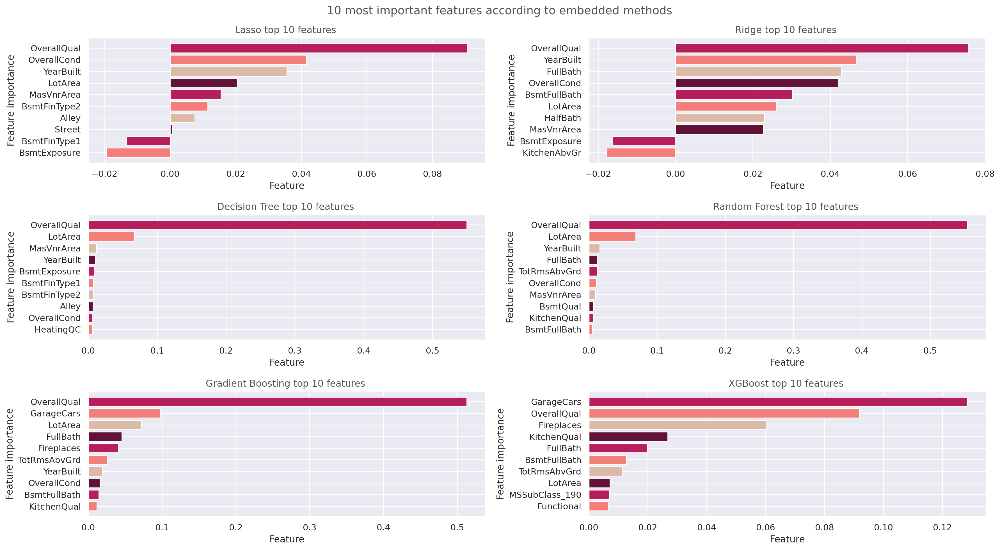

In [59]:
def plot_importances():
    """ Displays top 10 most important features according to each embedded method.
    Get selected_features using Selector but compute their feature importance in feature_importances dictionary to plot a bar plot next
    """

    fig, ax = plt.subplots(3, 2, figsize=(18, 10))
    ax = ax.flatten()

    for idx, algorithm_name in enumerate(feature_importances.keys(), 0):
        importance_dict = {feature : feature_importances[algorithm_name][feature] for feature in embedded_methods_features[algorithm_name]}
        top_10_features = dict(itertools.islice(importance_dict.items(), 10))
        top_10_features = sorted(top_10_features.items(), key=lambda x :x[1])
        features, importance_values = list(zip(*top_10_features))
        ax[idx].barh(features, importance_values,  align = 'center',  color=['#f47e7a', '#b71f5c', '#621237', '#dbbaa7'])
        ax[idx].set_title(f'{algorithm_name} top 10 features ', color='#525252')
        ax[idx].set_ylabel('Feature importance')
        ax[idx].set_xlabel('Feature')

    plt.suptitle('10 most important features according to embedded methods',  color='#525252')
    plt.tight_layout()
    plt.show()

plot_importances()

💡 **Insights** :

- Ridge and Lasso bars are plotted to the left of zero, indicating negative coefficients because they use `coef_`, meanwhile tree-based algorithms contain all positive values because they use `feature_importances_`.

- There is a concesus over `OverallQual` being the most important feature by all algorithms except for Xgboost that ranks it within the top 3 features.

- All in all, there is a considerable overlap among all algorithms in their selection of important features. Furthermore, decision tree-based algorithms consistently identify `OverallQual` and `LotArea` as their top 2 features, except for Xgboost.





**Let's now compare the performance of each best subset features according to filter and embedded methods based on AIC and BIC and other LR metrics** :

To identify the most effective subset of features, we will train the same model using the pre-computed subsets of features from each feature selection method. By comparing their performance we determine the subset that yields the highest performance.

<br>

Every selected subset of features by the above feature selection method will be considered a distinct model, we then will use AIC and BIC metrics to compare them and select the best performing one.

<br>

In [60]:
def performance_on_LR_metrics(model, methods, x_train, y_train, valid_set=False, x_valid=None, y_valid=None, plot=True, figsize=(20, 5)):
    """ Calculates LR metrics on each subset of features selected by each feature selection method.
    Each subset of feature selected by each Feature selection method, is then used to be fitted on the same model.

    Args:
        model (object): The linear regression model.
        methods (dict): A dictionary that maps each feature selection method to its selected features from previous steps.
        x_train (array-like): The training data features.
        y_train (array-like): The training data target variable.
        valid_set (bool): Flag indicating whether a validation set is used.
        x_valid (array-like): The validation data features.
        y_valid (array-like): The validation data target variable.
        plot (bool): Flag indicating whether to plot the performance metrics.
    """

    if valid_set:
        if x_valid is None or y_valid is None:
            raise ValueError('If `valid_set` is enabled, then `x_valid` and `y_valid` parameters must be provided.')

    all_rmse = []
    all_aic = []
    all_bic = []
    all_adj_r2 = []
    n = x_train.shape[0]
    p = x_train.shape[1]



    for method in methods :
        selected_features = methods[method]

        # specify on what data to compute metrics on
        if not valid_set:
            pass
            # get performance on training set
            metrics = LRMetrics(x_train.loc[:, selected_features], y_train, model=model, kfolds=kfolds, all_metrics=True, rmse_cv=True)
        elif valid_set:
            if x_valid is None or y_valid is None:
                raise ValueError('If valid_set is enabled, x_valid and y_valid must be provided.')
            # fit the model on training set and compute metrics on validation set
            model.fit(x_train.loc[:, selected_features], y_train)
            metrics = LRMetrics.from_valid_set(x_valid.loc[:, selected_features], y_valid, model=model, kfolds=kfolds, all_metrics=True, rmse_cv=False)


        # calculate RMSE, BIC, and AIC based on LR model
        rmse = metrics.rmse
        aic = metrics.compute_aic()
        bic = metrics.compute_bic()
        adj_r2 = metrics.compute_adjusted_r2(metrics.r2)

        all_rmse.append(rmse)
        all_bic.append(bic)
        all_aic.append(aic)
        all_adj_r2.append(adj_r2)


    if plot:
        #colors = sns.color_palette('RdBu')

        colors = ['#ee8469', '#a3cac3', '#D4C6BD' , '#ebb39d']
        fontdict= {'family': 'serif', 'color':'#646464'}

        fig, axs = plt.subplots(nrows=2, ncols=2, figsize=figsize)
        if not valid_set:
            plt.suptitle('Performance of selected features across different methods using Cross validation', fontsize=16, color='#646464')
        else:
            plt.suptitle('Performance of selected features across different methods on hold out set', fontsize=16, color='#646464')


        axs = axs.flatten()

        # plot AIC scores
        zipped = sorted(zip(methods, all_aic),key = lambda x: x[1], reverse=True)
        aic_methods, aic_scores = zip(*zipped)
        axs[0].barh(aic_methods, aic_scores, align='center', color=colors[0])
        axs[0].set_xlabel('AIC Score',  fontdict=fontdict)

        # plot BIC scores
        zipped = sorted(zip(methods, all_bic),key = lambda x: x[1], reverse=True)
        bic_methods, bic_scores = zip(*zipped)
        axs[1].barh(bic_methods, bic_scores, align='center', color=colors[1])
        axs[1].set_xlabel('BIC Score',  fontdict=fontdict)

        # plot RMSE scores
        zipped = sorted(zip(methods, all_rmse),key = lambda x: x[1], reverse=True)
        rmse_methods, rmse_scores = zip(*zipped)
        axs[2].barh(rmse_methods, rmse_scores, align='center', color=colors[2]) # 4
        axs[2].set_xlabel('RMSE Score',  fontdict=fontdict)

        # plot Adjusted-R² scores
        zipped = sorted(zip(methods, all_adj_r2),key = lambda x: x[1], reverse=False)
        adj_r2_methods, adj_r2_scores = zip(*zipped)
        axs[3].barh(adj_r2_methods, adj_r2_scores, align='center', color=colors[3]) # 5
        axs[3].set_xlabel('Adjusted-R² Score',  fontdict=fontdict)

        for ax in axs:
            ax.xaxis.set_ticklabels(ax.get_xticklabels(), color='#595859')
            ax.yaxis.set_ticklabels(ax.get_yticklabels(), color='#595859')

        plt.tight_layout()
        plt.show()


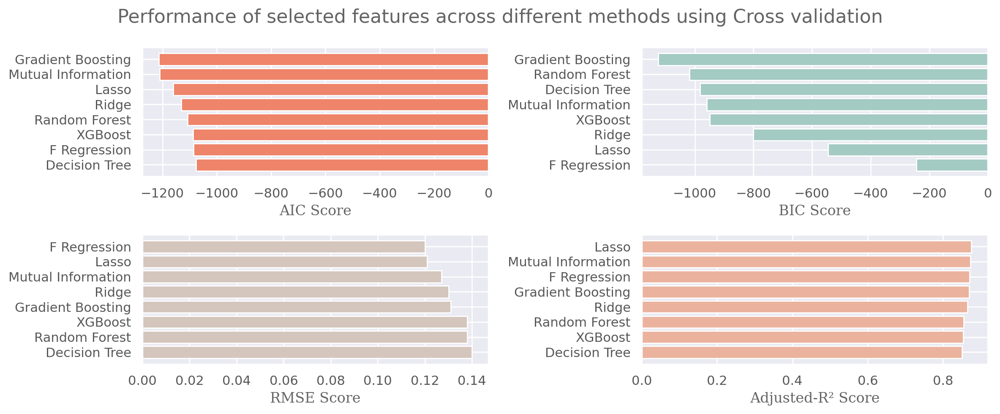

In [61]:
# call the function on embedded and filter methods
# methods = list(embedded_methods_features) + list(filter_methods_features)

all_methods = embedded_methods_features.copy()
all_methods.update(filter_methods_features)

performance_on_LR_metrics(LinearRegression(), all_methods, no_corr_x_train, y_log_train_clean, figsize=(12, 5))



To interpret the performance of each subset accurately on LR metrics we need to look at the complexity of each model :

In [62]:
all_methods = embedded_methods_features.copy()
all_methods.update(filter_methods_features)
all_methods = dict(sorted(all_methods.items(), key=lambda x: len(x[1]), reverse=True))

for method, features in all_methods.items():
    print(method, ':', len(features))

F Regression : 170
Lasso : 124
Ridge : 66
Mutual Information : 50
XGBoost : 27
Decision Tree : 18
Random Forest : 17
Gradient Boosting : 17


**Interpretation** :

- As a reminder, the model with the lowest AIC and BIC scores provide the best fit, in cases where these scores are negative, a higher negative value for AIC or BIC indicate better performance. Additionally, a lower RMSE score indicate a better fit, while a higher adjusted-R² suggest a stronger fit.


- The subset of features selected by Gradient Boosting has the best performance across AIC and BIC metrics, this is because Information Criteria metrics prioritizes models with smaller complexity and Gradient Boosting has the smallest number of features.

- Meanwhile the susbet of features selected by Lasso and F-Regression perform better on  Adjusted R² score and RMSE score respectively because they prioritize larger number of features.

<br>


### Wrapper methods

Wrapper methods, as mentioned earlier, involve selecting different subsets of features using external metrics, in contrast to  built-in tools that embedded methods use or filter methods that rely on statistical measures.

<br>

> Once again, it's important to note that each unique subset is considered as a separate model. Knowing that there are $2^{k+1}$ possible models to consider, wrapper methods help us navigate the vast pool of possible models to evaluate. One of the best wrapper method is Recursive Feature Elimination (RFE), known for its effectiveness in feature selection.

<br>


**Recursive Feature Elimination (RFE)** :

RFE is a systematic and iterative approach to feature selection, it involves training and evaluating a model multiple times on progressively smaller subsets of features, until it identifies the optimal subset. Here is the breakdown of how it works :

1. Start with a Full model, including all features.

2. Identify and remove the predetermined number of features with the largest p-values, since they are considered the least important based on their significance.

4. Refit the model on the reduced set of features. This is referred to as the reduced model.

5. Repeat the process until the desired number of features is reached.


RFE is considered the best because of it's easy implementation and it's ability to deliver efficient result. However, one **problem with RFE** is that requires a pre-specified number of features to select but the ideal number is often not known in advance. Therefore, to find the optimal number of features **Recursive Feature Elimination with Cross-Validation** (RFECV) is used which implements cross-validation technique to determine the optimal number of features.


<br>





In [ ]:
# for each algorithm apply the RFECV wrapper method to find the best n number of features according to this wrapper method
algorithms = {
    'Lasso' : Lasso(alpha=best_alpha, random_state=seed),
    'Ridge' : Ridge(alpha=best_alpha_ridge, random_state=seed),
    # dropping LR model because it generates cv scores that oscillates a lot and ruins the scale of the plot.
    #'LinearRegression': LinearRegression(),
    'DecisionTreeRegressor': DecisionTreeRegressor(random_state=seed),
    'RandomForestRegressor': RandomForestRegressor(random_state=seed),
    'GradientBoostingRegressor': GradientBoostingRegressor(random_state=seed),
    'XGBoostRegressor':  XGBRegressor(random_state=seed)
    }


optimal_n_features = []
cv_results = []
selected_features = []

for algorithm_name, algorithm in algorithms.items():
    if hasattr(algorithm , 'fit_intercept'):
        # for Lasso, Ridge, LinearRegression
        # scale input data to get feature importance via coef_
        scaler = StandardScaler()
        scaled_x_train = scaler.fit_transform(no_corr_x_train)
        rfecv = RFECV(estimator=algorithm, step=1, cv=5,scoring='neg_mean_squared_error')
        rfecv = rfecv.fit(scaled_x_train, y_log_train_clean)

    elif hasattr(algorithm, 'criterion'):
        # DecisionTreeRegressor, RandomForestRegressor, GradientBoostingRegressor
        rfecv = RFECV(estimator=algorithm, step=1, cv=5, scoring='neg_mean_squared_error')
        rfecv = rfecv.fit(no_corr_x_train, y_log_train_clean)

    optimal_n_features.append(rfecv.n_features_)
    cv_results.append(np.negative(rfecv.cv_results_['mean_test_score']))
    selected_features.append(rfecv.support_)


In [64]:
optimal_n_features = [93, 67, 69, 35, 55, 55]

selected_features = [np.array([ True, False,  True, False,  True,  True,  True,  True, False,
        False,  True,  True,  True,  True, False, False,  True, False,
         True,  True, False,  True, False,  True,  True,  True, False,
        False,  True, False, False, False,  True,  True,  True,  True,
         True,  True, False, False, False, False,  True, False,  True,
         True,  True,  True,  True, False,  True,  True, False, False,
        False, False, False,  True,  True, False,  True, False, False,
         True,  True,  True,  True,  True, False, False, False, False,
         True,  True,  True, False,  True,  True,  True, False,  True,
        False,  True,  True, False,  True,  True,  True, False, False,
        False,  True,  True, False, False, False,  True,  True,  True,
        False, False, False, False, False, False,  True, False, False,
        False, False, False, False,  True,  True, False, False, False,
        False, False,  True, False,  True, False, False,  True, False,
         True,  True, False,  True,  True,  True,  True, False,  True,
         True, False, False,  True, False, False, False,  True, False,
        False, False, False, False, False, False, False,  True, False,
        False, False, False, False,  True,  True, False, False,  True,
        False, False, False, False, False,  True,  True, False, False,
         True, False,  True, False, False,  True, False,  True, False,
        False, False,  True, False, False, False, False, False, False,
        False,  True,  True, False, False,  True, False, False, False,
         True, False, False, False,  True,  True, False, False,  True,
        False,  True,  True]),
 np.array([ True, False, False, False,  True,  True,  True,  True, False,
        False,  True,  True,  True,  True, False, False,  True, False,
         True,  True, False,  True, False,  True, False,  True, False,
        False,  True, False, False, False,  True,  True,  True, False,
         True,  True, False, False, False, False,  True, False, False,
        False,  True,  True, False, False,  True, False, False,  True,
        False, False,  True,  True,  True,  True, False, False, False,
        False, False, False,  True,  True, False, False, False, False,
        False,  True, False, False,  True, False, False, False, False,
        False, False, False, False,  True,  True, False, False, False,
        False,  True,  True, False, False, False,  True, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False,  True,  True, False, False, False,
        False, False,  True,  True,  True, False,  True, False, False,
         True,  True, False,  True,  True,  True,  True, False,  True,
         True, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
         True,  True,  True, False,  True,  True, False, False, False,
         True, False,  True, False, False, False, False, False, False,
        False, False,  True, False, False, False, False, False, False,
        False, False, False, False, False,  True, False,  True, False,
        False, False, False, False,  True, False, False, False, False,
        False,  True,  True]),
 np.array([ True, False,  True,  True,  True,  True,  True,  True,  True,
        False,  True,  True,  True, False,  True,  True,  True, False,
         True,  True,  True, False,  True,  True, False,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True, False,
         True, False,  True,  True,  True, False, False, False, False,
         True,  True, False, False, False, False, False, False, False,
        False, False, False, False,  True, False, False, False,  True,
        False, False, False, False, False, False, False,  True, False,
        False, False, False,  True, False, False,  True, False, False,
        False,  True, False, False,  True,  True, False, False, False,
         True, False, False, False, False, False,  True, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False,  True, False,
        False,  True, False, False,  True, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
         True, False, False, False, False, False, False, False, False,
        False, False,  True, False,  True, False, False, False,  True,
        False,  True, False, False, False, False,  True,  True, False,
         True,  True,  True, False,  True,  True,  True, False, False,
         True,  True,  True, False, False, False, False, False, False,
        False, False, False, False, False, False, False,  True, False,
         True, False,  True,  True, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False]),
 np.array([ True, False,  True, False,  True,  True,  True,  True,  True,
        False,  True,  True,  True, False,  True, False,  True, False,
         True,  True,  True, False,  True,  True, False,  True, False,
         True,  True, False, False, False,  True,  True,  True, False,
         True, False, False,  True,  True, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False,  True,  True, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False,  True, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
         True, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False,  True, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False,  True, False, False, False, False,  True, False,
        False, False,  True, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 np.array([ True, False,  True, False,  True,  True,  True,  True,  True,
        False,  True,  True,  True,  True, False, False,  True, False,
         True,  True,  True,  True,  True,  True,  True,  True, False,
         True,  True, False,  True, False,  True,  True,  True, False,
         True, False, False, False,  True, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False,  True,  True, False, False, False,
        False, False, False, False,  True, False, False, False, False,
        False, False, False, False,  True,  True, False, False, False,
        False, False, False, False,  True,  True, False, False, False,
        False, False,  True,  True, False, False,  True, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False,  True, False, False, False, False,
        False, False, False, False, False, False,  True, False, False,
         True, False, False,  True, False, False, False, False, False,
        False, False,  True, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False,  True,  True,  True, False, False,
        False, False,  True, False, False, False, False, False, False,
        False, False,  True, False, False, False, False,  True, False,
        False,  True,  True, False, False, False, False, False, False,
        False, False, False, False,  True, False,  True, False, False,
        False,  True, False]),
 np.array([ True, False,  True, False,  True,  True,  True,  True,  True,
        False,  True,  True,  True,  True, False, False,  True, False,
         True,  True,  True,  True,  True,  True,  True,  True, False,
         True,  True, False,  True, False,  True,  True,  True, False,
         True, False, False, False,  True, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False,  True,  True, False, False, False,
        False, False, False, False,  True, False, False, False, False,
        False, False, False, False,  True,  True, False, False, False,
        False, False, False, False,  True,  True, False, False, False,
        False, False,  True,  True, False, False,  True, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False,  True, False, False, False, False,
        False, False, False, False, False, False,  True, False, False,
         True, False, False,  True, False, False, False, False, False,
        False, False,  True, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False,  True,  True,  True, False, False,
        False, False,  True, False, False, False, False, False, False,
        False, False,  True, False, False, False, False,  True, False,
        False,  True,  True, False, False, False, False, False, False,
        False, False, False, False,  True, False,  True, False, False,
        False,  True, False])]


min_scores = [0.013036760728519486,
 0.017834535257245175,
 0.03812073052201472,
 0.01887897698762734,
 0.015145550339782021,
 0.015145550339782021]


cv_results = [np.array([0.04521559, 0.0357348 , 0.03165091, 0.02983824, 0.02687931,
        0.02465987, 0.0230499 , 0.0219367 , 0.02106762, 0.02058005,
        0.02020511, 0.01970337, 0.01898714, 0.01849246, 0.01804232,
        0.01762314, 0.01672942, 0.01638184, 0.01593428, 0.01516832,
        0.01500122, 0.0151719 , 0.01525065, 0.01518143, 0.01584025,
        0.01591851, 0.01560861, 0.01531339, 0.01527746, 0.01559184,
        0.01540454, 0.01536372, 0.01526055, 0.01503972, 0.01485661,
        0.01458386, 0.01462683, 0.01447864, 0.01428407, 0.01419076,
        0.01410074, 0.01445861, 0.0143046 , 0.0141453 , 0.01417873,
        0.01404926, 0.01408646, 0.0139053 , 0.01377883, 0.01369083,
        0.01365978, 0.01375393, 0.01368814, 0.01351212, 0.01350417,
        0.01348098, 0.01350149, 0.01351391, 0.01348523, 0.01346148,
        0.0134903 , 0.01334653, 0.01338325, 0.01350667, 0.01346231,
        0.0134281 , 0.01335319, 0.0133703 , 0.01335583, 0.01339169,
        0.01333915, 0.01331116, 0.01334045, 0.01332437, 0.01331931,
        0.01334323, 0.01336428, 0.01332012, 0.01332464, 0.01330545,
        0.01332856, 0.01334487, 0.01328823, 0.01317683, 0.01323042,
        0.01317216, 0.01315288, 0.01316771, 0.01316777, 0.01317474,
        0.01314305, 0.01313272, 0.01303676, 0.01308124, 0.01307627,
        0.01305766, 0.01308754, 0.01310789, 0.01311448, 0.01308453,
        0.01310211, 0.01306109, 0.01307715, 0.01309883, 0.01310465,
        0.01310665, 0.0131198 , 0.01313112, 0.01313056, 0.01313384,
        0.01317213, 0.0131633 , 0.01315886, 0.01316032, 0.0131632 ,
        0.01316703, 0.0131642 , 0.01316491, 0.01316897, 0.01316983,
        0.01317271, 0.01317352, 0.01317544, 0.01317616, 0.01317429,
        0.0131731 , 0.01317284, 0.01317568, 0.01317464, 0.01317425,
        0.01317443, 0.01317393, 0.01317404, 0.01317405, 0.01317405,
        0.01317409, 0.01317402, 0.01317401, 0.013174  , 0.01317398,
        0.01317397, 0.01317397, 0.01317399, 0.013174  , 0.01317399,
        0.01317401, 0.013174  , 0.01317407, 0.01317406, 0.01317402,
        0.01317405, 0.01317404, 0.01317404, 0.01317403, 0.01317405,
        0.01317402, 0.01317402, 0.01317403, 0.01317403, 0.01317401,
        0.013174  , 0.013174  , 0.01317403, 0.01317402, 0.01317404,
        0.01317404, 0.01317403, 0.01317403, 0.01317403, 0.01317403,
        0.01317404, 0.01317404, 0.013174  , 0.01317403, 0.01317402,
        0.01317402, 0.01317401, 0.01317406, 0.01317404, 0.01317403,
        0.013174  , 0.01317401, 0.01317401, 0.01317402, 0.01317403,
        0.01317403, 0.01317402, 0.01317402, 0.01317402, 0.01317401,
        0.01317402, 0.013174  , 0.01317438, 0.01317437, 0.01317416,
        0.01317416, 0.01317413, 0.01317414, 0.01317416, 0.01317416,
        0.01317416, 0.01317416, 0.01317415, 0.01317416, 0.01317416,
        0.01317416, 0.01317416, 0.01317416, 0.01317417, 0.01317415]),
 np.array([0.04521443, 0.03573271, 0.03221606, 0.0298076 , 0.02726094,
        0.02454709, 0.02264544, 0.02263775, 0.0227903 , 0.02278911,
        0.02363073, 0.02585603, 0.02606675, 0.02493776, 0.02405734,
        0.02316571, 0.02292593, 0.0229755 , 0.02238836, 0.02183102,
        0.02129874, 0.02108734, 0.02076598, 0.02180282, 0.02138051,
        0.02191132, 0.02172861, 0.02134135, 0.02112685, 0.02095283,
        0.02097532, 0.02071086, 0.0208826 , 0.02061803, 0.02062009,
        0.02043376, 0.02023169, 0.02031238, 0.01993256, 0.01980029,
        0.0195948 , 0.0194465 , 0.01951939, 0.01931527, 0.0193283 ,
        0.01922838, 0.01915578, 0.01906529, 0.01905789, 0.01895925,
        0.01885773, 0.01885907, 0.01871777, 0.01881325, 0.01834415,
        0.01809093, 0.017952  , 0.01792048, 0.0179159 , 0.01800328,
        0.0179422 , 0.01811932, 0.01808655, 0.01813428, 0.01830859,
        0.01805381, 0.01783454, 0.01790823, 0.01789499, 0.01793314,
        0.0180153 , 0.01801945, 0.01799534, 0.01786078, 0.01806749,
        0.01798867, 0.01797236, 0.01800988, 0.01796976, 0.01794723,
        0.01799305, 0.01793151, 0.01792596, 0.01804384, 0.01794714,
        0.0180824 , 0.01805201, 0.0180777 , 0.01818055, 0.01803702,
        0.01809002, 0.01806421, 0.01829364, 0.01835619, 0.01843868,
        0.01832452, 0.01837361, 0.01844445, 0.01846364, 0.0184086 ,
        0.01837553, 0.01844398, 0.0183984 , 0.01862678, 0.01876065,
        0.01879242, 0.01877547, 0.01883322, 0.01903252, 0.01911309,
        0.01909231, 0.01897186, 0.01900372, 0.01897713, 0.01896868,
        0.01901775, 0.01908131, 0.01928956, 0.01919649, 0.01919186,
        0.0192614 , 0.01924088, 0.01933569, 0.01941534, 0.01937723,
        0.01951106, 0.01947392, 0.01944384, 0.01947181, 0.01954473,
        0.0195454 , 0.01959186, 0.01958646, 0.01978535, 0.01976391,
        0.01965225, 0.01959786, 0.01976123, 0.0197181 , 0.01973001,
        0.01965145, 0.01963988, 0.01968787, 0.01974685, 0.01980688,
        0.01976158, 0.0197977 , 0.01976777, 0.01977997, 0.01976488,
        0.01972807, 0.01963072, 0.01961406, 0.01968122, 0.01964837,
        0.019652  , 0.01963686, 0.01971797, 0.01972702, 0.01975769,
        0.01980166, 0.01980113, 0.01987047, 0.0198586 , 0.01993098,
        0.01990963, 0.0198951 , 0.019914  , 0.01988047, 0.01999795,
        0.02003917, 0.02006037, 0.02007183, 0.02011479, 0.02009264,
        0.0200675 , 0.02007109, 0.02008358, 0.02012419, 0.02017405,
        0.02018335, 0.02021507, 0.02022379, 0.02022711, 0.02023239,
        0.02022812, 0.02016411, 0.02016465, 0.0201675 , 0.02015175,
        0.02013709, 0.02013659, 0.02013782, 0.02013201, 0.02013866,
        0.02015688, 0.02014932, 0.0201489 , 0.02014832, 0.02014333,
        0.02014489, 0.02014635, 0.02014525, 0.02014583, 0.02014583,
        0.02014583, 0.02014583, 0.02014583, 0.02014583, 0.02014583]),
 np.array([0.04543324, 0.05762653, 0.04922168, 0.04549217, 0.04737986,
        0.04322102, 0.04263429, 0.04159638, 0.04270091, 0.04459905,
        0.04478276, 0.04434451, 0.04097801, 0.04328839, 0.04583382,
        0.04354904, 0.04380308, 0.04379383, 0.04095293, 0.04560669,
        0.04537761, 0.04438062, 0.03968901, 0.0402438 , 0.04166269,
        0.0442768 , 0.04480848, 0.04280825, 0.0427903 , 0.04189628,
        0.04449142, 0.04374546, 0.04213529, 0.04285393, 0.04374018,
        0.043606  , 0.04064478, 0.04308941, 0.04429981, 0.04217461,
        0.0423594 , 0.04228873, 0.04071351, 0.04361724, 0.04499867,
        0.04198869, 0.04293818, 0.04659954, 0.04309538, 0.04141887,
        0.04503478, 0.0422376 , 0.04402661, 0.04231343, 0.0423131 ,
        0.04384788, 0.04281544, 0.04147911, 0.04320938, 0.0426139 ,
        0.04335949, 0.04266145, 0.04342438, 0.04348662, 0.04284491,
        0.04169454, 0.04259228, 0.04315608, 0.03812073, 0.04143808,
        0.04361597, 0.04205021, 0.04315522, 0.04219991, 0.04227446,
        0.04217594, 0.04349269, 0.04163682, 0.04300944, 0.04285817,
        0.04245126, 0.04110674, 0.04521526, 0.04227543, 0.04254822,
        0.04507481, 0.04704795, 0.04372419, 0.04158133, 0.04353719,
        0.04387708, 0.04344055, 0.04073956, 0.04160339, 0.04089192,
        0.04352849, 0.04418722, 0.04330517, 0.044672  , 0.04361164,
        0.04406967, 0.04528351, 0.04433751, 0.04443138, 0.0421076 ,
        0.04315752, 0.04478741, 0.04516593, 0.04515492, 0.04344586,
        0.04560528, 0.04586779, 0.04223639, 0.04500961, 0.04379786,
        0.0404458 , 0.04012831, 0.04384805, 0.044854  , 0.04368653,
        0.04216369, 0.0403035 , 0.04045442, 0.04291665, 0.04317366,
        0.04490853, 0.04009686, 0.04403695, 0.04302904, 0.0415426 ,
        0.04232795, 0.0437824 , 0.04470256, 0.04415388, 0.04429446,
        0.04142437, 0.04351333, 0.04182228, 0.04444886, 0.04353332,
        0.04392718, 0.04260296, 0.0438608 , 0.04121364, 0.04320029,
        0.04489297, 0.0406733 , 0.04310239, 0.04338761, 0.04512812,
        0.04278688, 0.04038602, 0.04264855, 0.04187893, 0.04155155,
        0.04313311, 0.04250089, 0.0434633 , 0.04162351, 0.04179719,
        0.04403479, 0.04400385, 0.04531921, 0.04326028, 0.04199318,
        0.04281425, 0.04185174, 0.04295969, 0.04643268, 0.04330162,
        0.04170893, 0.04170685, 0.04370797, 0.0424826 , 0.04084984,
        0.04323553, 0.04130044, 0.04309256, 0.04437699, 0.04385999,
        0.04329475, 0.04220777, 0.04291995, 0.03967027, 0.04107077,
        0.04434113, 0.04367425, 0.04548295, 0.04055653, 0.04343263,
        0.04223094, 0.04363057, 0.04258553, 0.04213   , 0.04304435,
        0.04154017, 0.04471821, 0.04272414, 0.04412189, 0.04115326,
        0.04329882, 0.04132407, 0.04237518, 0.04119072, 0.04185182,
        0.04107372, 0.04429638, 0.04377929, 0.04306444, 0.04138811]),
 np.array([0.04548855, 0.04322513, 0.03453318, 0.0281459 , 0.02511386,
        0.02416279, 0.02299494, 0.02272174, 0.02245728, 0.02211697,
        0.02156082, 0.02075823, 0.02028959, 0.02043921, 0.02018393,
        0.02024143, 0.02007497, 0.0201064 , 0.02000464, 0.01989014,
        0.01991351, 0.01984583, 0.01980595, 0.01948775, 0.01957682,
        0.01948084, 0.0194157 , 0.01939371, 0.01927551, 0.01940551,
        0.01920164, 0.01918333, 0.01910908, 0.01895566, 0.01887898,
        0.01897341, 0.01911893, 0.01899484, 0.0190542 , 0.01892182,
        0.01913149, 0.01904861, 0.01909781, 0.01911045, 0.0190192 ,
        0.01904494, 0.01909981, 0.01902031, 0.01903368, 0.01902437,
        0.01906316, 0.01898599, 0.01905019, 0.01910078, 0.01931688,
        0.01895969, 0.01904657, 0.0189459 , 0.01892238, 0.01901715,
        0.01914874, 0.01895044, 0.01893133, 0.01919293, 0.0191134 ,
        0.01903466, 0.019129  , 0.01913785, 0.01918312, 0.01909512,
        0.0190222 , 0.01904717, 0.01903769, 0.01908013, 0.01908048,
        0.01913644, 0.01905106, 0.01918047, 0.01911462, 0.01904885,
        0.01917083, 0.019086  , 0.01923082, 0.01916371, 0.01925395,
        0.01915606, 0.01917057, 0.01917797, 0.01935819, 0.01924268,
        0.01909624, 0.01929788, 0.01916229, 0.01934735, 0.01920507,
        0.01901284, 0.01911802, 0.01925539, 0.01925133, 0.01913271,
        0.01928934, 0.01921019, 0.01917779, 0.01918293, 0.01924303,
        0.01911645, 0.01918719, 0.01923993, 0.01919711, 0.01920542,
        0.019068  , 0.01916837, 0.01918505, 0.01921532, 0.01915589,
        0.01912125, 0.0191696 , 0.0193361 , 0.01916703, 0.01926164,
        0.01914414, 0.01922096, 0.01925998, 0.01928209, 0.01926121,
        0.01916234, 0.01927615, 0.01913615, 0.01927991, 0.01933666,
        0.01912244, 0.01928994, 0.01940032, 0.01914879, 0.0191335 ,
        0.01914872, 0.01910631, 0.01925808, 0.01921437, 0.01927265,
        0.01920772, 0.01915234, 0.01918087, 0.01934756, 0.01921453,
        0.0192321 , 0.01923676, 0.0192264 , 0.01916919, 0.01918193,
        0.0191544 , 0.01916199, 0.01926993, 0.01932108, 0.01917128,
        0.01909046, 0.01918546, 0.01909618, 0.0191429 , 0.01920162,
        0.01931225, 0.01929806, 0.01929855, 0.01924662, 0.01920533,
        0.01925961, 0.01918929, 0.01929805, 0.01921464, 0.01923941,
        0.01926371, 0.01924331, 0.01917048, 0.01922328, 0.01923062,
        0.01921975, 0.0192752 , 0.01912264, 0.01925687, 0.01920562,
        0.01911051, 0.01924814, 0.01933239, 0.01920031, 0.01925025,
        0.01921759, 0.01920703, 0.01915742, 0.01918803, 0.01931314,
        0.01936938, 0.01919342, 0.01928551, 0.01932561, 0.01922005,
        0.01929354, 0.01934937, 0.01917464, 0.01920178, 0.01915871,
        0.01921693, 0.01930227, 0.01917164, 0.01931467, 0.01925125,
        0.01928357, 0.01917427, 0.0191668 , 0.01927262, 0.01918666]),
 np.array([0.04543327, 0.03552738, 0.02942252, 0.02852186, 0.0261356 ,
        0.02474147, 0.02352468, 0.02281816, 0.02087046, 0.02006133,
        0.01945848, 0.01960113, 0.01873418, 0.01829294, 0.0179285 ,
        0.01809533, 0.01789716, 0.01750696, 0.01703689, 0.0170964 ,
        0.01680811, 0.01709062, 0.01676112, 0.01668157, 0.01611721,
        0.01597174, 0.01581327, 0.01610343, 0.01606483, 0.01589982,
        0.01532298, 0.01546814, 0.01528416, 0.01543671, 0.01583832,
        0.01567863, 0.01545645, 0.01539919, 0.01546003, 0.01548565,
        0.01566865, 0.01531865, 0.01548222, 0.01529499, 0.01534498,
        0.01529286, 0.01517794, 0.01519823, 0.01525646, 0.01544383,
        0.01525482, 0.01524341, 0.01529741, 0.01544563, 0.01514555,
        0.01537589, 0.01534252, 0.01559813, 0.01525298, 0.01529608,
        0.01530317, 0.01551466, 0.0154142 , 0.01537885, 0.0155591 ,
        0.01536899, 0.01544029, 0.01540471, 0.01545697, 0.01524555,
        0.01537793, 0.01537432, 0.01547436, 0.01540826, 0.01546601,
        0.01552692, 0.01527011, 0.01529556, 0.01548311, 0.0153059 ,
        0.01547588, 0.01536647, 0.0152704 , 0.01539415, 0.01529096,
        0.01536865, 0.01537977, 0.01538096, 0.01551794, 0.01551252,
        0.01542914, 0.01536151, 0.01536946, 0.01567202, 0.01531743,
        0.01535556, 0.01545395, 0.01546037, 0.01543584, 0.01540331,
        0.01532381, 0.01551166, 0.01551672, 0.01537527, 0.01548877,
        0.01564942, 0.01550475, 0.01549055, 0.01554494, 0.01563901,
        0.01543763, 0.01552936, 0.01550228, 0.01549266, 0.01550111,
        0.01536665, 0.01538836, 0.01537348, 0.0152713 , 0.01538931,
        0.01547925, 0.01543539, 0.01550252, 0.01536769, 0.01567032,
        0.0156783 , 0.01543483, 0.01554947, 0.01550823, 0.01542725,
        0.01559148, 0.01549655, 0.01552181, 0.01540052, 0.01544318,
        0.01556129, 0.0155396 , 0.01553395, 0.01541185, 0.01542975,
        0.01544659, 0.01548023, 0.01539082, 0.01545658, 0.01547555,
        0.01530488, 0.01537499, 0.01542045, 0.01534982, 0.0154201 ,
        0.01544703, 0.01561082, 0.01540149, 0.01538426, 0.01554977,
        0.01530585, 0.01544457, 0.01549695, 0.0153313 , 0.01545394,
        0.01543214, 0.01539089, 0.01538914, 0.01549919, 0.0154498 ,
        0.01534474, 0.01545567, 0.01536469, 0.01536789, 0.01547633,
        0.01539163, 0.01542832, 0.01531868, 0.01548494, 0.01535001,
        0.01557013, 0.01542134, 0.01548045, 0.01545042, 0.01544783,
        0.01553756, 0.01546462, 0.01547157, 0.01561865, 0.01553267,
        0.01541553, 0.01533042, 0.01551328, 0.0154204 , 0.01534723,
        0.01533898, 0.01547139, 0.01542741, 0.01542199, 0.01549862,
        0.01532536, 0.0155133 , 0.01542773, 0.01544352, 0.01551968,
        0.0155796 , 0.01544556, 0.01552271, 0.01530671, 0.01546714,
        0.01545906, 0.0154315 , 0.01553361, 0.01527386, 0.0153862 ]),
 np.array([0.04543327, 0.03552738, 0.02942252, 0.02852186, 0.0261356 ,
        0.02474147, 0.02352468, 0.02281816, 0.02087046, 0.02006133,
        0.01945848, 0.01960113, 0.01873418, 0.01829294, 0.0179285 ,
        0.01809533, 0.01789716, 0.01750696, 0.01703689, 0.0170964 ,
        0.01680811, 0.01709062, 0.01676112, 0.01668157, 0.01611721,
        0.01597174, 0.01581327, 0.01610343, 0.01606483, 0.01589982,
        0.01532298, 0.01546814, 0.01528416, 0.01543671, 0.01583832,
        0.01567863, 0.01545645, 0.01539919, 0.01546003, 0.01548565,
        0.01566865, 0.01531865, 0.01548222, 0.01529499, 0.01534498,
        0.01529286, 0.01517794, 0.01519823, 0.01525646, 0.01544383,
        0.01525482, 0.01524341, 0.01529741, 0.01544563, 0.01514555,
        0.01537589, 0.01534252, 0.01559813, 0.01525298, 0.01529608,
        0.01530317, 0.01551466, 0.0154142 , 0.01537885, 0.0155591 ,
        0.01536899, 0.01544029, 0.01540471, 0.01545697, 0.01524555,
        0.01537793, 0.01537432, 0.01547436, 0.01540826, 0.01546601,
        0.01552692, 0.01527011, 0.01529556, 0.01548311, 0.0153059 ,
        0.01547588, 0.01536647, 0.0152704 , 0.01539415, 0.01529096,
        0.01536865, 0.01537977, 0.01538096, 0.01551794, 0.01551252,
        0.01542914, 0.01536151, 0.01536946, 0.01567202, 0.01531743,
        0.01535556, 0.01545395, 0.01546037, 0.01543584, 0.01540331,
        0.01532381, 0.01551166, 0.01551672, 0.01537527, 0.01548877,
        0.01564942, 0.01550475, 0.01549055, 0.01554494, 0.01563901,
        0.01543763, 0.01552936, 0.01550228, 0.01549266, 0.01550111,
        0.01536665, 0.01538836, 0.01537348, 0.0152713 , 0.01538931,
        0.01547925, 0.01543539, 0.01550252, 0.01536769, 0.01567032,
        0.0156783 , 0.01543483, 0.01554947, 0.01550823, 0.01542725,
        0.01559148, 0.01549655, 0.01552181, 0.01540052, 0.01544318,
        0.01556129, 0.0155396 , 0.01553395, 0.01541185, 0.01542975,
        0.01544659, 0.01548023, 0.01539082, 0.01545658, 0.01547555,
        0.01530488, 0.01537499, 0.01542045, 0.01534982, 0.0154201 ,
        0.01544703, 0.01561082, 0.01540149, 0.01538426, 0.01554977,
        0.01530585, 0.01544457, 0.01549695, 0.0153313 , 0.01545394,
        0.01543214, 0.01539089, 0.01538914, 0.01549919, 0.0154498 ,
        0.01534474, 0.01545567, 0.01536469, 0.01536789, 0.01547633,
        0.01539163, 0.01542832, 0.01531868, 0.01548494, 0.01535001,
        0.01557013, 0.01542134, 0.01548045, 0.01545042, 0.01544783,
        0.01553756, 0.01546462, 0.01547157, 0.01561865, 0.01553267,
        0.01541553, 0.01533042, 0.01551328, 0.0154204 , 0.01534723,
        0.01533898, 0.01547139, 0.01542741, 0.01542199, 0.01549862,
        0.01532536, 0.0155133 , 0.01542773, 0.01544352, 0.01551968,
        0.0155796 , 0.01544556, 0.01552271, 0.01530671, 0.01546714,
        0.01545906, 0.0154315 , 0.01553361, 0.01527386, 0.0153862 ])]

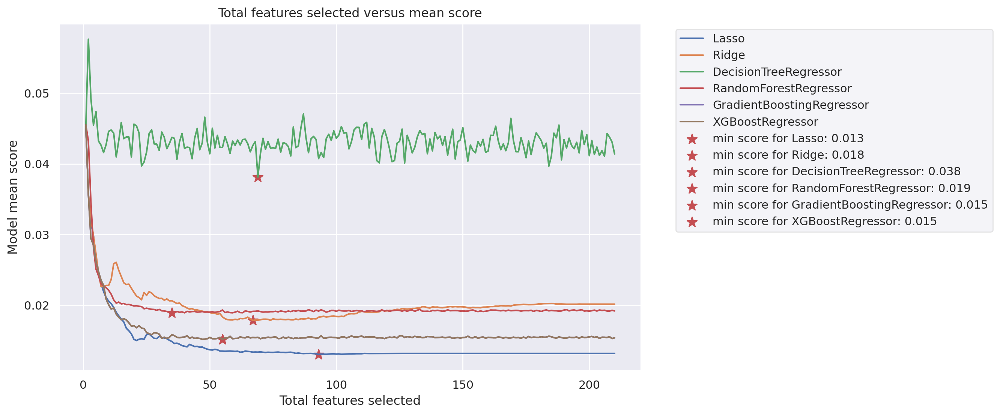

In [65]:
plt.figure(figsize=(10, 6))
plt.title('Total features selected versus mean score')
plt.xlabel('Total features selected')
plt.ylabel('Model mean score')
#plt.yscale('log')

min_scores = []
min_indices = []


for algorithm_name, scores in zip(list(algorithms.keys()), cv_results):
  min_index = np.argmin(scores)
  min_score = scores[min_index]
  min_indices.append(min_index + 1)
  min_scores.append(min_score)
  plt.plot(range(1, len(scores) + 1), scores, label=algorithm_name)

for i, (algorithm_name,  min_index) in enumerate(zip(list(algorithms.keys()), min_indices)):
    min_score = min_scores[i]
    plt.scatter(min_index, min_score, marker='*', s=100, color='r', label=f"min score for {algorithm_name}: {min_score:.3f}")

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', framealpha=0.5)
plt.show()


The plot illustrates the performance of each model as the number of selected features increases using cross-validation rmse score as the evaluation metric. Therefore, a lower curve indicates better performance.

It looks like Lasso is the best performing with a score of 0.013, followed closely by Gradient Boosting regerssor and Extreme Gradient boosting regressor (Xgboost) with the same score of 0.015.

Because of the close results, the decision seems somewhat inconclusive. Therefore we will further assess and select the best algorithm based on validation score.

Since Lasso seems the best performing according to RFECV, while Gradient Boosting and Xgboost come close second with the same rmse cv score and same set of selected features.  

In [66]:
best_features_lasso = no_corr_x_train.columns[selected_features[0]].to_list()
best_features_gb = no_corr_x_train.columns[selected_features[4]].to_list()
best_features_xgb = no_corr_x_train.columns[selected_features[5]].to_list()

lasso = Lasso(alpha=best_alpha, random_state=seed)
lasso.fit(no_corr_x_train.loc[:, best_features_lasso],  y_log_train_clean)
pred_lasso = lasso.predict(no_corr_x_valid.loc[:, best_features_lasso])
score_lasso = np.sqrt(mean_squared_error(y_log_valid, pred_lasso))
print('Lasso validation score', round(score_lasso, 3))

# score on validation set
gb = GradientBoostingRegressor(random_state=seed)
gb.fit(no_corr_x_train.loc[:, best_features_gb],  y_log_train_clean)
pred = gb.predict(no_corr_x_valid.loc[:, best_features_gb])
score_gb = np.sqrt(mean_squared_error(y_log_valid, pred))
print('GradientBoosting validation score', round(score_gb, 3))

xgb = XGBRegressor(random_state=seed)
xgb.fit(no_corr_x_train.loc[:, best_features_xgb], y_log_train_clean)
pred_xgb = xgb.predict(no_corr_x_valid.loc[:, best_features_xgb])
score_xgb = np.sqrt(mean_squared_error(y_log_valid, pred_xgb))
print('XGBRegressor validation score', round(score_xgb, 3))


Lasso validation score 0.148
GradientBoosting validation score 0.144
XGBRegressor validation score 0.141


**Conclusion :** It looks like XGBRegressor performs slightly better therefore we'll go with this model and its chosen features via RFECV method.


In [67]:
# get best features for best performing model
print('Optimal number of features is :', optimal_n_features[5])
print('Best features are :', no_corr_x_train.columns[selected_features[5]].to_list())
print('With a CV RMSE score of', round(min_scores[5], 3))

Optimal number of features is : 55
Best features are : ['LotArea', 'Alley', 'OverallQual', 'OverallCond', 'YearBuilt', 'MasVnrArea', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageFinish', 'GarageCars', 'GarageCond', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'ScreenPorch', 'YrSold', 'MSSubClass_30', 'MSZoning_RL', 'MSZoning_RM', 'LotConfig_CulDSac', 'Neighborhood_Crawfor', 'Neighborhood_Edwards', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_StoneBr', 'Neighborhood_Timber', 'Condition1_Norm', 'RoofStyle_Gable', 'RoofMatl_WdShngl', 'Exterior1st_BrkFace', 'Exterior1st_HdBoard', 'Exterior1st_WdShing', 'ExterQual_Gd', 'ExterQual_TA', 'ExterCond_Fa', 'Foundation_PConc', 'CentralAir_Y', 'GarageType_Attchd', 'GarageType_CarPort', 'GarageType_Detchd', 'SaleType_New', 'SaleType_WD', 'SaleCondition_Normal']
With a

Let's plot the RFCEV score for the model best that generates the best subset of features :

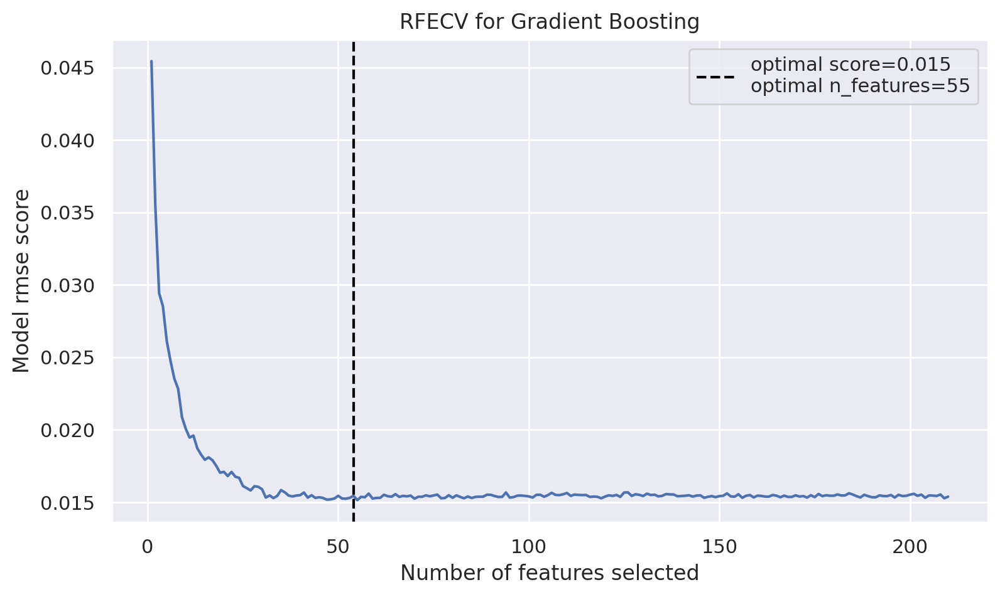

In [68]:
plt.figure( figsize=(9, 5))
plt.title('RFECV for Gradient Boosting')
plt.xlabel('Number of features selected')
plt.ylabel('Model rmse score')
rmse_scores =  cv_results[5]
plt.plot(range(1, len(cv_results[5]) + 1), rmse_scores)
plt.axvline(x=np.argmin(rmse_scores), color='black', linestyle='--', label=f'optimal score={np.min(rmse_scores):.3f}\noptimal n_features={optimal_n_features[5]}')
plt.legend()
plt.show()

In [69]:
# TODO : change selected_features name in REFCV code
wrapper_selected_features = selected_features
wrapper_method_features = {'GB RFECV' : no_corr_x_train.columns[wrapper_selected_features[4]].to_list(),
                           'Lasso REFECV' : no_corr_x_train.columns[wrapper_selected_features[0]].to_list(),
                           'XGB REFECV' : no_corr_x_train.columns[wrapper_selected_features[5]].to_list()
                           }
all_methods.update(wrapper_method_features)

Let's compare the results of RFECV wrapper methods to that of previously computed filter and embedded methods :

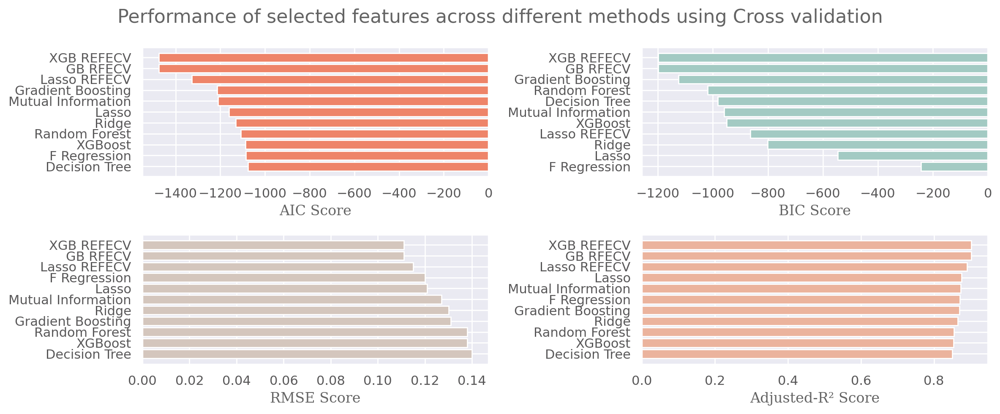

In [70]:
performance_on_LR_metrics(LinearRegression(), all_methods, no_corr_x_train, y_log_train_clean, figsize=(12, 5))

It looks like the models generated using RFECV wrapper method outpreforms the rest of feature selection methods like embedded and filter methods.

<br>

### Permutation feature importance method


Permutation importance is another wrapper method used to evaluate the importance of each feature. It's based on the premise that the most important features have a significant positive impact on model performance, meanwhile less-important ones have a minimal impact. Consequently we can deduce the importance of a given feature by the following process :

- First, the model performance is measured on the original values of the feature, this is considered the baseline, then the values of the features are randomly shuffled to introduce some noise.

- Next the model performance is measured again with the same data but with the permuted feature replacing the original one.

- Finally, the feature importance score is calculated as the mean decrease in the performance between the baseline and the model with the permuted feature. The larger the decrease in performance the higher the importance score assigned to this feature.

<br>

> In essence, Feature permutation approach allows us to identify the features that have the greatest impact on the model's performance. However, it's important to note that the calculated feature importance would be specific to the model. For instance, an important feature used in a poorly performing model may be considered less important.
Therefore, to avoid this issue, it's advised to use an already fitted model on training data and perform feature permutation on validation data. Using a held out set for this approach ensures that we obtain feature importance scores that are more generalizable and not overly specific to the model.

<br>

Let's implement feature importance using the feature permutation method provided by `sklearn`, we will look for the optimal value for `k` value which represents the top number of important features based on their permutation importance scores. By selecting the value of `k` that results in minimum rmse score.

In [71]:
def best_k_permutation_importance(n, model, X_train, y_train, X_valid, y_valid, kfolds):
    ''' find the optimal value for k, which represents the top number of important features according to the feature permutation importance method.
        n_repeats : number of times the feature was shuffled.
        For each k : k is the top number of important features according to FP.
        For each k : get permutation score (on validation set) for all features,
        Get the optimal top K features according to permutation importance method.
        Using held out test  => to reflect importances of features for generalization

    '''
    not_fit_model = model
    np.random.seed(seed)
    all_rmse = []
    selected_features = {}
    k_values = range(50, 180, 10)
    # Permutation importance calculated on validation set (held out set)
    result = permutation_importance(model.fit(X_train, y_train), X_valid, y_valid, n_repeats=10, n_jobs=-1)


    for k in k_values:
        sorted_idx = result.importances_mean.argsort()[::-1][:k]
        feature_names = no_corr_x_train.columns[sorted_idx]
        selected_features[k] = feature_names

        # calculate performance for the top k selected subset of features
        # need to pass a model that is not fitted
        metrics = LRMetrics(X_valid.loc[:, feature_names], y_valid, model=not_fit_model, kfolds=kfolds, all_metrics=False, rmse_cv=True)

        all_rmse.append(metrics.rmse)

    # select k with minimum rmse score
    best_rmse, best_k = min(zip(all_rmse, k_values), key=lambda x: x[0])
    return best_rmse, best_k, selected_features



In [72]:
gb =  GradientBoostingRegressor(random_state=seed)
best_rmse, best_top_k, perm_imp_features = best_k_permutation_importance(n, gb, no_corr_x_train, y_log_train_clean, no_corr_x_valid, y_log_valid, kfolds)
print(f'Selected top {best_top_k} features by sklearn permutation importance which are :\n', list(perm_imp_features[best_top_k]))

Selected top 80 features by sklearn permutation importance which are :
 ['OverallQual', 'LotArea', 'GarageCars', 'Fireplaces', 'TotRmsAbvGrd', 'FullBath', 'OverallCond', 'YearBuilt', 'BsmtFullBath', 'CentralAir_Y', 'WoodDeckSF', 'MSSubClass_30', 'KitchenQual', 'OpenPorchSF', 'HalfBath', 'ExterQual_TA', 'BsmtFinType1', 'Neighborhood_NoRidge', 'MasVnrArea', 'BsmtQual', 'ScreenPorch', 'GarageType_Detchd', 'BsmtExposure', 'ExterCond_Fa', 'GarageFinish', 'Neighborhood_Edwards', 'BsmtFinType2', 'SaleCondition_Normal', 'Neighborhood_BrkSide', 'GarageType_CarPort', 'MSZoning_RL', 'Foundation_PConc', 'GarageType_Attchd', 'BedroomAbvGr', 'Exterior1st_BrkFace', 'SaleCondition_Partial', 'SaleType_New', 'Exterior1st_HdBoard', 'HouseStyle_1.5Unf', 'Neighborhood_NridgHt', 'GarageQual', 'Neighborhood_OldTown', 'GarageType_NoGarage', 'KitchenAbvGr', 'Exterior1st_WdShing', 'Neighborhood_ClearCr', 'Foundation_CBlock', 'LotConfig_CulDSac', 'Fence', 'MSZoning_RM', 'Neighborhood_Timber', 'Neighborhood_Somer

Using Eli5 :

In [73]:
try:
    import eli5
    from eli5.sklearn import PermutationImportance
except ImportError:
    !pip -q install eli5
    import eli5
    from eli5.sklearn import PermutationImportance

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


Similarly, we will implement feature permutation importance provided by `eli5`.

Using `eli5` we test many top n number of features selected via permutation importance, and get their corresponding cross validation rmse.

- We first select the optimal n number of features selected via the `eli5` feature permutation approach (the n number that results in the best cv score).
- Next we compare this approach to the RFECV approach selecting the best performing subset of features.

In [74]:
def best_k_eli5(n, model, X_train, y_train, X_valid, y_valid, kfolds):
    '''Looks for the optimal that results in the lowest rmse score.'''
    np.random.seed(seed)
    all_rmse = []
    selected_features = {}
    k_values = range(50, 180, 10)
    not_fitted_model = model # to calculate evaluation metrics

    # we set cv to 'prefit' to calculate feature importances on the held out set
    perm = PermutationImportance(not_fitted_model.fit(X_train, y_train), cv='prefit', random_state=seed).fit(X_valid, y_valid)

    # get the feature importances as a dataframe
    weights_df = eli5.explain_weights_df(perm, feature_names=list(X_valid.columns))

    for k in k_values:
        # get the top k features
        top_k_features = weights_df.head(k)['feature'].tolist()
        selected_features[k] = top_k_features
        # calculate performance for the selected subset of features
        #metrics = LRMetrics(model, X.loc[:, top_n_features], y, kfolds, all_metrics=False)
        metrics = LRMetrics(X_valid.loc[:, top_k_features], y_valid, model=not_fitted_model, kfolds=kfolds, all_metrics=False, rmse_cv=True)
        all_rmse.append(metrics.rmse)

    # select k with minimum rmse score

    best_rmse, best_k = min(zip(all_rmse, k_values), key=lambda x: x[0])
    return best_rmse, best_k, selected_features

In [75]:
gb =  GradientBoostingRegressor(random_state=seed)
best_rms_eli5, best_top_k_eli5, eli5_features = best_k_eli5(n, gb, no_corr_x_train, y_log_train_clean,  no_corr_x_valid, y_log_valid, kfolds)
print(f'Selected top {best_top_k_eli5} features by sklearn permutation importance:\n', list(eli5_features[best_top_k_eli5]))


Selected top 50 features by sklearn permutation importance:
 ['OverallQual', 'LotArea', 'GarageCars', 'Fireplaces', 'FullBath', 'TotRmsAbvGrd', 'OverallCond', 'YearBuilt', 'BsmtFullBath', 'CentralAir_Y', 'WoodDeckSF', 'MSSubClass_30', 'ExterQual_TA', 'Neighborhood_NoRidge', 'KitchenQual', 'BsmtFinType1', 'HalfBath', 'MasVnrArea', 'OpenPorchSF', 'ScreenPorch', 'BsmtExposure', 'BsmtQual', 'ExterCond_Fa', 'MSZoning_RM', 'GarageType_Detchd', 'SaleCondition_Normal', 'GarageFinish', 'Neighborhood_BrkSide', 'Neighborhood_Edwards', 'GarageType_Attchd', 'Exterior1st_BrkFace', 'BsmtFinType2', 'BedroomAbvGr', 'SaleCondition_Partial', 'Neighborhood_Crawfor', 'SaleType_New', 'MSZoning_RL', 'GarageType_NoGarage', 'MoSold', 'GarageType_CarPort', 'HouseStyle_1.5Unf', 'Foundation_PConc', 'Condition1_Norm', 'Exterior1st_HdBoard', 'Neighborhood_ClearCr', 'YrSold', 'Fence', 'LotShape_Reg', 'Foundation_CBlock', 'Exterior1st_WdShing']


Let's compare the performance of model selected from permutation importance from `sklearn` and `eli5` to the ones selected from the rest of methods :

In [76]:
wrapper_method_features.update({
    'sklearn_perm_imp' : list(perm_imp_features[best_top_k]),
    'eli5_perm_im' : list(eli5_features[best_top_k_eli5])
    })

all_methods.update({'sklearn_perm_imp' : list(perm_imp_features[best_top_k]),
    'eli5_perm_im' : list(eli5_features[best_top_k_eli5]) })

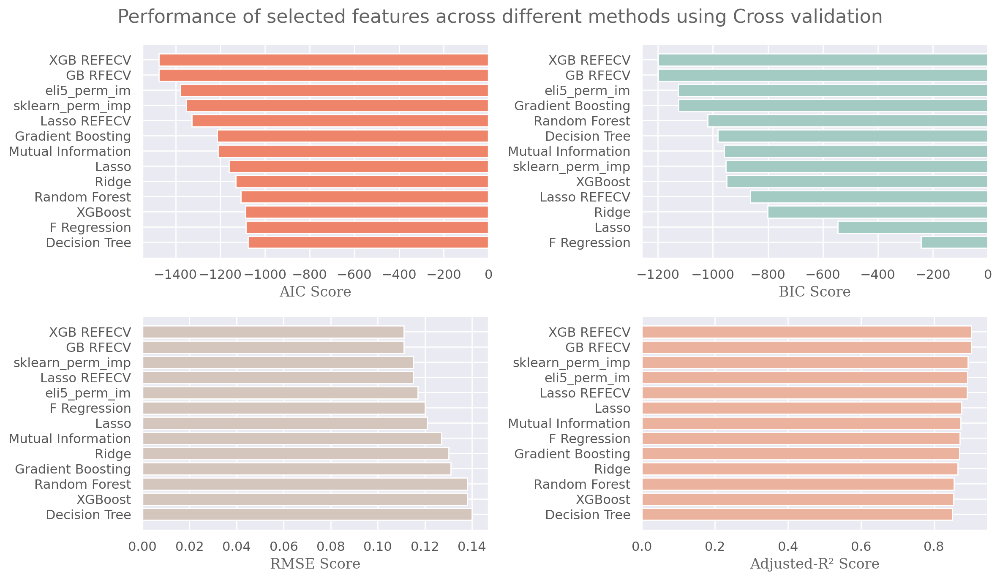

In [77]:
# on cross validation set
performance_on_LR_metrics(LinearRegression(), all_methods, no_corr_x_train, y_log_train_clean, figsize=(12, 7))

**Insights** :
- It looks like wrapper method RFECV methods outperforms Eli5 and sklearn feature permutation, and also outpreforms embedded methods and filter methods on all metrics when running cross validation on training set.


Let's look at the performance of different subsets of features on validation data :



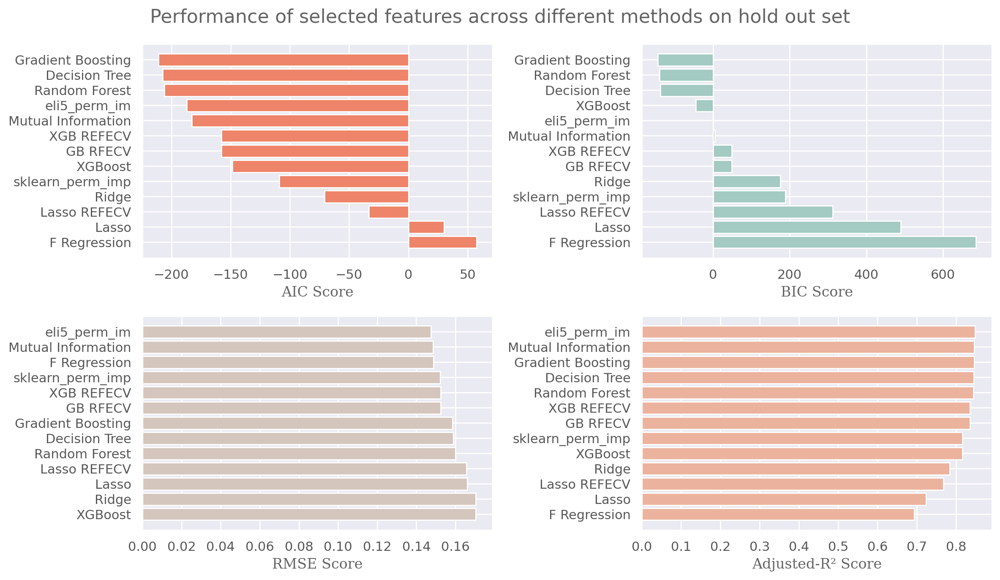

In [78]:
# performance on validation set
performance_on_LR_metrics(LinearRegression(), all_methods, no_corr_x_train, y_log_train_clean, x_valid=no_corr_x_valid, y_valid=y_log_valid, valid_set=True, figsize=(12, 7))

Let's take a look at the complexity of the selected subsets from all feature selection methods :

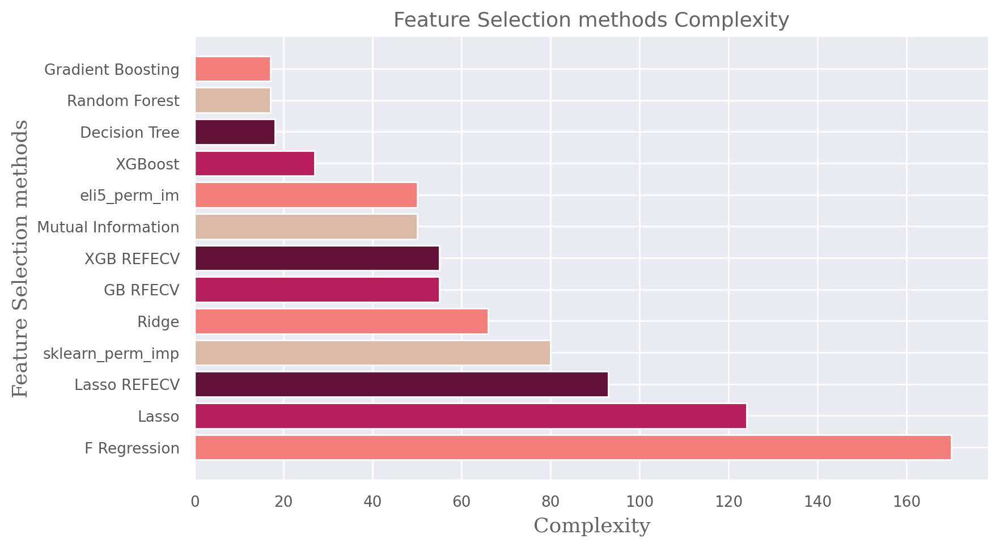

In [79]:
all_methods = embedded_methods_features.copy()
all_methods.update(filter_methods_features)
all_methods.update(wrapper_method_features)

all_methods = dict(sorted(all_methods.items(), key=lambda x: len(x[1]), reverse=True))

complexity = {}
for method, features in all_methods.items():
    complexity[method] = len(features)

colors = ['#f47e7a', '#b71f5c', '#621237', '#dbbaa7']
#colors = sns.color_palette("Set2")
fontdict= {'family': 'serif', 'color':'#646464'}

# show model complexity
fig = plt.figure(figsize=(9, 5))
plt.barh(list(complexity.keys()), list(complexity.values()), color=colors)


plt.xlabel('Complexity', fontsize=13,  fontdict=fontdict)
plt.ylabel('Feature Selection methods', fontsize=13,  fontdict=fontdict)
plt.title('Feature Selection methods Complexity', fontsize=13, color='#646464')

fig.axes[0].xaxis.set_ticklabels(fig.axes[0].xaxis.get_ticklabels(), color='#595859', fontsize=9.5)
fig.axes[0].yaxis.set_ticklabels(fig.axes[0].yaxis.get_ticklabels(), color='#595859' , fontsize=9.5)

plt.tight_layout()
plt.show()



**Insights** :

- `Gradient Boosting` achieved the best performance based on AIC and BIC, and the second best performance based on Adjusted R² on the validation set. This indicates that the feature subsets selected by `Gradient Boosting` provide a good fit to the model and demonstrate strong predictive performance. These subsets effectively reduce model complexity on the validation data, resulting in a better trade-off between model complexity and fit, this makes sense since `Gradient Boosting` has the smallest model complexity consisting of only 17 features.


- Furthermore, since the performance evaluation is conducted on a hold out set, it demonstrates that the model built using this subset of features obtained from the embedded method of `Gradient Boosting` exhibits good generalization to unseen data. On the other hand,  `F-Regression` performed the worst on these metrics because it has the largest model size with 170 features and Information criterion metrics penalize large models with non-relevant features.



- According to *RMSE* and *Adjusted R²* scores on validation set, the feature subset selected by `eli5_perm_imp` performed the best. This suggests that `eli5_perm_imp` selected feature subset resulted in the lowest prediction error on the validation set, while `Xgboost` selected feature subset had the highest prediction error.


<br>

**As a reminder** :

> RMSE metric measures the prediction error of a model, Lower RMSE values indicate better prediction accuracy. Meanwhile AIC and BIC balance the fit and complexity of the model. Lower values of AIC and BIC indicate better model fit with fewer features, while BIC apply stronger penalty for model complexity compared to AIC.

<br>

**Choice of the final model** :

- `Gradient Boosting` performed according  *AIC*, *BIC*, and *Adjusted R²*
(third best) on the validation set, meanwhile `eli5_perm_imp` performed best on *RMSE* and *Adjusted R²*. However it's important to consider the complexity of the model, the fact that the feature subset selected by `Gradient Boosting` has a lower model complexity with only 17 features compared to `eli5_perm_imp`'s 50 features makes it more practical for user input in the Streamlit web app. Therefore, the set of features obtained through the embedded method of `Gradient Boosting` will be chosen as the final set of features for modeling.

<br>




##  🧠 Modeling

In [ ]:
GB_selected_features= ['LotArea',
'OverallQual',
'OverallCond',
'YearBuilt',
'BsmtFullBath',
'FullBath',
'KitchenQual',
'TotRmsAbvGrd',
'Fireplaces',
'GarageCars',
'WoodDeckSF',
'OpenPorchSF',
'MSSubClass_30',
'MSZoning_RM',
'ExterQual_TA',
'CentralAir_Y',
'GarageType_Detchd']


In [ ]:
# get new dataset
X_train = no_corr_x_train.loc[:, GB_selected_features]
X_valid = no_corr_x_valid.loc[:, GB_selected_features]
X_test = X_test.loc[:, GB_selected_features]

print(f"After applying feature selection the number of features went from {no_corr_x_train.shape[1]} to {X_train.shape[1]} reducing the number approximately by a factor of {X_train.shape[1] /no_corr_x_train.shape[1] :.1f}")

After applying feature selection the number of features went from 210 to 17 reducing the number approximately by a factor of 0.1


### Evaluate candidate models

In [ ]:
try :
    from catboost import CatBoostRegressor
except ModuleNotFoundError:
    !pip -q install catboost
    from catboost import CatBoostRegressor


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 MB 9.4 MB/s eta 0:00:00


In [ ]:
# TODO : Add dictionary and use zip(*dict)

regressors = [DummyRegressor(),
                   LinearRegression(),
                   Ridge(random_state=seed),
                   Lasso(random_state=seed),
                   ElasticNet(random_state=seed),
                   KernelRidge(),
                   SVR(),
                   DecisionTreeRegressor(random_state=seed),
                   RandomForestRegressor(random_state=seed),
                   GradientBoostingRegressor(random_state =seed),
                  AdaBoostRegressor(random_state=seed),
                  LGBMRegressor(objective='regression',
                                       verbose=-1,
                                       random_state=seed) ,
                  XGBRegressor(random_state=seed),
                CatBoostRegressor(logging_level='Silent', random_seed=seed)]




Let's define how the models mentioned above work :

<br>

**Dummy Regressor** is a naive regression model that predicts tha same constant value for any given input X, usually the mean of the response variable. It acts as a baseline model to compare with other regressors. If the Dummy regressor perfoms better than all other regression models,  it indicates that the models are unable to capture the underlying patterns in the data and that there is something wrong in the preprocessing stage of the data.

<br>

**Support Vector Regression -  SVR** is an adaptation of the Support Vector Machine (SVM) algorithm for regression tasks.
- The goal of SVR is to find a hyperplane, which represents the regression function, that captures most of the data points within a margin. In this case, the margin refers to the width of the region around the hyperplane, called the epsilon-insensitive tube. The data points that fall within this tube are considered well predicted and do not contribute to the loss function while the ones that fall outside of this tube are considered errors that should be penalized by the loss function.

- To control the amount of error tolerated, SVR introduces the epsilon (ε) parameter, which determines the width of the epsilon-insensitive tube, where a higher epsilon value results in a larger tube width that allows more errors to be tolerated, while a smaller epsilon value results in a tigher tube fit that has very little tolerance to errors. Consequently the SVR loss function known as  ϵ-insensitive loss function aims to maximize the margin to capture most of the data points but also penalize errors.

<br>

**Kernel Ridge regression - KRR**  is an extension of Ridge Regression that uses the kernel trick to handle non-linear data,  it uses Kernels functions which projects the original non-linear data into a higher dimension  space where the data becomes linearly separable.  Kernels are used as a measure of similarity between pairs of data points since they calculate their inner product in the higher dimensional space.

<br>


**Elastic Net**  combines both penalties of Lasso and Ridge to shrink the size of the coefficients using both L1 and L2 norms:
- Least Squares + λ1 * L1 penalty + λ2 * L2 penalty
- The λ1 and λ2 parameters control the strength of the L1 and L2 penalties, respectively. By adjusting these parameters, you can control the amount of sparsity and the level of shrinkage applied to the coefficients.

<br>

**Decision Tree** is an algorithm that draws decision rules from training data and uses them to make predictions. It works on constructing a hierarchical tree-like structure by recursively partionning the instances based on test attributes in the feature space until only homogenuous nodes that contain similar instances are left in the tree.

However, decision trees can be unstable because small variations in the data might result in a completely different tree being generated.  To remedy this issue and reduce the variance associated with decision trees  Random Forests are employed. This brings us to the idea of ensemble learning.

<br>

>*The previously mentioned algorithms are all individual learners. The following models are ensembles. To gain a deeper understanding of these ensemble models, let's explore what ensemble learning is and how some of the most popular ensemble algorithms like XGBoost, LightGBM, among others, operate.*



<br>

**Ensembles**  are used to improve machine learning results by combining several learners. They work on balancing the bias variance trade-off to get a better predictive performance compared to a single model. There are two main classes of ensemble learning :

<br>

- **Bagging** : is a Bootsrap aggregation model that combines base models in a parallel manner, it works on reducing variance of high variance models, one example of Bagging ensemble is Random Forest.

    - `Bootsrapping` :  performs random row and feature sampling with replacement from the training set, which means that a single instance can appear in multiple subsets.

    - `Aggregation` : After training each base models independently on a different subset of data, their predictions are combined to form a final output. In the case of a classification problem the final output is determined by a majority voting. Meanwhile for regression problem, the final output is calculated as mean of all base models predictions.

<br>


- **Boosting** : is an ensemble learning algorithm that sequentially adds learners to an ensemble. The objective of each added learner is to correct the prediction errors made by the existing models in the ensemble. Boosting uses weak learners with high bias as base models, that individually may have limited predictive power but together can contribute to a stronger overall model. Some examples of Boosting models include  AdaBoost, Gradient Boosting, XGBoost, LightGBM, etc.


<br>

- **Stacking** : combines base models into a meta learner, we will explain in the following part, when we implement it. is an ensemble learning technique that combines multiple base models into a meta-learner. The meta-learner takes the predictions from the base models as input and learns to make the final predictions. In the following section (TODO: insert hyperlink), we will explain the implementation of stacking and how it works in more detail.

<br>



**Random Forest** is a bagging ensemble that combines the predictions the predictions of multiple decision trees to combat the overfitting problem of decision trees, here is how it works in detail :

1. Boostrapping part : it splits the entire training set into subsets by performing observation and feature sampling with replacement.

2. Each subset is used to train a separate decision tree independently and in parallel.

3. After training, each decision tree is used to generate predictions on the entire testing set.

4. The produced predictions on testing set are aggregated to obtain the final prediction, either using averaging for regression problems or voting for classifiation ones. This helps to reduce variance of the individual predictions.



<br>

>*The following ensembles are all boosting ensembles* :

<br>


**Adaboost - Adaptive boosting** : is a boosting ensemble algorithm where each learner in the ensemble sequentially corrects the errors made by its predecessors. AdaBoost uses decision stumps, which are trees with a single split as base models. It starts by assigning equal weights to all instances in the training set, then in each iteration, a weak learner is trained on the weighted training set and after the learner's predictions are evaluated, higher weights are assigned to the instances that were wrongly predicted, that is, instances with larger errors. This adaptive weighting strategy allows each learner to put more focus on the mistakes made by the previous learners in the ensemble to improve its overall performance over iterations and to create a strong ensemble model.


<br>

**Gradient Boosted Regression Trees - GBRT** also known as gradient boosting machine (GBM) is an ***additive model***
 that works on squentially adding weak learners that nudge the ensemble performance to make more accurate predictions.

In GBM, the nudging of each weak learner is achieved by **applying gradient descent on the predictions** rather than on the parameters as done in neural networks. Therefore the goal of GBM is to update the predictions to minimize the overall ensemble loss.

Here is how GBM works :

1. The first weak learner predicts a constant value which is the mean of the target variable ȳ, then the residual of this learner is calculated as the difference between mean value ȳ and the true target y.

2. The next weak learner is trained on the features of the original training data as input X and the previously calculated residuals as the target variable, this way it maps the features to the residuals.

3. The previous learner generates a prediction which is another set of residuals, this represents the deviations that are not yet explained by the previous weak learners. These residuals are then used to calculate the gradient with respect to the current predictions.

4. The calculated gradient is added to the existing model's predictions scaled by a learning rate, which controls the impact of each weak learner’s predictions to avoid overfitting. The Learning rate value ranges between 0 and 1, where the smaller the LR value is the smaller the impact of the weak learners on the ensemble.

5. Steps 2 to 4 are repeated until no added weak learner improves ther predictions of the ensemble or when it hits a stopping criteria like pre-defined number of weak learners.

It's important to note that there is a **trade-off between the learning rate and the number of weak learners** in Gradient Boosting. A small learning rate requires increasing the number of estimators to a certain model performance, because, as mentioned earlier, it reduces the contribution of each weak learner which helps in preventing overfitting. However, to sufficiently minimize the loss function GBM may require a higher number of learners.

<br>

> *In short, GBM adds new weak learners, calculates residuals, trains them on the features and residuals, and then updates the model's predictions to get closer to true target values. Gradient Boosting typically uses Decision trees with 8 to 32 number of leaves as weak learners as opposed to stump trees that AdaBoost  uses as base learners.*




<br>


The following ensembles are all **variants of Gradient Boosting** algorithm :

<br>

**Extreme Gradient Boosting - Xgboost**  is a Gradient Boosting algorithm
that is considerd more efficient due to several performance enhancing modifications:

- It offers different regularization methods like **L1 and L2 norms** to the loss function to prevent overfitting and improve generalization.

- It enables the **tuning of various hyperparameters** to constrain the trees, which provides more control over the model complexity.

- It uses **parallel and distributed computing** to to accelerate the runtime and the proccessing of large datasets.

- It uses **Histogram-based gradient boosting**, which transfroms continuous values of a feature to bins, this way instead of split testing on all possible threshold values, it only tests on a fewer number of unique values, this also results in faster runtime.

- **Depth-wise Tree Growth** : XGBoost uses decision trees that grow level-wise or depth-wise, where it considers all nodes at the same depth for splitting before proceeding to the next depth of the tree.


<br>


**Light Gradient Boosting - LightGBM** is another variant of the gradient boosting algorithm, here are the techniques that LightGBM incorporates to improve performance:


- **Gradient-Based One-Side Sampling - GOSS** : LightGBM reduces the number of instances by using GOSS. Since large gradients mean larger error, GOSS aims to put more focus on the under-trained instances with larger gradients by retaining them, while randomly sampling from instances with smaller gradients that are already well learnt by the algorithm.

- **Exclusive Feature Bundling - EFB** :  LightGBM reduces the number of features in the dataset by using EFB. It groups together sparse features that are mutually exclusive, for instance, if two one-hot encoded features never have the same value of 1 (non-zero value) simultaneously, then they are considered mutually exclusive. In this case, EFB bundles these two features together and treats them as a single feature. This effectively reduces the number of features without losing much information.


- **Leaf-wise Tree Growth** : It uses decision trees that grow leaf-wise, meaning it doesn't consider all nodes at the same depth for splitting, but it considers a single node that that optimizes the splitting criterion.

<br>

> *Overall, LightGBM incorporates innovative techniques such as GOSS and EFB, which reduce the number of features and observations in the dataset. This reduction in data size significantly reduces the training time making LightGBM approximately 7 times faster than XGBoost,  hence the ` Light` in `LightGBM`. This makes it the perferred choice over XgBoost when dealing with large datasets.*


<br>


**Category Boosting - CatBoost** is another gradient boosting algorithm that performs particularly well on datasets with categorical features because it inherently handles categorical encoding and text data.

- It uses **symmetric binary trees**, where symmetric refers to trees whose nodes at each level use the same split on the same feature, unlike XGBoost and LightBoost that use asymmetric trees which uses different splits on different features on each level, This enables faster training and improves the computational efficiency of the overall ensemble.



<br>

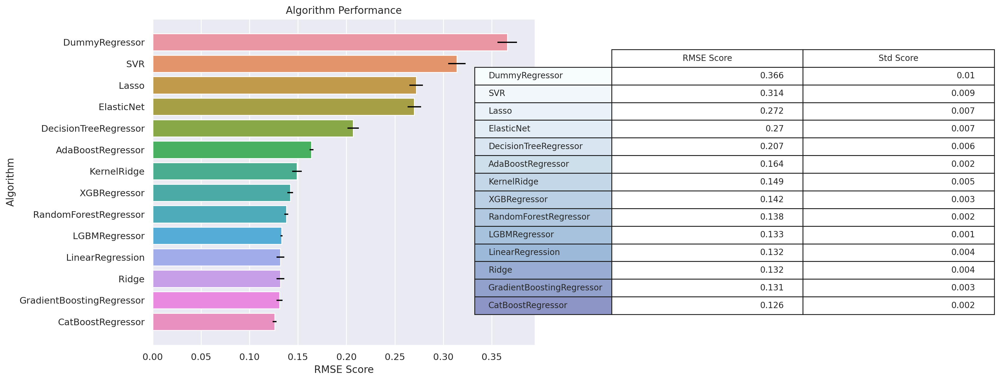

In [ ]:
def base_models(models, X, y, kfolds=7, plot=True):
    '''
    models (dict) : mapping names to algorithms
    '''

    model_scores = {}

    for model in models:
        rmse_scores = cross_val_score(model, X, y, cv=kfolds, scoring='neg_mean_squared_error')
        rmse = round(np.sqrt(-rmse_scores.mean()), 3)
        std_score = round(np.std(rmse_scores), 3)

        model_scores[model.__class__.__name__] = [rmse, std_score]


    # sort models according to their rmse score
    scores = dict(sorted(model_scores.items(), key=lambda x: x[1][0], reverse=True))

    if plot:
        fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 8))
        # Plot bar plot with error bars (std scores)
        sns.barplot(x=[score[0] for score in scores.values()], y=list(scores.keys()), ax=ax[0], orient='h')
        ax[0].errorbar(x=[score[0] for score in scores.values()], y=list(scores.keys()), xerr=[score[1] for score in scores.values()], fmt='none', color='black')
        ax[0].set(xlabel='RMSE Score', ylabel='Algorithm', title='Algorithm Performance')

        # plot table using DF
        res_df = pd.DataFrame.from_dict(scores, orient='index', columns=['RMSE Score', 'Std Score'])
        colors = plt.cm.BuPu(np.linspace(0, 0.5, len(res_df)))
        table = ax[1].table(cellText=res_df.values, colLabels=res_df.columns, rowLabels=res_df.index, loc='center', rowColours=colors)
        table.auto_set_font_size(False)
        table.set_fontsize(10)
        table.scale(1, 2)
        ax[1].axis('off')

        plt.subplots_adjust(left=0.2, bottom=0.2)
        plt.show()
        return res_df
    else :
        return scores

res_df = base_models(regressors, X_train, y_log_train_clean)

### Hyperparameter tuning using Bayesian optimization

Based on the evaluation at the top, we will select the best-performing models to further optimize. To achieve this, I we will run Bayesian hyperparameter optimization to find the optimal set of hyperparameter values for each model.

I chose Bayesian optimization over Grid or Random optimization to search for the best hyperparameter combinations  because Bayesian optimization intelligently explores the search space by selecting hyperparameter configurations to evaluate based on previous evaluations and their performances. This approach is more efficient than Grid search, which exhaustively tries all combinations and can be computationally expensive, or Random search which selects configurations at random.

<br>

Bayesian optimization selects the next hyperparameter configuration to evaluate based on previous evaluations and their corresponding performance. It uses a surrogate model, typically a probabilistic model to capture the underlying mapping function in the observed data. The surrogate model is trained on the previous hyperparameter configurations and their corresponding performances, and it is updated as new evaluations are conducted.

Using the trained surrogate model, Bayesian optimization predicts multiple unevaluated hyperparameter configurations and estimates their mean and variance. Then the acquisition function uses these mean and variance estimates to select the next configuration to evaluate, which balance the exploitation-exploration trade-off :

- Exploration means favoring configurations with high uncertainty to explore unknown regions of the hyperparameter space to discover potentially better configurations. The uncertainty quantified using the variance estimate provided by the surrogate model.

- Exploitation means favoring configurations that are predicted to have high performance using the mean estimate provided by the surrogate model. This focuses on exploiting the known good regions of the hyperparameter space.



<br>

I will be performing hyperparameter optimization on the combination of the training and validation set. Since the stacking ensemble is the final phase of modeling and I intend to use it to make predictions on the testing data, it makes sense to find more robust and reliable estimates of the optimal hyperparameters for your base models if we optimize the base models on a larger portion of the data, which includes both the training and validation sets.

However, to ensure that the hyperparameter optimization process does not lead to overfitting, we will be using cross validation setup on the combination of the data using BayesSearchCV  from the `Scikit-Optimize` library or `skopt` for short.

<br>

In [ ]:
!pip -q install git+https://github.com/scikit-optimize/scikit-optimize.git
from skopt import BayesSearchCV

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
all_train_x = pd.concat([X_train, X_valid], axis=0)
all_train_y = pd.concat([y_log_train_clean, y_log_valid], axis=0)

In [ ]:
y_log_valid.shape, y_log_train_clean.shape, X_valid.shape, X_train.shape, all_train_x.shape, X_test.shape

((292,), (1018,), (292, 17), (1018, 17), (1310, 17), (1459, 17))

In [ ]:
model_to_search_space = {
       'Ridge': {
        'model': Ridge(),
        'search_space': {
            'alpha': (0.0001, 10),
            'fit_intercept': (True, False),
            'solver': ('auto', 'svd', 'cholesky', 'lsqr', 'sag','sparse_cg'),
            'tol': (1e-3, 1e-1),
            'max_iter': (100, 1000)}

    },

    'KernelRidge': {
        'model': KernelRidge(),
        'search_space': {
            'alpha': (0.0001, 10),
            'kernel': ('linear', 'poly', 'rbf', 'sigmoid'),
            'degree': (1, 5),
            'coef0': (0, 1),}
    },

    'CatBoostRegressor': {
        'model': CatBoostRegressor(silent=True),
        'search_space': {
            'n_estimators': (100, 5000),
            'learning_rate': (0.001, 1.0),
            'depth': (2, 10),
            }
        },


    'DecisionTreeRegressor': {
        'model': DecisionTreeRegressor(),
        'search_space': {
            'max_depth': (1, 100),
            'min_samples_split': (2, 10),
            'min_samples_leaf': (1, 10),
            'max_features': ('auto', 'sqrt', 'log2')
        }
    },

    'AdaBoostRegressor': {
        'model': AdaBoostRegressor(),
        'search_space': {
            'learning_rate': (0.01, 0.1),
            'n_estimators': (100, 5000),
            'loss': ('linear', 'square', 'exponential'),
        }


    },

    'RandomForestRegressor': {
        'model': RandomForestRegressor(),
        'search_space': {
            'n_estimators': (100, 5000),
            'max_depth': (3, 20),
            'min_samples_split': (2, 10),
            'min_samples_leaf': (1, 10),
            'max_features': ['auto', 'sqrt', 'log2']
        }
    },


    'XGBRegressor': {
        'model': XGBRegressor(),
        'search_space': {
            'gamma' :  (1e-9, 0.5, 'log-uniform') , # Gamma specifies the minimum loss reduction required to make a split.
            'min_child_weight' : (0, 10)  , # Defines the minimum sum of weights of all observations required in a child.
            'subsample' :   (0.5, 1.0, 'uniform') , #Lower values make the algorithm more conservative and prevent overfitting,
                                    # but too small values might lead to under-fitting.
                                    # Typical values: 0.5-1
            'colsample_bytree' :  (0.5, 1.0, 'uniform'), #
            'colsample_bylevel' :  (0.01, 1.0, 'uniform') ,
            'reg_alpha' :  (1e-9, 1.0), # L1 regularization term on weight (analogous to Lasso regression)
            'reg_lambda': (1e-9, 1.0),   # L2 regularization term on weights (
            'n_estimators': (50, 5000),
            'max_depth': (3, 20),
            'learning_rate': (0.01, 1.0), # Makes the model more robust by shrinking the weights on each step
        # If max_leaf_nodes is defined, GBM will ignore max_depth
        }

    },

    'LGBMRegressor': {
        'model': LGBMRegressor(silent=True),
        'search_space': {
            'learning_rate': (0.01, 0.1),
            'n_estimators': (100, 5000),
            'max_depth': (3, 20),
            'min_child_weight': (0, 10),

            'num_leaves': (4, 50),
            'subsample': (0.5, 1.0),
            'colsample_bytree': (0.5, 1.0),
            'colsample_bylevel': (0.01, 1.0),
            'reg_alpha': (0, 1),
            'reg_lambda': (0, 1),
            'gamma': (1e-9, 0.5, 'log-uniform')
            }

    },
    'GradientBoostingRegressor': {
        'model': GradientBoostingRegressor(),
        'search_space': {
            'learning_rate': (0.01, 0.1),
            'n_estimators': (100, 5000),
            'max_depth': (3, 20),
            'min_samples_split': (2, 10),
            'min_samples_leaf': (1, 10),
            'max_features': (0.1, 1.0),
            'subsample': (0.5, 1.0),
        }
    },

}


In [ ]:
def run_bayesian_optimization(models_dict, X_train, y_train, n_iter, cv):
    scores = []
    best_params = []
    best_models = []

    for model_name, config in models_dict.items():
        model = config['model']
        search_space = config['search_space']
        bayes = BayesSearchCV(model, search_space, n_iter=n_iter, cv=cv, scoring = 'neg_mean_squared_error',random_state=seed)
        bayes.fit(X_train, y_train)
        best_hyperparameters = bayes.best_params_
        scores.append(bayes.best_score_)
        best_params.append(bayes.best_params_)
        best_models.append(bayes.best_estimator_)
        print(f'Hyper-parameter search is done for {model_name} model.')
        print('\n', bayes.best_score_, '\n' , bayes.best_params_, '\n' , bayes.best_estimator_)

    return scores, best_params, best_models


scores, best_params, best_models = run_bayesian_optimization(model_to_search_space, all_train_x, all_train_y, n_iter=50, cv=5)

In [ ]:
from collections import OrderedDict
model_instances = [Ridge(), KernelRidge(), CatBoostRegressor(silent=True), DecisionTreeRegressor(), AdaBoostRegressor(), RandomForestRegressor(),
                   XGBRegressor(), LGBMRegressor(silent=True), GradientBoostingRegressor()]


model_instances = [Ridge(), KernelRidge(), CatBoostRegressor(silent=True), DecisionTreeRegressor(), AdaBoostRegressor(), RandomForestRegressor(),
                   XGBRegressor(), LGBMRegressor(silent=True), GradientBoostingRegressor()]


best_params = [OrderedDict([('alpha', 6.378099410010848),
              ('fit_intercept', True),
              ('max_iter', 706),
              ('solver', 'cholesky'),
              ('tol', 0.07051812583665994)]),
 OrderedDict([('alpha', 7.0264796599443455),
              ('coef0', 0),
              ('degree', 3),
              ('kernel', 'linear')]),
 OrderedDict([('depth', 9),
              ('learning_rate', 0.014435601458621019),
              ('n_estimators', 3872)]),
 OrderedDict([('max_depth', 83),
              ('max_features', 'auto'),
              ('min_samples_leaf', 8),
              ('min_samples_split', 4)]),
 OrderedDict([('learning_rate', 0.1),
              ('loss', 'square'),
              ('n_estimators', 2105)]),
 OrderedDict([('max_depth', 14),
              ('max_features', 'log2'),
              ('min_samples_leaf', 1),
              ('min_samples_split', 2),
              ('n_estimators', 5000)]),
 OrderedDict([('colsample_bylevel', 0.28980420504815196),
              ('colsample_bytree', 0.5786605522448549),
              ('gamma', 1.8693890003064426e-08),
              ('learning_rate', 0.01),
              ('max_depth', 3),
              ('min_child_weight', 2),
              ('n_estimators', 3249),
              ('reg_alpha', 0.7096330813827386),
              ('reg_lambda', 0.006746331500899657),
              ('subsample', 0.8861974682754986)]),
 OrderedDict([('colsample_bylevel', 0.7056185425199154),
              ('colsample_bytree', 0.5308258659071117),
              ('gamma', 1.8992018546362966e-06),
              ('learning_rate', 0.023107905585776564),
              ('max_depth', 11),
              ('min_child_weight', 9),
              ('n_estimators', 387),
              ('num_leaves', 16),
              ('reg_alpha', 0),
              ('reg_lambda', 1),
              ('subsample', 0.6578212134843727)]),
 OrderedDict([('learning_rate', 0.01),
              ('max_depth', 3),
              ('max_features', 0.1),
              ('min_samples_leaf', 1),
              ('min_samples_split', 10),
              ('n_estimators', 4154),
              ('subsample', 1.0)])]


scores = [-0.019077507805301288,
 -0.023559281038906563,
 -0.016396478118531316,
 -0.03058627540908389,
 -0.027985787649887094,
 -0.01794493567827717,
 -0.016512144679641565,
 -0.016908234202990265,
 -0.016429783178680137]


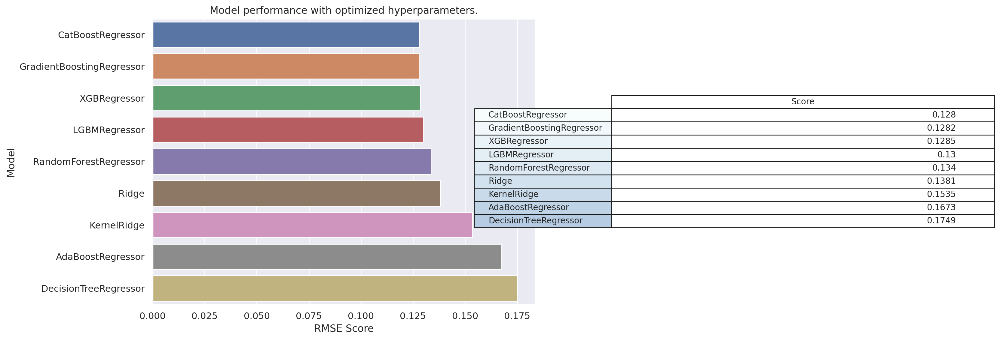

In [ ]:
scores = list(map(lambda x: round(np.sqrt(np.abs(x)), 4), scores))
search_models = list(model_to_search_space.keys())
zipped = sorted(zip(search_models, scores), key= lambda x: x[1])
search_models_ord, rmse_scores = zip(*zipped)

# plot bar plot
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 7))
sns.barplot(x=list(rmse_scores), y=list(search_models_ord), ax=ax[0], orient='h')
ax[0].set(xlabel='RMSE Score', ylabel='Model', title='Model performance with optimized hyperparameters.')

# plot table using DF
res_df = pd.DataFrame(data=rmse_scores, index=search_models_ord, columns=['Score'])
colors = plt.cm.BuPu(np.linspace(0, 0.5, 15))

table = ax[1].table(cellText=res_df.values, colLabels=res_df.columns, rowLabels=res_df.index, loc='center', rowColours=colors)
table.auto_set_font_size(True)
table.set_fontsize(10)
table.scale(1, 1.5)
ax[1].axis('off')

plt.subplots_adjust(left=0.2, bottom=0.2)
plt.show()

Catboost doesn't return model instance with best parameter when calling best_estimator_, therefore :

In [ ]:
# get model instances with their best params

# The following uncommented line is an attempt to get best_models_ back without running hyperparameter search again
model_instances = [Ridge(), KernelRidge(), CatBoostRegressor(silent=True), DecisionTreeRegressor(), AdaBoostRegressor(), RandomForestRegressor(), XGBRegressor(), LGBMRegressor(silent=True), GradientBoostingRegressor()]

optimized_models = {}

# get model instances with their best params
for model, model_name, params in zip(model_instances, search_models, best_params):
    for param, value in params.items():
        setattr(model, param, value)
    optimized_models[model_name] = model

best_models = model_instances.copy()

# Or get optimized_models.values( inside a list and assign it to best_models ), once you do
# uncomment the next line and replace model_instances by best_models
"""
optimized_models = {}
for model, model_name in zip(model_instances, search_models):
    optimized_models[model_name] = model

"""

'\noptimized_models = {}\nfor model, model_name in zip(model_instances, search_models):\n    optimized_models[model_name] = model\n\n'

### Stacking ensemble

Stacking is an ensemble learning technique, also known as stacked generalization, that has been shown to outperform other ensemble algorithms such as Boosting and Bagging algorithms, including GBM and RF. It is specifically designed to leverage the strengths of a diverse set of strong learners.

Stacking involves training a meta-learner on the combined out-of-fold predictions of the strong base learners. Here is a detailed explanation of how it works:

- During a k-fold cross-validation procedure, all base models are trained on the same folds of data. Initially, the base models are independently fitted on the training fold, and then predictions are generated for the out-of-fold (oof) data.

- The combined oof predictions from all base models are used as training data, creating new features for the meta model. This combined oof predictions data is often referred to as one level data.

- The meta-model is then trained on these features to make the final prediction.

If the predictions of the base models are highly correlated, then the meta-model will not have as much information to work with, and the final prediction will not be as accurate.

In [ ]:
class StackingEnsemble:
    def __init__(self, X_train, y_train, X_test, base_models, meta_with_kfold, meta_model=None, num_folds=5, verbose_score=True):

        self.num_folds = num_folds
        self.kfolds = KFold(num_folds, shuffle=True, random_state=seed)
        self.base_models =  base_models
        self.meta_model = meta_model
        self.X_train = X_train
        self.y_train = y_train
        self.X_test = X_test

        self.test_predictions = {model_name: np.zeros((self.X_test.shape[0], num_folds)) for model_name in self.base_models} # shape = [n_samples]
        self.oof_predictions = {model_name: np.zeros(self.X_train.shape[0]) for model_name in self.base_models}
        self.scores = {model_name: [] for model_name in self.base_models.keys()}

        self.meta_with_kfold = meta_with_kfold
        self.verbose_score = verbose_score
        self.fitted_base_models_per_fold = [[] for _ in self.base_models]
        self.out_of_fold_predictions = np.zeros((self.X_train.shape[0], len(self.base_models)))


    def train_base_models(self):
        """
        Trains base models and computes out-of-fold predictions and scores.
        """
        self.X_train = self.X_train.reset_index(drop=True)  # reset index to avoid index error inside Kfold CV
        self.y_train = self.y_train.reset_index(drop=True)

        for idx, (model_name, model) in enumerate(self.base_models.items()):
            for fold, (train_idx, val_idx) in enumerate(self.kfolds.split(self.X_train, self.y_train)):
                X_trn, y_trn = self.X_train.loc[train_idx, :], self.y_train.loc[train_idx]
                X_val, y_val = self.X_train.loc[val_idx, :], self.y_train.loc[val_idx]

                model.fit(X_trn, y_trn)

                self.fitted_base_models_per_fold[idx].append(model)

                val_pred = model.predict(X_val)
                test_pred = model.predict(self.X_test)

                self.oof_predictions[model_name][val_idx] = val_pred
                self.test_predictions[model_name][:, fold] = test_pred

                # compute oof score for each model
                fold_score = StackingEnsemble.rmse(y_val, val_pred)
                self.scores[model_name].append(fold_score)


        if self.verbose_score:
            for model_name, fold_scores in self.scores.items():
                mean_score = np.mean(fold_scores)
                std_score = np.std(fold_scores)
                print(f'Out-of-fold mean score for {model_name} is: {np.round(mean_score, 4)}, std : {np.round(std_score, 4)}')

        self._construct_one_level_data()

    def _construct_one_level_data(self):
        """
        Constructs one-level data for meta-learner training and final predictions.
        """
        self.meta_input_data =  pd.DataFrame.from_dict(self.oof_predictions) # self.out_of_fold_predictions
        # compute the mean of each matrix in the values of the dictionary
        self.meta_predict_data = pd.DataFrame.from_dict({model_name: self.test_predictions[model_name].mean(axis=1) for model_name in self.base_models})

    @staticmethod
    def rmse(y, y_pred):
        return np.sqrt(mean_squared_error(y, y_pred))


    def train_meta_model(self):
        """
        Trains meta-learner model and computes final predictions.
        """
        if self.meta_model is None:
            raise ValueError('Meta model must be provided in class constructor if you invoke `train_meta_model` method.')

        if not self.meta_with_kfold:
            self.meta_model.fit(self.meta_input_data, self.y_train)
            self.fitted_meta_model = self.meta_model.copy()
            meta_test_y = self.meta_model.predict(self.meta_predict_data)

        else:
            meta_test_y = np.zeros((self.X_test.shape[0], self.num_folds))
            self.fitted_meta_model_per_fold = []
            meta_scores = []

            for fold, (train_idx, val_idx) in enumerate(self.kfolds.split(self.meta_input_data, self.y_train)):
                X_trn, y_trn = self.meta_input_data.loc[train_idx, :], self.y_train.loc[train_idx]
                X_val, y_val = self.meta_input_data.loc[val_idx, :], self.y_train.loc[val_idx]
                self.meta_model.fit(X_trn, y_trn)
                # save fitted meta model for each fold
                self.fitted_meta_model_per_fold.append(self.meta_model)

                # get oof predictions of meta_model
                oof_meta_preds = self.meta_model.predict(X_val)
                meta_score = StackingEnsemble.rmse(y_val, oof_meta_preds)
                meta_scores.append(meta_score)

                # get test predictions of meta_model
                test_meta_preds = self.meta_model.predict(self.meta_predict_data)
                meta_test_y[:, fold] = test_meta_preds

            meta_test_y = meta_test_y.mean(axis=1)
            print('final meta_test_y', meta_test_y.shape)
            if self.verbose_score:
                print(f'oof mean score for meta_learner is: {np.round(np.mean(meta_scores), 4)}, std : {np.round(np.std(meta_scores), 4)}')

        return meta_test_y


    def run_inference(self, X):
        """
        Runs inference on new data using trained base models and trained meta model.
        """
        all_base_model_preds = []
        for model_per_fold in self.fitted_base_models_per_fold:
            single_model_pred = np.column_stack([model.predict(X) for model in model_per_fold]).mean(axis=1)
            all_base_model_preds.append(single_model_pred)

        meta_test_input = np.column_stack(all_base_model_preds) #.mean(axis=1).reshape(1, -1)  shape with mean is (1, 1)
        # shape without mean is (1, 10)

        if not self.meta_with_kfold:
            prediction = self.fitted_meta_model.predict(meta_test_input)

        else:
            meta_preds = []
            for meta_model in self.fitted_meta_model_per_fold:
                meta_test_preds = meta_model.predict(meta_test_input)
                meta_preds.append(meta_test_preds)
            prediction = np.column_stack(meta_preds).mean(axis=1)

        final_prediction = np.expm1(prediction)

        return final_prediction


Let's evaluate its performance on validation data :

In [ ]:
optimized_models['LinearRegression'] = LinearRegression()
base_models_to_use = optimized_models
stacking = StackingEnsemble(X_train, y_log_train_clean, X_valid, base_models_to_use, meta_with_kfold=True, meta_model=LinearRegression())
stacking.train_base_models()
last_preds = stacking.train_meta_model()

Out-of-fold mean score for Ridge is: 0.133, std : 0.0142
Out-of-fold mean score for KernelRidge is: 0.1496, std : 0.0156
Out-of-fold mean score for CatBoostRegressor is: 0.1259, std : 0.0112
Out-of-fold mean score for DecisionTreeRegressor is: 0.1756, std : 0.0111
Out-of-fold mean score for AdaBoostRegressor is: 0.16, std : 0.0127
Out-of-fold mean score for RandomForestRegressor is: 0.1313, std : 0.0133
Out-of-fold mean score for XGBRegressor is: 0.1239, std : 0.0119
Out-of-fold mean score for LGBMRegressor is: 0.1272, std : 0.0102
Out-of-fold mean score for GradientBoostingRegressor is: 0.1252, std : 0.0126
Out-of-fold mean score for LinearRegression is: 0.133, std : 0.0142
final meta_test_y (292,)
oof mean score for meta_learner is: 0.1237, std : 0.0132


In [ ]:
# get R² and RMSE score on hold out data (validation set)
rmse_score = stacking.rmse(y_log_valid, last_preds)
print(f'The model achieves an RMSE score of {rmse_score:.3f}.')

The model achieves an RMSE score of 0.143.


In [ ]:
class LRMetrics:
    """ Class used to compute Linear Regression metrics. By default, this class computes LR metrics using cross validation on
        training set, if class method  `from_valid_set ` is invoked then it computes the same metrics using an already fitted model
        by predicting on the validation set and not using cross validation.
        By using a class method to compute the same metrics but on validation set, I don't have to repeat most of the code, model
        X, y, n and p will change automatically according to the class method. This allows for convenient creation of objects with pre-fitted models.
    """
    def __init__(self,  X, y, model=None, kfolds=None, all_metrics=True, rmse_cv=True, pre_computed_rmse=None):
        """
        Args:
            model (sklearn model) :
            X (array like):
            y (array like):
            all_metrics (bool) : if enabled the class computes the rest of LR metrics other than rmse necessary to calculate aic, bic and adj_r2.
            rmse_cv (bool): if enabled the class computes the metrics on validation set and not using cross validation, this is used when invoking
                                `from_valid_set` class method.
                            Default: True
            pre_computed_rmse (Optional) : If `pre_computed_rmse` value is passed, the RMSE value must be provided as a float. This is used when other metrics are wanted.
        """
        self.model = model
        self.X = X
        self.y = y
        self.kfolds = kfolds
        self.n, self.p = self.X.shape

        if rmse_cv:
            # calculates rmse using cross validation on training set
            self.rmse = self.compute_rmse_cv()

        elif pre_computed_rmse is not None:
            if rmse_cv:
                raise ValueError("If pre_computed_rmse value is passed, rmse_cv must be disabled.")
            self.rmse = pre_computed_rmse

        elif not rmse_cv and LRMetrics._is_model_fitted(self.model, self.X):
            # calculates the rmse on a validation set, this is sepecified by the classmethod
            self.rmse = self.compute_rmse_valid()


        if all_metrics:
            # since we compute rmse first, sse (used in log_likelihood) will be derived from rmse.
            # I invoked these metrics in the intializer so that the end user of the metrics class
            # can access aic, bic and adj_r2 directly.
            self.loglikelihood = self.log_likelihood(rmse=self.rmse)
            self.sst = self.compute_SST()
            self.r2 = self.compute_r2()


    @classmethod
    def from_valid_set(cls, model, X_valid, y_valid, kfolds, all_metrics=True, rmse_cv=False):
        if not LRMetrics._is_model_fitted(model, X_valid):
            raise ValueError("Model must be fitted to perform prediction.")

        return cls(model, X_valid, y_valid, kfolds, all_metrics, rmse_cv=False)


    @staticmethod
    def _is_model_fitted(model, X):
        """ Utility function that is also private that test wether a sklearn model is fitted or not.
        """
        try:
            y_pred = model.predict(X)
            return True
        except NotFittedError as e:
            return False


    def compute_rmse_cv(self, verbose=False):
        rmse_scores = np.sqrt(-cross_val_score(self.model, self.X, self.y, cv=self.kfolds, scoring="neg_mean_squared_error"))
        if verbose:
            print(f'Cross Validation RMSE mean: {rmse_scores.mean():.3f} \nRMSE std: {rmse_scores.std():.3f}')
        return round(rmse_scores.mean(), 3)


    def compute_rmse_valid(self):
        y_pred = self.model.predict(self.X)
        rmse = np.sqrt(mean_squared_error(self.y, y_pred))
        return rmse


    def log_likelihood(self, sse=None, from_rmse=True, rmse=None):
        """ Calculate log likelihood using sse, either provide sse directly or calculate it from rmse.
        """
        if not from_rmse:
            if sse is None:
                raise ValueError("SSE must be provided if `from_rmse` is False.")
        else:
            if rmse is None:
                raise ValueError("RMSE must be provided if `from_rmse` is True.")
            else:
                self.sse = np.square(rmse) * self.n

        loglikelihood = -np.log(self.sse) * self.n / 2 - (1 + np.log((2 * np.pi) / self.n)) * self.n / 2
        return loglikelihood


    def compute_aic(self):
        k = self.p + 1
        aic = -2 * self.loglikelihood + 2 * k
        return aic


    def compute_bic(self):
        k = self.p + 1
        bic = -2 * self.loglikelihood + np.log(self.n) * k
        return bic

    def compute_r2(self):
        """Computes R-squared (coefficient of determination) which is the ratio of the sum of squares error (SSE) to the sum of squares total (SST)."""
        return 1 - self.sse / self.sst


    def compute_adjusted_r2(self, r2):
        """Computes Adjusted R-squared score."""
        Adj_r2 = 1 - (1 - r2) * (self.n - 1) / (self.n - self.p - 1)
        return Adj_r2


    def compute_SST(self):
        """Computes the sum of squares total (SST)."""
        y_mean = np.mean(self.y)
        return np.sum((self.y - y_mean) ** 2)


    # I don't use the following methods in my code because I computed sse from rmse (rmse is computed first by default)
    # and only sse and sst are used to compute log likelighood and in turn the rest of metrics. I only added them for potential future use.
    @staticmethod
    def compute_SSE(y_true, y_pred):
        """Computes the sum of squares error (SSE)."""
        return np.sum((y_true - y_pred) ** 2)

    @staticmethod
    def compute_SSR(y_true, y_pred):
        """Computes the sum of squares regression (SSR)."""
        y_mean = np.mean(y_true)
        return np.sum((y_pred - y_mean) ** 2)



In [ ]:
metrics = LRMetrics(X_valid, y_log_valid, pre_computed_rmse=rmse_score, rmse_cv=False)
r2 = metrics.compute_r2()
print(f'The model achieves a R² score of {r2:.3f}.')

The model achieves a R² score of 0.882.


> The final stacking model achieves an RMSE score of 0.142  and an R² score of 0.882 on the holdout set which accounts for 88.2% of the variations in sale price being explained by the set of predictors in the model.


**Let's now run the stacking model on all training data to save the final weights and perform inference** :



In [ ]:
# Run StackingEnsemble on all training data and predict on X_test
base_models_to_use = optimized_models.copy()
stacking = StackingEnsemble(all_train_x, all_train_y, X_test, base_models_to_use, meta_with_kfold=True, meta_model=LinearRegression(), verbose_score=False)
stacking.train_base_models()
meta_test_preds = stacking.train_meta_model()


final meta_test_y (1459,)


In [ ]:
def submit_kaggle(test_ID, test_pred, file_name):
    # to revert log1p we use expm1 which is exp(x) - 1
    test_pred = np.expm1(test_pred)

    print('Creating submission file ..')
    sub = pd.DataFrame({'ID': test_ID,
                 'SalePrice' : test_pred})
    sub.to_csv(file_name, index=False)

    print('Uploading submission file to Kaggle ..')
    # !kaggle competitions submit -c house-prices-advanced-regression-techniques -f meta_stacker.csv -m "Stacking ensemble with Linear regression as meta stacker"


In [ ]:
submit_kaggle(test_ID, meta_test_preds, 'stacking_ensemble_with_lr.csv')
!kaggle competitions submit -c house-prices-advanced-regression-techniques -f stacking_ensemble_with_lr.csv -m "remove only kernel ridge from base models but use LR instead of kernel ridge as meta learner"

Creating submission file ..
Uploading submission file to Kaggle ..
100% 33.7k/33.7k [00:02<00:00, 15.3kB/s]
Successfully submitted to House Prices - Advanced Regression Techniques

Let's now save the trained model to drive for future use :

In [ ]:
# Save model to drive
from google.colab import drive
drive.mount('/content/drive')

joblib.dump(stacking, "reduced_stacking_ensemble.pkl")

import shutil
shutil.copy2('reduced_stacking_ensemble.pkl', '/content/drive/MyDrive/Sale_Price_Saved_Models')


Mounted at /content/drive


'/content/drive/MyDrive/Sale_Price_Saved_Models/stacking_ensemble.pkl'

Let's run perform inference on single instance using  `run_inference()` method

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
stacking_model = joblib.load('/content/drive/MyDrive/reduced_stacking_ensemble.pkl') #/content/drive/MyDrive/Sale_Price_Saved_Models/reduced_stacking_ensemble.pkl'

In [ ]:
# shape of single_instance should be (1, n_features)
single_instance = X_train.loc[5, :].values.reshape(1, -1)
prediction = stacking_model.run_inference(single_instance)

print(f'Predicted house price for this specific instance input is {prediction[0]:.2f}$')

In [ ]:
# shape of single_instance should be (1, n_features)
single_instance = X_train.loc[5, :].values.reshape(1, -1)
prediction = stacking.run_inference(single_instance)

print(f'Predicted house price for this specific instance input is {prediction[0]:.2f}$')

Predicted house price for this specific instance input is 145123.25$


## 📌 Model Interpretation

**Why do we need to explain ML models?**


After achieving good model results, we need to understand which features are most important for prediction, how they affect the output, and the degree to which they affect the prediction. This understanding helps to demystify how the features interact to construct the output.

Unlike the widely held assumption that machine learning models are a black box, this allows us to decipher the model's decision-making process and then consult with domain experts to either validate or refute these decisions, simply because we can't trust the model to do the right thing based on solely how well it performs on the loss function. As a result, choosing between models is straightforward.

<br>


**Explainability vs Performance tradeoff and the need for a post-hoc method**. Furthermore, simple models such as linear and decision trees are inherently easy to interpret by design, respectively by the features coefficients and decision tree structure, particularly by the choice of features and thresholds used for splitting, however they perform poorly next to more complex models, while the complexity comes at the expense of the model's interpretability. Therefore in order to make these models more explainable we need a post-processing step with a **post-hoc method**, which is where **Shapley values** come into play.

<br>


> **Origin** : The concept of shapley values first originated from the field of Game Theory,  specifically in cooperative games where N players work together to achieve a common objective which is to fairly split the reward across the players according to their individual contribution. In this sense, shapley values reflect each player's individual contribution. The players in machine learning are the features that lead to a single prediction.



<br>


**To calculate the Shapley value for a specific feature**, we follow these steps:

1. Generate all possible combinations of features excluding the feature of interest. The created subsets are referred to as coalitions. For example, if we have features A, B, C, and D  and we want to compute the Shapley value for feature C, the number of possible coalitions is 2^(number of features - 1). This means the number of possible coalitions increases exponentially with the number of features, in thid case, we have 2^3 = 8 coalitions which are: { }, {A}, {B}, {C}, {AB}, {AC}, {BC}, {ABC}.


2. For each coalition S calculate the model's prediction f(S). Then, calculate the model's prediction f(S U {i}) by adding the feature of interest to the subset S.


3. The difference between the predictions of the model for subset S before and after including the feature i represents the marginal contribution of feature i to coalition S.


4. To obtain the total marginal contribution of the feature, we average the marginal contributions across all possible coalitions. However, instead of a simple average, we use a weighted average. The weight factor, given by `weight = |S|! (N - |S| - 1)! / n!`, it takes into account the size of the coalition (|S|) and the total number of features (N). This factor ensures that each coalition's contribution is not affected by size of coalition, because without the weight factor larger coalitions (with a larger set of features) would generally result in larger marginal contributions.

<br>


$$
\phi_i = \frac{1}{N!} \sum_{S \subseteq N \setminus \{i\}} \frac{|S|! \cdot (N - |S| - 1)!}{|N|!} \left( f(S \cup \{i\}) - f(S) \right)$$

<br>

where,

- $|S|!$ : number of features in the subset in question S.

- $N!$ : total number of combinations (total number of subsets).

- $(N - |S| - 1)!$ : Number of features left that are not included in the subset S.


<br>

Shapley values can be easily computed using `shap` library (SHapley Additive exPlanations). Where it creates an explainer using a fitted model.




In [ ]:
!pip -q install shap
import shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 5.6 MB/s eta 0:00:00


**Which model to use for interpretation ?**

<br>

> Let's select the model with the highest correlation in predictions as the predictions of the stacking ensemble, this model can be considered as a representative of the ensemble's predictions and we will use it for model interpretation since stacking ensemble are not yet supported in `shap` module.

In [ ]:
base_models_to_use = optimized_models
stacking = StackingEnsemble(X_train, y_log_train_clean, X_valid, base_models_to_use, meta_with_kfold=True, meta_model=LinearRegression())
stacking.train_base_models()
last_preds = stacking.train_meta_model()

Out-of-fold mean score for Ridge is: 0.133, std : 0.0142
Out-of-fold mean score for KernelRidge is: 0.1496, std : 0.0156
Out-of-fold mean score for CatBoostRegressor is: 0.1259, std : 0.0112
Out-of-fold mean score for DecisionTreeRegressor is: 0.1756, std : 0.0111
Out-of-fold mean score for AdaBoostRegressor is: 0.1602, std : 0.0128
Out-of-fold mean score for RandomForestRegressor is: 0.1314, std : 0.0135
Out-of-fold mean score for XGBRegressor is: 0.1239, std : 0.0119
Out-of-fold mean score for LGBMRegressor is: 0.1272, std : 0.0102
Out-of-fold mean score for GradientBoostingRegressor is: 0.1251, std : 0.0119
Out-of-fold mean score for LinearRegression is: 0.133, std : 0.0142
final meta_test_y (292,)
oof mean score for meta_learner is: 0.1235, std : 0.0131


In [ ]:
base_models_predictions = []
for model_name, model  in base_models_to_use.items():
    model.fit(X_train, y_log_train_clean)
    y_pred = model.predict(X_valid)
    base_models_predictions.append(y_pred)


In [ ]:
stacked_predictions = np.stack(base_models_predictions, axis=1)
final_matrix = np.hstack((stacked_predictions, last_preds[:, np.newaxis]))
print(final_matrix.shape)

(292, 11)


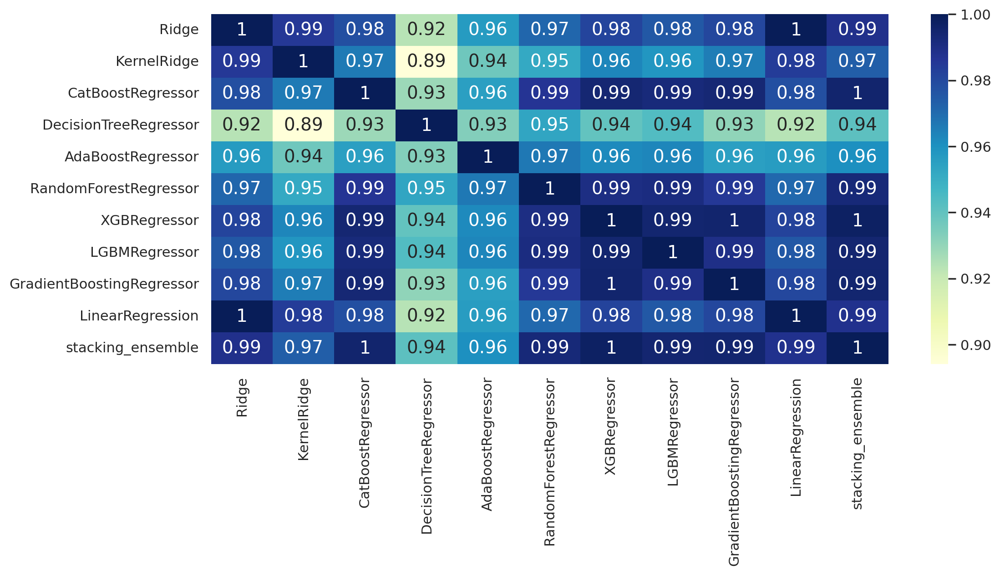

In [ ]:
# TODO : run correlation analysis of base models predictions along with the predictions of the stacking ensemble

columns = list(base_models_to_use.keys())
columns.append('stacking_ensemble')

df = pd.DataFrame(final_matrix, columns = columns)

# plot heatmap
fig,ax = plt.subplots(nrows=1, ncols=1, figsize=(12,5))
sns.heatmap(df.corr(), cmap ="YlGnBu", annot=True, annot_kws={"size":14}, ax=ax)
plt.show()


> *It looks like the predictions of `CatBoostRegressor` and `XGBRegressor` have a perfect correlation with those produced by the stacking ensemble and since `CatBoostRegressor` performs better than  `XGBRegressor`, we will select `CatBoostRegressor` model to be the representative of the stacking ensemble when performing model interpretation using `shap`.*

<br>

Shap helps to assess the relative importance and impact of each feature on the model’s predictions.

**Magnitude and sign of shap values**. Each point on the x-axis represents the shap value  points associated with each feature on the y-axis, where each point represent the shap value of a particular instance in the data.

The magnitude of shap value indicates the relative impact of the associated feature on the predicted outcome, this is reflected visually by the distance of the points from zero, where the further away they are from both sides of zero, the more the influential they are. Accordingly, the features in the beeswarm plot are visually ranked by feature importance in descending order.

This brings us to the sign of the shap value, which indicates the direction of the impact, with positive shap values indicating the feature contributes positively to the model’s prediction and makes it higher, conversely a negative sign means the feature contributes negatively to the prediction and pushes its value to be lower.

The color scale represents the change of feature values, this helps to understand how does the model prediction changes as the values of the feature change.  In our case, the dark blue color indicates lower feature values, while the bright yellow color represents higher values.

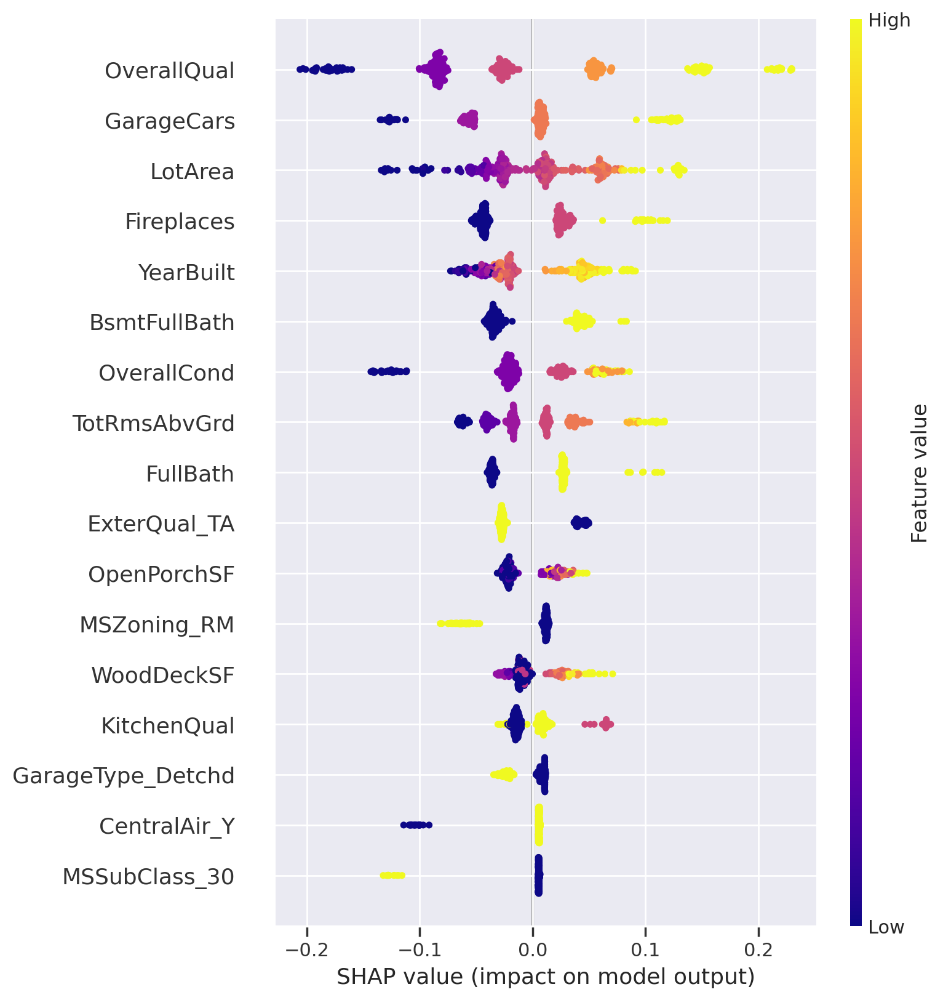

In [ ]:
gb_model =  optimized_models['CatBoostRegressor']
gb_model.fit(X_train, y_log_train_clean)

# calculate SHAP values
explainer = shap.Explainer(gb_model)
shap_values = explainer.shap_values(X_valid)
shap.summary_plot(shap_values, X_valid, cmap = "plasma")


**Insights** :

- `OverallQual` is an ordinal feature that scores from 1 to 10, the plot reveals that houses with a low overall quality scores significantly reduce the predicted house price, this is reflected by the extended dark blue points to the far left of zero. Meanwhile houses that were assigned higher quality score had a notable positive impact on the model’s prediction, this reflected by the bright yello points that extend to the far right of the x-axis.

- Similarly smaller houses (with smaller `LotArea`) significantly negatively impact the predicted house price, meanwhile the larger the house the more positively it impact house prediction

- Houses with zero capacity of cars (that is houses that do not have garages are colored in dark blue) significantly hurt the price of the house and the larger the garage  the higher the predicted house value.

- For the `YearBuilt` feature, as expected, older houses negatively impact the predicted price for the house, meanwhile  newer houses significantly impact price prediction.

<br>

> *When looking at the overall condition of the houses `OverallCond` , we can clearly see that the dark blue points extend much further to the left compared to other features. These points correspond to the houses with the worst overall condition and they have the most negative SHAP values. This means that houses with really bad condition has the biggest impact on lowering its price.*

<br>

- Houses with no fireplaces negatively impact the predicted house price whereas the more fireplaces the house contains the more positive the impact on the predicted house price, this is reflected by the yellow line to the right and the dark blue cluster on the left of zero.

<br>

> *Most Houses don’t have an open porch `OpenPorchSF` or wooden deck  `WoodDeckSF` this is why there is a cluster of dark blue points close to zero,  indicating that houses that don’t have these facilities negatively impact the predicted price by a small amount, however having these facilites do increase the value of the house with larger facilities having a greater impact. This is evident from the yellow points extending to the right of the x-axis.*

<br>

- Binary features have only two colors bright yellow that refers to the presence of the feature and dark blue color that indicates its lack of presence. Such as `ExterQual_TA`, `MSZoning_RM`,  `GarageType_Detchd`,  `MSSubClass_30` and `CentralAir_Y`.


- `ExterQual_TA`, `MSZoning_RM`,  `GarageType_Detchd`,  `MSSubClass_30` display the same pattern where the dark blue cluster is to the right of the x-axis and the yellow cluster is to the left, this means that houses that have a detached garage or that are  are located in a Residential Medium Density zone, also houses with a quality of the material on the exterior that is rated as Average or Typical  negatively impact the prediction of the price.

- Meanwhile houses that don’t have a built-in Central air conditioning `CentralAir_Y` negatively impact the predicted house price, this reflected by the points extending to the dark blue line to the left meanwhile houses that do positively impact the price.


<br>

> *We found certain features that negatively influence the house price, Notably, when the quality of the material on the exterior is rated as Average or Typical, it might be perceived as unremarkable or bland or not durabale and more prone to damage . Additionally, if the house is located in a Residential Medium Density zone.
But here's the most captivating part:  having a detached garage from the house impacts the property's value, I might be that house residents do not prefer going outside to reach their car especially during bad weather, and may generally prefer the convenience and accessibility of an attached garage.*

<br>